In [1]:
#@title CELL 0: HYBRID SETUP (Local + Colab)
"""
===============================================================================
HYBRID SETUP v2.0
- Detects Colab via importlib.util.find_spec("google.colab")
- Standardizes on numpy>=2.0 everywhere, with fallback to numpy<2.0
- Centralizes ALL path resolution (no PATH_FALLBACK needed downstream)
- Uses requirements.txt for core package installation
===============================================================================
"""

import sys
import subprocess
import time
import warnings
import importlib
import importlib.util
import site
from pathlib import Path
import shlex

warnings.filterwarnings('ignore')

print("=" * 70)
print("🚀 HYBRID SETUP v2.0")
print("=" * 70)

# ============================================================================
# ENV DETECTION
# ============================================================================
try:
    IN_COLAB = importlib.util.find_spec("google.colab") is not None
except Exception:
    IN_COLAB = False
print(f"🔍 IN_COLAB = {IN_COLAB}")

# ============================================================================
# HELPER
# ============================================================================
def run_command(cmd, description=None, max_retries=3, wait=2, timeout=120):
    if description:
        print(f"  ▶ {description}...")
    for attempt in range(1, max_retries + 1):
        if attempt > 1:
            print(f"    Retry {attempt}/{max_retries}...")
            time.sleep(wait)
        try:
            if isinstance(cmd, str):
                cmd = shlex.split(cmd)
            result = subprocess.run(
                cmd, capture_output=True, text=True,
                timeout=timeout, check=False
            )
            if result.returncode == 0:
                if result.stdout:
                    output = result.stdout.strip()
                    if len(output) > 200:
                        output = output[:200] + "..."
                    print(f"    {output}")
                return True
            else:
                error_msg = result.stderr.strip()
                if len(error_msg) > 100:
                    error_msg = error_msg[:100] + "..."
                print(f"    Attempt {attempt} failed: {error_msg}")
        except subprocess.TimeoutExpired:
            print(f"    Attempt {attempt} timed out after {timeout}s")
        except Exception as e:
            print(f"    Attempt {attempt} error: {e}")
    print(f"  ❌ Command failed after {max_retries} attempts: {cmd}")
    return False

# ============================================================================
# PATH RESOLUTION (moved earlier to locate requirements.txt)
# ============================================================================
print("[0] Setting up paths...")

if IN_COLAB:
    from google.colab import drive
    if not Path("/content/drive/MyDrive").exists():
        drive.mount('/content/drive')
    CACHE_DIR = Path("/content/wqm_data")
    RESULTS_DIR = Path("/content/drive/MyDrive/wqm_data")
    DATA_DIR = RESULTS_DIR
    REPO_PATH = Path("/content")
else:
    REPO_PATH = Path.cwd().resolve()
    for _ in range(6):
        if (REPO_PATH / "notebooks").exists() or (REPO_PATH / "src").exists() or (REPO_PATH / ".git").exists():
            break
        REPO_PATH = REPO_PATH.parent
    DATA_DIR = REPO_PATH / "data"
    CACHE_DIR = DATA_DIR / "cache"
    RESULTS_DIR = REPO_PATH / "results"

# Legacy aliases
LOCAL_CACHE = CACHE_DIR
GDRIVE_BASE = RESULTS_DIR
OUTPUT_DIR = RESULTS_DIR
DRIVE_CACHE = RESULTS_DIR
GEOJSON_PATH = DATA_DIR / "LDB_centroids_clean.geojson"

CACHE_DIR.mkdir(parents=True, exist_ok=True)
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

print(f"  IN_COLAB = {IN_COLAB}")
print(f"  REPO_PATH = {REPO_PATH}")
print(f"  DATA_DIR = {DATA_DIR}")
print(f"  CACHE_DIR = {CACHE_DIR}")
print(f"  RESULTS_DIR = {RESULTS_DIR}")
print(f"  GEOJSON_PATH = {GEOJSON_PATH}")

if not GEOJSON_PATH.exists():
    raise FileNotFoundError(f"❌ GeoJSON not found at: {GEOJSON_PATH}")
print(f"✅ GeoJSON found: {GEOJSON_PATH}")

# ============================================================================
# LOAD REQUIREMENTS.TXT
# ============================================================================
requirements_path = REPO_PATH / "requirements.txt"
if requirements_path.exists():
    with open(requirements_path) as f:
        CORE_PACKAGES = [
            line.strip() for line in f
            if line.strip() and not line.strip().startswith("#")
        ]
    # numpy is installed separately above; exclude it from bulk install
    CORE_PACKAGES = [pkg for pkg in CORE_PACKAGES if not pkg.lower().startswith("numpy")]
    print(f"  📦 Loaded {len(CORE_PACKAGES)} packages from requirements.txt")
else:
    print(f"  ⚠️  requirements.txt not found at {requirements_path}, using fallback list")
    CORE_PACKAGES = [
        "scipy>=1.9",
        "pandas>=2.0,<3.0",
        "matplotlib>=3.5",
        "shapely>=2.0",
        "tqdm>=4.60",
        "ipywidgets>=8.0",
        "jijmodeling>=1.0,<2.0",
        "openjij>=0.12",
        "ommx-pyscipopt-adapter>=2.0",
        "optuna>=3.0",
        "wandb>=0.15",
    ]

# ============================================================================
# INSTALLATION
# ============================================================================
print("[1] Upgrading pip and certifi...")
run_command([sys.executable, "-m", "pip", "install", "--upgrade", "pip", "certifi"], "Upgrade pip/certifi")

print("[2] Installing numpy>=2.0...")
run_command([sys.executable, "-m", "pip", "install", "--only-binary=:all:", "numpy>=2.0"], "Install numpy>=2.0")

print("[3] Installing core packages...")
success = run_command([sys.executable, "-m", "pip", "install"] + CORE_PACKAGES, "Install core packages")

if not success:
    print("\n⚠️ Install failed with numpy>=2.0. Falling back to numpy<2.0...")
    run_command([sys.executable, "-m", "pip", "install", "--only-binary=:all:", "numpy<2.0"], "Downgrade numpy")
    run_command([sys.executable, "-m", "pip", "install"] + CORE_PACKAGES, "Retry install core packages")

# ============================================================================
# REFRESH CACHE
# ============================================================================
print("[4] Refreshing Python paths...")
try:
    site.main()
except Exception as e:
    print(f"    ⚠️  site.main() skipped: {e}")
importlib.invalidate_caches()
print("  ✅ Paths refreshed.")

# Add repo root to Python path
sys.path.insert(0, str(REPO_PATH))
sys.path.insert(0, str(REPO_PATH / "src"))

# ============================================================================
# MODULE PURGE
# ============================================================================
modules_to_reload = [
    'src.model', 'src.solvers', 'src.plotting', 'src.environment',
    'src.experiment', 'src.jij_model', 'src.jij_solvers', 'src.jij_optuna',
    'data.synthetic_data', 'tests.benchmark'
]
for mod in modules_to_reload:
    if mod in sys.modules:
        del sys.modules[mod]
        print(f"🔄 Reloaded: {mod}")

print("\n" + "=" * 70)
print("✅ SETUP COMPLETE")
print("=" * 70)

🚀 HYBRID SETUP v2.0
🔍 IN_COLAB = False
[0] Setting up paths...
  IN_COLAB = False
  REPO_PATH = /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo
  DATA_DIR = /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data
  CACHE_DIR = /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache
  RESULTS_DIR = /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results
  GEOJSON_PATH = /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/LDB_centroids_clean.geojson
✅ GeoJSON found: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/LDB_centroids_clean.geojson
  📦 Loaded 20 packages from requirements.txt
[1] Upgrading pip and certifi...

In [2]:
#@title CELL 0.5: SHARED PLOTTING FUNCTIONS (Extended for v6.5)
"""
===============================================================================
SHARED PLOTTING FUNCTIONS
- Defined once here for reuse by Cells 5, 6, 7, 8, 9, 10
- Consuming cells have fallback copies guarded by try/except NameError
- v6.5 adds survival functions, tables, and new plot sets
===============================================================================
"""

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib.ticker import MaxNLocator
import math

# These are populated by Cell 0 and Cell 2
try:
    coords_master  # noqa: F821
except NameError:
    coords_master = None
try:
    U_master  # noqa: F821
except NameError:
    U_master = None


# -----------------------------------------------------------------------------
# EXISTING PLOTTING FUNCTIONS (unchanged)
# -----------------------------------------------------------------------------
def plot_deployment(instance_data, result_or_solution, save_path=None, show=True, dpi=150, metrics=None):
    """
    Plot deployment with a metrics textbox on the right.
    (Same as before, kept for compatibility.)
    """
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    import numpy as np
    from matplotlib.collections import LineCollection

    coords_full = np.asarray(instance_data["original_coords"])
    D_MAX = instance_data["D_max"]
    L_c = instance_data.get("L_c", None)
    fixed_indices = list(instance_data.get("fixed_indices", []))
    free_indices = list(instance_data.get("original_indices", []))

    # Extract solution
    if isinstance(result_or_solution, dict):
        x_sol = result_or_solution.get("solution")
    else:
        x_sol = result_or_solution
    x_sol = np.asarray(x_sol, dtype=int) if x_sol is not None else np.zeros(len(free_indices), dtype=int)

    selected_free_orig = [free_indices[i] for i in np.where(x_sol == 1)[0] if i < len(free_indices)]
    selected_new = [i for i in selected_free_orig if i not in fixed_indices]
    selected_m = fixed_indices
    all_selected = selected_new + selected_m

    # Compute energy if metrics not provided (simplified)
    if metrics is None:
        metrics = {}
    if 'energy' not in metrics:
        a = np.asarray(instance_data.get('a', []))
        Q_edges = instance_data.get('Q_edges', [])
        x_master = np.zeros(len(a), dtype=int)
        for i, val in enumerate(x_sol):
            if val == 1 and i < len(free_indices):
                master_idx = free_indices[i]
                if master_idx < len(a):
                    x_master[master_idx] = 1
        for idx in fixed_indices:
            if idx < len(a):
                x_master[idx] = 1
        energy = 0.0
        energy += np.dot(a, x_master.astype(float))
        for i, j, val in Q_edges:
            if x_master[i] and x_master[j]:
                energy += val
        metrics['energy'] = float(energy)

    metrics.setdefault('budget_viol', 0)
    metrics.setdefault('conn_viol', 0)
    metrics.setdefault('feasible', False)
    metrics.setdefault('master_energy', float('nan'))
    metrics.setdefault('best_by_viol_energy', float('nan'))
    metrics.setdefault('avg_energy', float('nan'))

    # Prepare figure with two panels
    fig = plt.figure(figsize=(14, 7))
    gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1.8], wspace=0.2)
    ax = fig.add_subplot(gs[0])
    ax_metrics = fig.add_subplot(gs[1])
    ax_metrics.axis('off')

    # Background, edges, points (same as before)
    if coords_master is not None and U_master is not None:
        sc = ax.scatter(coords_master[:, 0], coords_master[:, 1], c=U_master, cmap='viridis',
                        s=22, alpha=0.55, edgecolor='none', zorder=0, label='Utility Background')
        plt.colorbar(sc, ax=ax, orientation='vertical', fraction=0.046, pad=0.04).set_label('Utility $U_i$', fontsize=11)
    else:
        ax.scatter(coords_full[:, 0], coords_full[:, 1], c="#cbd5e1", s=22, alpha=0.6, edgecolor='none', zorder=0)

    selected_set = set(all_selected)
    selected_edges = []
    valid_edges_lc = instance_data.get("valid_edges_lc", None)
    if valid_edges_lc is not None:
        for (i, j) in valid_edges_lc:
            if i in selected_set and j in selected_set:
                selected_edges.append((i, j))
    else:
        try:
            from scipy.spatial import cKDTree
            tree = cKDTree(coords_full)
            pairs = tree.query_pairs(r=D_MAX)
            for (i, j) in pairs:
                if i in selected_set and j in selected_set:
                    selected_edges.append((i, j))
        except:
            pass

    if selected_edges:
        segments = [[(coords_full[i, 0], coords_full[i, 1]),
                     (coords_full[j, 0], coords_full[j, 1])] for i, j in selected_edges]
        lc = LineCollection(segments, colors='#475569', alpha=0.5, linewidth=1.2,
                            linestyle='--', zorder=1)
        ax.add_collection(lc)

    if free_indices:
        candidate_coords = coords_full[free_indices]
        ax.scatter(candidate_coords[:, 0], candidate_coords[:, 1], c='white', s=40,
                   alpha=0.9, edgecolor='#1e293b', linewidth=0.8, label='Candidates', zorder=2)
    if selected_m:
        ax.scatter(coords_full[selected_m, 0], coords_full[selected_m, 1],
                   c='blue', s=110, marker='s', edgecolor='black', linewidth=1.2,
                   label=f'Existing ({len(selected_m)})', zorder=3)
    if selected_new:
        ax.scatter(coords_full[selected_new, 0], coords_full[selected_new, 1],
                   c='red', s=110, marker='o', edgecolor='black', linewidth=1.2,
                   label=f'New ({len(selected_new)})', zorder=4)

    ax.set_xlabel('Easting (m)', fontsize=11)
    ax.set_ylabel('Northing (m)', fontsize=11)
    ax.set_title('Deployment', fontsize=13, fontweight='bold', pad=10)
    ax.set_aspect('equal', adjustable='datalim')
    if coords_master is not None and len(coords_master) > 0:
        xmin, ymin = coords_master.min(axis=0)
        xmax, ymax = coords_master.max(axis=0)
    else:
        xmin, ymin = coords_full.min(axis=0)
        xmax, ymax = coords_full.max(axis=0)
    pad_x = max(0.05 * (xmax - xmin), 1.0)
    pad_y = max(0.05 * (ymax - ymin), 1.0)
    ax.set_xlim(xmin - pad_x, xmax + pad_x)
    ax.set_ylim(ymin - pad_y, ymax + pad_y)

    lc_label = 'Link (2·L_c, landmass-aware)' if L_c is not None else f'Link (≤ {D_MAX:.1f}m)'
    handles = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=9, markeredgecolor='black', label=f'New ({len(selected_new)})'),
        plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='blue', markersize=9, markeredgecolor='black', label=f'Existing ({len(selected_m)})'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='white', markersize=8, markeredgecolor='#1e293b', label=f'Candidates ({len(free_indices)})'),
        plt.Line2D([0], [0], color='#475569', linewidth=1.2, linestyle='--', label=lc_label)
    ]
    ax.legend(handles=handles, loc='upper right', frameon=True, fontsize=9)

    # Right panel: metrics textbox
    text_lines = []
    text_lines.append("===== METRICS =====")
    text_lines.append(f"Total Energy       : {metrics['energy']:>12.4f}")
    text_lines.append(f"Best by Viol Energy: {metrics['best_by_viol_energy']:>12.4f}")
    text_lines.append(f"Avg Energy         : {metrics['avg_energy']:>12.4f}")
    text_lines.append(f"Master Energy      : {metrics['master_energy']:>12.4f}")
    text_lines.append("")
    text_lines.append(f"Budget Viol        : {metrics['budget_viol']:>4d}")
    text_lines.append(f"Conn Viol          : {metrics['conn_viol']:>4d}")
    text_lines.append(f"Feasible           : {metrics['feasible']}")
    text_lines.append("")
    text_lines.append("----- Selected Indices -----")
    if selected_new:
        text_lines.append(f"New ({len(selected_new)}): {', '.join(map(str, selected_new))}")
    else:
        text_lines.append("New: (none)")
    if selected_m:
        text_lines.append(f"Existing ({len(selected_m)}): {', '.join(map(str, selected_m))}")
    else:
        text_lines.append("Existing: (none)")

    if selected_new or selected_m:
        text_lines.append("")
        text_lines.append("----- Coordinates (m) -----")
        for idx in (selected_new + selected_m):
            x, y = coords_full[idx]
            text_lines.append(f"  {idx:3d}: ({x:8.1f}, {y:8.1f})")

    text_str = "\n".join(text_lines)
    ax_metrics.text(0.05, 0.95, text_str, transform=ax_metrics.transAxes,
                    fontsize=9, verticalalignment='top', horizontalalignment='left',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.85, edgecolor='#333'),
                    family='monospace')
    ax_metrics.set_title("Deployment Summary", fontsize=11, fontweight='bold', pad=10)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
    if show:
        plt.show()
    plt.close(fig)


def plot_miqp_matrix_reduced(instance_data, save_path=None, show=True, dpi=150, title_prefix="", sort_by="coords"):
    N = instance_data["N"]
    a = np.asarray(instance_data["a"], dtype=float)
    Q_edges = instance_data.get("Q_edges", [])
    mat = np.zeros((N, N), dtype=float)
    np.fill_diagonal(mat, a)
    for i, j, val in Q_edges:
        mat[i, j] = val
        mat[j, i] = val

    if sort_by == "coords" and "coords" in instance_data:
        coords_free = np.asarray(instance_data["coords"])
        order = np.lexsort((coords_free[:, 0], -coords_free[:, 1]))
        mat = mat[np.ix_(order, order)]
        title_suffix = " (Spatially Sorted)"
    else:
        title_suffix = ""

    off_diag_mask = ~np.eye(N, dtype=bool)
    off_diag_vals = mat[off_diag_mask]
    if len(off_diag_vals) > 0 and np.max(np.abs(off_diag_vals)) > 0:
        max_val = np.max(np.abs(off_diag_vals))
        norm = mcolors.Normalize(vmin=-max_val, vmax=max_val)
        cbar_label = f"Quadratic Coeffs (±{max_val:.2f})"
    else:
        max_val = np.max(np.abs(mat)) if np.max(np.abs(mat)) > 0 else 1.0
        norm = mcolors.Normalize(vmin=-max_val, vmax=max_val)
        cbar_label = "Coefficient Value"

    fig, ax = plt.subplots(figsize=(7, 5.5))
    im = ax.imshow(mat, cmap='RdBu_r', aspect='auto', norm=norm)
    ax.set_title(f"{title_prefix}Reduced MIQP Matrix (N={N}){title_suffix}", fontsize=12, fontweight='bold')
    ax.set_xlabel("Variable Index (spatial order)" if sort_by == "coords" else "Variable Index", fontsize=10)
    ax.set_ylabel("Variable Index (spatial order)" if sort_by == "coords" else "Variable Index", fontsize=10)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label(cbar_label, fontsize=9)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
    if show:
        plt.show()
    plt.close(fig)


def plot_qubo_matrix(instance, penalty_weights, N, coords=None, sort_by="coords",
                     save_path=None, show=True, dpi=150, title_prefix=""):
    """
    Plot the QUBO matrix with optional spatial sorting.
    """
    qubo_dict, offset = instance.to_qubo(penalty_weights=penalty_weights)
    Q_mat = np.zeros((N, N), dtype=float)

    def extract_idx(key):
        if isinstance(key, tuple):
            if len(key) == 2 and isinstance(key[0], str) and key[0] == 'x':
                return key[1]
            for elem in key:
                if not isinstance(elem, str):
                    return elem
            return key[0]
        return key

    for (key_i, key_j), val in qubo_dict.items():
        i = extract_idx(key_i)
        j = extract_idx(key_j)
        if isinstance(i, int) and isinstance(j, int) and i < N and j < N:
            Q_mat[i, j] = val

    Q_mat = Q_mat + Q_mat.T - np.diag(np.diag(Q_mat))

    if sort_by == "coords" and coords is not None and len(coords) == N:
        order = np.lexsort((coords[:, 0], -coords[:, 1]))
        Q_mat = Q_mat[np.ix_(order, order)]
        title_suffix = " (Spatially Sorted)"
        xlabel = "Variable Index (spatial order)"
        ylabel = "Variable Index (spatial order)"
    else:
        title_suffix = ""
        xlabel = "Variable Index"
        ylabel = "Variable Index"

    max_abs = np.max(np.abs(Q_mat)) if np.max(np.abs(Q_mat)) > 0 else 1.0
    norm = mcolors.Normalize(vmin=-max_abs, vmax=max_abs)

    fig, ax = plt.subplots(figsize=(8, 7))
    im = ax.imshow(Q_mat, cmap='RdBu_r', aspect='auto', norm=norm)
    ax.set_title(f"{title_prefix}QUBO Matrix (free variables) N={N}{title_suffix}",
                 fontsize=12, fontweight='bold')
    ax.set_xlabel(xlabel, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=10)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label("Coefficient Value")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
    if show:
        plt.show()
    plt.close(fig)

In [3]:
#@title CELL 1: MASTER CONTROL FLAGS + SIMULATION CONFIGS
# ============================================================================
# Recompute flags
# ============================================================================
FORCE_RECOMPUTE_MASTER = False
FORCE_RECOMPUTE_SCALING = False
FORCE_RECOMPUTE_QUBO = False
FORCE_RECOMPUTE_SCIP = False
FORCE_RETUNE_SA = True
FORCE_RETUNE_SQA = False
FORCE_ALL_RECOMPUTE = False

if FORCE_ALL_RECOMPUTE:
    FORCE_RECOMPUTE_MASTER = True
    FORCE_RECOMPUTE_SCALING = True
    FORCE_RECOMPUTE_QUBO = True
    FORCE_RECOMPUTE_SCIP = True
    FORCE_RETUNE_SA = True
    FORCE_RETUNE_SQA = True

print("🔧 Master Control Flags:")
print(f"   FORCE_RECOMPUTE_MASTER = {FORCE_RECOMPUTE_MASTER}")
print(f"   FORCE_RECOMPUTE_SCALING = {FORCE_RECOMPUTE_SCALING}")
print(f"   FORCE_RECOMPUTE_QUBO = {FORCE_RECOMPUTE_QUBO}")
print(f"   FORCE_RECOMPUTE_SCIP = {FORCE_RECOMPUTE_SCIP}")
print(f"   FORCE_RETUNE_SA = {FORCE_RETUNE_SA}")
print(f"   FORCE_RETUNE_SQA = {FORCE_RETUNE_SQA}")

# ============================================================================
# SA Tuning Config
# ============================================================================
CONFIG_SA = {
    "TARGET_N": None,
    "NUM_SWEEPS": 1000,
    "NUM_READS": 1024,
    "SYNC_INTERVAL": 5,
    "N_STARTUP": 30,
    "PATIENCE": 30,
    "MAX_FLOOR_HITS": 10,
    "TARGET_P": 0.99,
    "LAMBDA_LOWER": 0.0001,
    "USE_WANDB": True,
    "WANDB_PROJECT": "wqm-placement-optimization",
    "LOG_WANDB_TABLE": True,
    "SAVE_SA_SAMPLES": True,
}

# ============================================================================
# SQA Tuning Config (placeholder for Cells 8-9)
# ============================================================================
CONFIG_SQA = {
    "TARGET_N": None,
    "NUM_SWEEPS": 1000,
    "NUM_READS": 1024,
    "TROTTER": 4,
    "SCHEDULE": "linear",
    "SYNC_INTERVAL": 5,
    "WARMUP_TRIALS": 15,
    "MAX_FLOOR_HITS": 10,
    "TARGET_P": 0.99,
    "USE_WANDB": True,
    "WANDB_PROJECT": "wqm-placement-optimization",
    "LOG_WANDB_TABLE": True,
    "SAVE_SQA_SAMPLES": True,
}

# ============================================================================
# Final Benchmark Config
# ============================================================================
CONFIG_BENCH = {
    "N_TESTS": [20, 50, 100, 200, 500, 1000],
    "NUM_READS": 256,
    "NUM_SWEEPS": 200,
    "RANDOM_SOLUTIONS": 5,
    "REPEAT_TIMES": 3,
    "CACHE_FILE": str(CACHE_DIR / "benchmark_results.pkl"),
}

print("\n✅ Simulation configs defined.")


🔧 Master Control Flags:
   FORCE_RECOMPUTE_MASTER = False
   FORCE_RECOMPUTE_SCALING = False
   FORCE_RECOMPUTE_QUBO = False
   FORCE_RECOMPUTE_SCIP = False
   FORCE_RETUNE_SA = True
   FORCE_RETUNE_SQA = False

✅ Simulation configs defined.


✅ GeoJSON found: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/LDB_centroids_clean.geojson
🔑 Master config hash: 241358d8
📂 Loading hashed master data from local cache...
✅ Loaded master data: N_sites=5417, Q_edges=2045178
   Existing stations: 15
   U range: 0.0551 to 0.8957


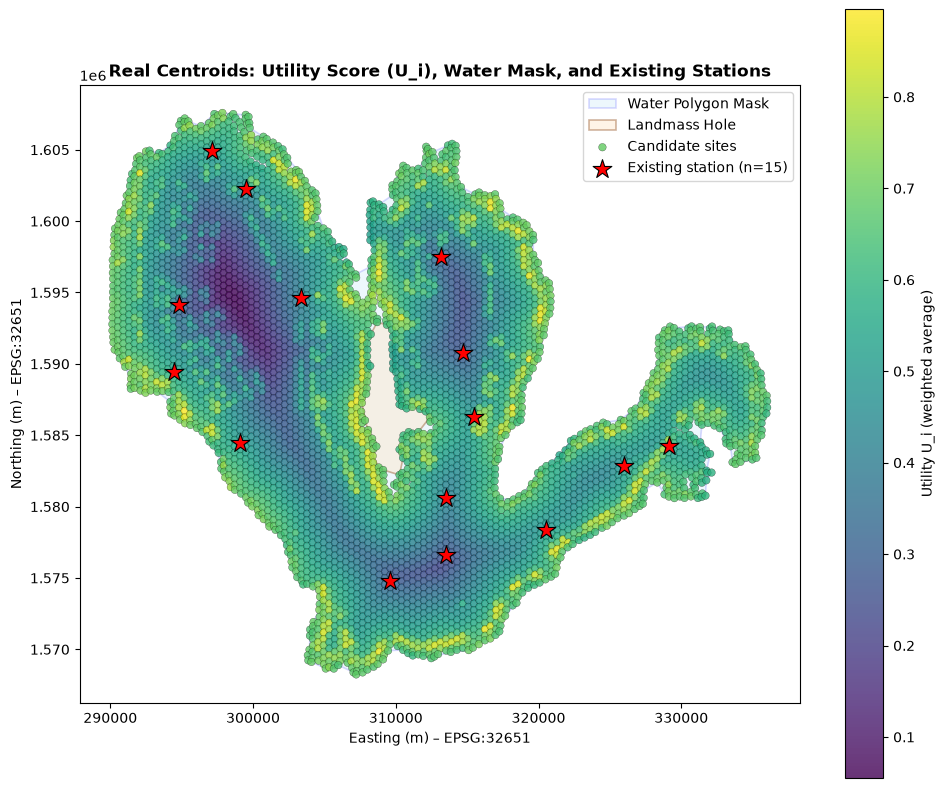

✅ Master data loaded and ready. Skipping recomputation.
✅ Cell 2 complete. Master data ready.


In [4]:
#@title CELL 2: REAL DATA INGESTOR + MASTER MIQP (Resumable, Config‑Aware)
# =============================================================================
# REVISION: Resumable – loads master_real_{config_hash}.pkl if available.
# - Uses FORCE_RECOMPUTE_MASTER flag from Cell 1.
# - Dual storage: local and Drive.
# - Filename includes config_hash to invalidate on QUBO parameter changes.
# - Backward‑compatible: falls back to master_real.pkl if hashed version missing.
# =============================================================================
import json
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from pathlib import Path
import shapely
from shapely.geometry import MultiPoint, Polygon, LineString, Point
from tqdm.notebook import tqdm
import warnings
import hashlib
import shutil

warnings.filterwarnings('ignore')

# -----------------------------------------------------------------------------
# USER CONFIGURATION (unchanged)
# -----------------------------------------------------------------------------
# === PATH FALLBACK (hybrid: Colab + local) ===
try:
    CACHE_DIR
except NameError:
    import importlib.util
    try:
        IN_COLAB = importlib.util.find_spec("google.colab") is not None
    except Exception:
        IN_COLAB = False
    if IN_COLAB:
        from google.colab import drive
        if not Path("/content/drive/MyDrive").exists():
            drive.mount("/content/drive")
        CACHE_DIR = Path("/content/wqm_data")
        RESULTS_DIR = Path("/content/drive/MyDrive/wqm_data")
        DATA_DIR = RESULTS_DIR
    else:
        REPO_PATH = Path.cwd().resolve()
        for _ in range(6):
            if (REPO_PATH / "notebooks").exists() or (REPO_PATH / "src").exists() or (REPO_PATH / ".git").exists():
                break
            REPO_PATH = REPO_PATH.parent
        DATA_DIR = REPO_PATH / "data"
        CACHE_DIR = DATA_DIR / "cache"
        RESULTS_DIR = REPO_PATH / "results"
    # Legacy aliases (used by existing cell code)
    LOCAL_CACHE = CACHE_DIR
    GDRIVE_BASE = RESULTS_DIR
    OUTPUT_DIR = RESULTS_DIR
    DRIVE_CACHE = RESULTS_DIR
    GEOJSON_PATH = DATA_DIR / "LDB_centroids_clean.geojson"
    CACHE_DIR.mkdir(parents=True, exist_ok=True)
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)

GEOJSON_PATH = DATA_DIR / "LDB_centroids_clean.geojson"

if not GEOJSON_PATH.exists():
    raise FileNotFoundError(f"❌ GeoJSON not found at: {GEOJSON_PATH}")

print(f"✅ GeoJSON found: {GEOJSON_PATH}")

WEIGHTS = np.array([0.3671, 0.1224, 0.2508, 0.0502, 0.1278, 0.0183, 0.0476, 0.0159], dtype=np.float64)

FACTOR_NAMES = [
    "a1_river_proximity",
    "a2_runoff_proximity",
    "b1_fishpen_density",
    "b2_hypoxic_proximity",
    "c1_bathymetric_depressions",
    "c2_outlet_proximity",
    "d1_boatramp_proximity",
    "d2_road_proximity",
]

HULL_RATIO = 0.05
N_EXISTING_FALLBACK = 3
MIN_EXISTING_DIST_FALLBACK = 12000

MASTER_QUBO_CONFIG = {
    "L_c": 7500.0,
    "L_w": 1000.0,
    "Beta": 1.0,
    "Delta": 1.0,
    "Current_vector": (1.0, 0.0),
    "K": 5,
    "D_max_buffer": 1.15,
}

# ---- Compute config hash ----
config_str = json.dumps(MASTER_QUBO_CONFIG, sort_keys=True)
config_hash = hashlib.md5(config_str.encode()).hexdigest()[:8]
print(f"🔑 Master config hash: {config_hash}")

# -----------------------------------------------------------------------------
# RESUME LOGIC (with fallback to unhashed)
# -----------------------------------------------------------------------------
master_path_local = LOCAL_CACHE / f"master_real_{config_hash}.pkl"
master_path_drive = OUTPUT_DIR / f"master_real_{config_hash}.pkl"
master_data = None

# 1. Try hashed version
if not FORCE_RECOMPUTE_MASTER:
    if master_path_local.exists():
        print("📂 Loading hashed master data from local cache...")
        with open(master_path_local, "rb") as f:
            master_data = pickle.load(f)
    elif master_path_drive.exists():
        print("📂 Loading hashed master data from Drive (copying to local)...")
        shutil.copy(master_path_drive, master_path_local)
        with open(master_path_local, "rb") as f:
            master_data = pickle.load(f)

# 2. If not found, try unhashed version (backward compatibility)
if master_data is None and not FORCE_RECOMPUTE_MASTER:
    unhashed_local = LOCAL_CACHE / "master_real.pkl"
    unhashed_drive = OUTPUT_DIR / "master_real.pkl"
    if unhashed_local.exists():
        print("📂 Loading unhashed master data from local cache (migrating to hashed)...")
        with open(unhashed_local, "rb") as f:
            master_data = pickle.load(f)
        # Save with hash for future
        with open(master_path_local, "wb") as f:
            pickle.dump(master_data, f)
        with open(master_path_drive, "wb") as f:
            pickle.dump(master_data, f)
        print(f"✅ Migrated master data to hashed version: {master_path_local}")
    elif unhashed_drive.exists():
        print("📂 Loading unhashed master data from Drive (migrating to hashed)...")
        shutil.copy(unhashed_drive, unhashed_local)
        with open(unhashed_local, "rb") as f:
            master_data = pickle.load(f)
        # Save with hash
        with open(master_path_local, "wb") as f:
            pickle.dump(master_data, f)
        with open(master_path_drive, "wb") as f:
            pickle.dump(master_data, f)
        print(f"✅ Migrated master data to hashed version: {master_path_local}")

if master_data is not None:
    # Unpack loaded data
    coords = master_data["coords"]
    factors = master_data["factors"]
    U = master_data["U"]
    M_indices = master_data["M_indices"]
    has_existing = master_data["has_existing"]
    water_polygon = master_data["water_polygon"]
    a_master = master_data["a"]
    Q_master_edges = master_data["Q_edges"]
    metadata = master_data["metadata"]
    bbox = metadata["bbox"]
    M_set_global = set(M_indices)

    n_sites = len(coords)
    print(f"✅ Loaded master data: N_sites={n_sites}, Q_edges={len(Q_master_edges)}")
    print(f"   Existing stations: {len(M_indices)}")
    print(f"   U range: {U.min():.4f} to {U.max():.4f}")

    # Recreate plot from loaded data
    fig, ax = plt.subplots(figsize=(10, 8))
    if isinstance(water_polygon, Polygon):
        x, y = water_polygon.exterior.xy
        ax.fill(x, y, alpha=0.15, fc="skyblue", ec="blue", linewidth=1.2, label="Water Polygon Mask", zorder=0)
        for interior in water_polygon.interiors:
            ix, iy = interior.xy
            ax.fill(ix, iy, alpha=0.4, fc="bisque", ec="saddlebrown", linewidth=1.2, label="Landmass Hole", zorder=1)
    sc = ax.scatter(coords[:, 0], coords[:, 1], c=U, cmap="viridis",
                    s=30, alpha=0.8, edgecolor="k", linewidth=0.2, label="Candidate sites", zorder=2)
    ax.scatter(coords[M_indices, 0], coords[M_indices, 1],
               c="red", marker="*", s=200, edgecolor="black", linewidth=0.8,
               label=f"Existing station (n={len(M_indices)})", zorder=5)
    ax.set_xlabel("Easting (m) – EPSG:32651")
    ax.set_ylabel("Northing (m) – EPSG:32651")
    ax.set_title("Real Centroids: Utility Score (U_i), Water Mask, and Existing Stations", fontweight="bold")
    cbar = plt.colorbar(sc, ax=ax, label="Utility U_i (weighted average)")
    ax.legend(loc="upper right")
    ax.set_aspect("equal")
    plt.tight_layout()
    plt.show()

    # We are done – skip the rest
    print("✅ Master data loaded and ready. Skipping recomputation.")
    # Ensure variables are defined for downstream
    pass
else:
    # -------------------------------------------------------------------------
    # COMPUTE FROM SCRATCH (original code)
    # -------------------------------------------------------------------------
    print("🔄 Master data not found or FORCE_RECOMPUTE_MASTER=True. Computing from scratch...")

    # ---- LOAD & PARSE GEOJSON ----
    print("📂 Loading real centroids from GeoJSON...")
    with open(GEOJSON_PATH, "r") as f:
        data = json.load(f)

    features = data["features"]
    n_sites = len(features)

    coords = np.zeros((n_sites, 2), dtype=np.float64)
    factors = np.full((n_sites, 8), np.nan, dtype=np.float64)
    has_existing = np.zeros(n_sites, dtype=bool)
    ids = np.zeros(n_sites, dtype=int)
    row_idx = np.zeros(n_sites, dtype=int)
    col_idx = np.zeros(n_sites, dtype=int)

    for i, feat in enumerate(features):
        geom = feat["geometry"]["coordinates"]
        coords[i] = [geom[0], geom[1]]
        props = feat["properties"]
        ids[i] = props["id"]
        row_idx[i] = props["row_index"]
        col_idx[i] = props["col_index"]
        has_existing[i] = props.get("has_existing_station", False)
        for j, name in enumerate(FACTOR_NAMES):
            val = props.get(name)
            if val is not None:
                factors[i, j] = val

    print(f"   ✅ Loaded {n_sites} centroids.")
    print(f"   ✅ Found {np.sum(has_existing)} sites with 'has_existing_station': true")

    # ---- COMPUTE UTILITY ----
    def compute_utility(factors, weights):
        valid_mask = ~np.isnan(factors)
        numerator = np.nansum(factors * weights, axis=1)
        denominator = np.nansum(weights * valid_mask, axis=1)
        denominator = np.where(denominator == 0, 1.0, denominator)
        U = numerator / denominator
        return np.clip(U, 0.0, 1.0)

    U = compute_utility(factors, WEIGHTS)
    print(f"   ✅ Utility U_i range: {U.min():.4f} to {U.max():.4f}")

    bbox = [coords[:, 0].min(), coords[:, 1].min(), coords[:, 0].max(), coords[:, 1].max()]
    # ---- DETERMINE EXISTING STATIONS ----
    if np.any(has_existing):
        M_indices = np.where(has_existing)[0].tolist()
        print(f"   📍 Using {len(M_indices)} real existing stations from GeoJSON.")
    else:
        print("   ⚠️  No 'has_existing_station: true' found. Falling back to simulation...")
        from scipy.spatial.distance import cdist
        n_existing = N_EXISTING_FALLBACK
        min_dist = MIN_EXISTING_DIST_FALLBACK
        selected = [int(np.argmax(U))]
        for _ in range(1, n_existing):
            dists = cdist(coords, coords[selected]).min(axis=1)
            mask = (dists >= min_dist) & (~np.isin(np.arange(n_sites), selected))
            valid = np.where(mask)[0]
            if len(valid) == 0:
                best = np.argmax(dists)
            else:
                best = valid[np.argmax(U[valid])]
            selected.append(int(best))
        M_indices = selected
        print(f"   📍 Simulated {len(M_indices)} existing stations: {M_indices}")

    M_set_global = set(M_indices)

    # ---- GENERATE CONCAVE HULL ----
    print("🗺️ Generating Concave Hull water boundary mask...")
    multi_pt = MultiPoint(coords)
    laguna_water_polygon = shapely.concave_hull(multi_pt, ratio=HULL_RATIO, allow_holes=True)
    shapely.prepare(laguna_water_polygon)
    print("   ✅ Laguna de Bay land/water boundary mask created.")
    water_polygon = laguna_water_polygon

    # ---- BUILD MASTER MIQP (SEQUENTIAL) ----
    print("\n🔧 Building Master MIQP (full grid) with sequential optimized loop...")

    master_M_coords = coords[list(M_set_global)]
    if len(master_M_coords) > 1:
        M_tree = cKDTree(master_M_coords)
        dists, _ = M_tree.query(master_M_coords, k=2)
        max_nn_dist = np.max(dists[:, 1])
        global_D_max = max_nn_dist * MASTER_QUBO_CONFIG["D_max_buffer"]
    else:
        global_D_max = 15000.0
    print(f"   Global D_max = {global_D_max:.2f} m")

    v_norm = np.linalg.norm(MASTER_QUBO_CONFIG["Current_vector"])
    v_unit = np.array(MASTER_QUBO_CONFIG["Current_vector"]) / v_norm

    tree = cKDTree(coords)
    print("   Querying spatial pairs...")
    pairs = np.array(list(tree.query_pairs(r=global_D_max)))
    print(f"   Total candidate pairs: {len(pairs):,}")

    L_c = MASTER_QUBO_CONFIG["L_c"]
    L_w = MASTER_QUBO_CONFIG["L_w"]
    beta = MASTER_QUBO_CONFIG["Beta"]
    delta = MASTER_QUBO_CONFIG["Delta"]
    L_c_2 = 2.0 * L_c
    poly = water_polygon

    all_valid_edges = []
    all_quad_edges = []

    for i, j in tqdm(pairs, desc="🔹 Processing geometry pairs", unit="pairs"):
        p1 = coords[i]
        p2 = coords[j]

        if not (poly.contains(Point(p1)) and poly.contains(Point(p2))):
            continue

        line = LineString([p1, p2])
        if not poly.contains(line):
            continue

        all_valid_edges.append((i, j))

        dx = p2[0] - p1[0]
        dy = p2[1] - p1[1]
        d = np.sqrt(dx*dx + dy*dy)
        if d <= L_c_2 and d > 0:
            R_ij = max(0.0, 1.0 - d / L_c)

            cos_theta = (dx * v_unit[0] + dy * v_unit[1]) / d
            cos_theta = np.clip(cos_theta, -1.0, 1.0)
            W_ij = (np.exp(-d / L_w) * cos_theta) if cos_theta > 0.7071 else 0.0

            cos_theta_ji = (-dx * v_unit[0] + -dy * v_unit[1]) / d
            cos_theta_ji = np.clip(cos_theta_ji, -1.0, 1.0)
            W_ji = (np.exp(-d / L_w) * cos_theta_ji) if cos_theta_ji > 0.7071 else 0.0

            coeff = beta * R_ij + delta * (W_ij + W_ji)
            if abs(coeff) > 1e-12:
                all_quad_edges.append((i, j, coeff))

    print(f"   ✅ Connectivity edges: {len(all_valid_edges):,}")
    print(f"   ✅ Non-zero quadratic edges: {len(all_quad_edges):,}")

    # ---- Absorb fixed stations ----
    free_indices = [i for i in range(n_sites) if i not in M_set_global]
    M_indices_list = list(M_set_global)

    a_master = np.zeros(n_sites, dtype=np.float64)

    for i in free_indices:
        a_master[i] = -U[i]

    quad_dict = {(i, j): val for i, j, val in all_quad_edges}
    for i in tqdm(free_indices, desc="Absorbing fixed station interactions"):
        for m in M_indices_list:
            key = (i, m) if i < m else (m, i)
            if key in quad_dict:
                a_master[i] += quad_dict[key]

    free_set = set(free_indices)
    Q_master_edges = []
    for i, j, val in all_quad_edges:
        if i in free_set and j in free_set:
            Q_master_edges.append((i, j, val))

    print(f"   ✅ Final Q_master_edges (free-free): {len(Q_master_edges):,}")

    # ---- PLOT ----
    fig, ax = plt.subplots(figsize=(10, 8))
    if isinstance(water_polygon, Polygon):
        x, y = water_polygon.exterior.xy
        ax.fill(x, y, alpha=0.15, fc="skyblue", ec="blue", linewidth=1.2, label="Water Polygon Mask", zorder=0)
        for interior in water_polygon.interiors:
            ix, iy = interior.xy
            ax.fill(ix, iy, alpha=0.4, fc="bisque", ec="saddlebrown", linewidth=1.2, label="Landmass Hole", zorder=1)
    sc = ax.scatter(coords[:, 0], coords[:, 1], c=U, cmap="viridis",
                    s=30, alpha=0.8, edgecolor="k", linewidth=0.2, label="Candidate sites", zorder=2)
    ax.scatter(coords[M_indices, 0], coords[M_indices, 1],
               c="red", marker="*", s=200, edgecolor="black", linewidth=0.8,
               label=f"Existing station (n={len(M_indices)})", zorder=5)
    ax.set_xlabel("Easting (m) – EPSG:32651")
    ax.set_ylabel("Northing (m) – EPSG:32651")
    ax.set_title("Real Centroids: Utility Score (U_i), Water Mask, and Existing Stations", fontweight="bold")
    cbar = plt.colorbar(sc, ax=ax, label="Utility U_i (weighted average)")
    ax.legend(loc="upper right")
    ax.set_aspect("equal")
    plt.tight_layout()
    plt.show()

    # ---- SAVE MASTER DATA (hashed) ----
    master_data = {
        "coords": coords,
        "factors": factors,
        "U": U,
        "M_indices": M_indices,
        "has_existing": has_existing,
        "water_polygon": water_polygon,
        "a": a_master,
        "Q_edges": Q_master_edges,
        "metadata": {
            "n_sites": n_sites,
            "weights": WEIGHTS.tolist(),
            "factor_names": FACTOR_NAMES,
            "bbox": [coords[:, 0].min(), coords[:, 1].min(),
                     coords[:, 0].max(), coords[:, 1].max()],
            "n_existing_real": int(np.sum(has_existing)),
            "n_existing_used": len(M_indices),
            "hull_ratio": HULL_RATIO,
            "master_D_max": global_D_max,
            "master_L_c": MASTER_QUBO_CONFIG["L_c"],
            "master_L_w": MASTER_QUBO_CONFIG["L_w"],
            "master_edges_count": len(Q_master_edges),
            "master_valid_edges_count": len(all_valid_edges),
        }
    }

    with open(master_path_local, "wb") as f:
        pickle.dump(master_data, f, protocol=pickle.HIGHEST_PROTOCOL)
    with open(master_path_drive, "wb") as f:
        pickle.dump(master_data, f, protocol=pickle.HIGHEST_PROTOCOL)
    print(f"✅ Master data cached to: {master_path_local} and {master_path_drive}")
    print("=" * 70)

print("✅ Cell 2 complete. Master data ready.")

📂 Loading scaling results from local cache...
✅ Loaded scaling results for tiers: [20, 50, 100, 200, 500, 1000]
   Free sites in smallest tier: 20, Fixed: 15
   Tiers summary:
      N=20: free=20, fixed=15, total=35
      N=50: free=50, fixed=15, total=65
      N=100: free=100, fixed=15, total=115
      N=200: free=200, fixed=15, total=215
      N=500: free=500, fixed=15, total=515
      N=1000: free=1000, fixed=15, total=1015

📊 Plotting nested candidate grids from loaded data...


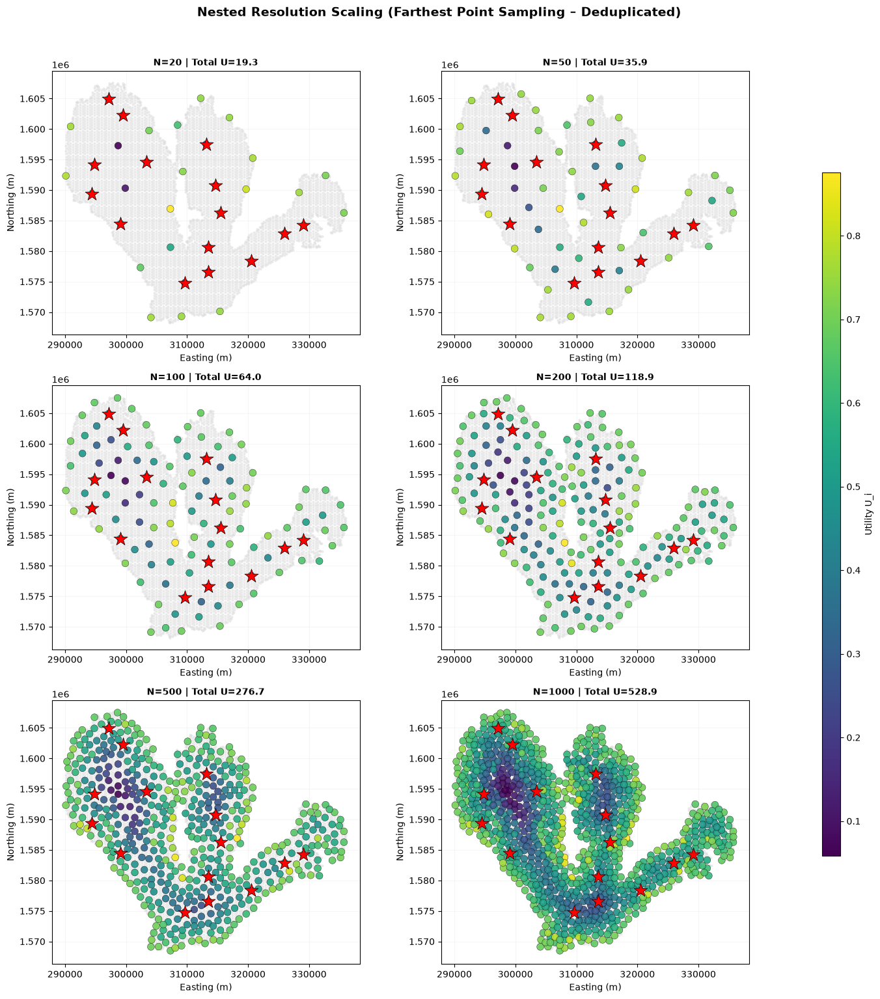

✅ Scaling results loaded and ready. Skipping recomputation.

✅ Nested resolution scaling complete.


In [5]:
#@title CELL 3: NESTED RESOLUTION SCALING (Resumable)
"""
================================================================================
NESTED RESOLUTION SCALING VIA FARTHEST POINT SAMPLING (FPS) – RESUMABLE
================================================================================
- Uses FORCE_RECOMPUTE_SCALING flag from Cell 1.
- Dual storage: local and Drive.
- If scaling_results.pkl exists, loads and skips FPS.
- Generates nested grid plots from loaded data.
================================================================================
"""

import os
import pickle
import time
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from pathlib import Path
import shapely
from shapely.geometry import Point
from tqdm.notebook import tqdm
import shutil

# -----------------------------------------------------------------------------
# CONFIGURATION
# -----------------------------------------------------------------------------
CONFIG = {
    "target_sizes": [20, 50, 100, 200, 500, 1000],
    "pool_size_estimate": 10000,
    "N_existing": None,  # None = use real existing stations
}

# === PATH FALLBACK (hybrid: Colab + local) ===
try:
    CACHE_DIR
except NameError:
    import importlib.util
    try:
        IN_COLAB = importlib.util.find_spec("google.colab") is not None
    except Exception:
        IN_COLAB = False
    if IN_COLAB:
        from google.colab import drive
        if not Path("/content/drive/MyDrive").exists():
            drive.mount("/content/drive")
        CACHE_DIR = Path("/content/wqm_data")
        RESULTS_DIR = Path("/content/drive/MyDrive/wqm_data")
        DATA_DIR = RESULTS_DIR
    else:
        REPO_PATH = Path.cwd().resolve()
        for _ in range(6):
            if (REPO_PATH / "notebooks").exists() or (REPO_PATH / "src").exists() or (REPO_PATH / ".git").exists():
                break
            REPO_PATH = REPO_PATH.parent
        DATA_DIR = REPO_PATH / "data"
        CACHE_DIR = DATA_DIR / "cache"
        RESULTS_DIR = REPO_PATH / "results"
    # Legacy aliases (used by existing cell code)
    LOCAL_CACHE = CACHE_DIR
    GDRIVE_BASE = RESULTS_DIR
    OUTPUT_DIR = RESULTS_DIR
    DRIVE_CACHE = RESULTS_DIR
    GEOJSON_PATH = DATA_DIR / "LDB_centroids_clean.geojson"
    CACHE_DIR.mkdir(parents=True, exist_ok=True)
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------------------------------------------------------
# RESUME LOGIC
# -----------------------------------------------------------------------------
scaling_path_local = LOCAL_CACHE / "scaling_results.pkl"
scaling_path_drive = OUTPUT_DIR / "scaling_results.pkl"
scaling_results = None

if not FORCE_RECOMPUTE_SCALING:
    if scaling_path_local.exists():
        print("📂 Loading scaling results from local cache...")
        with open(scaling_path_local, "rb") as f:
            scaling_results = pickle.load(f)
    elif scaling_path_drive.exists():
        print("📂 Loading scaling results from Drive (copying to local)...")
        shutil.copy(scaling_path_drive, scaling_path_local)
        with open(scaling_path_local, "rb") as f:
            scaling_results = pickle.load(f)

if scaling_results is not None:
    print(f"✅ Loaded scaling results for tiers: {sorted(scaling_results.keys())}")
    # Unpack the first tier to get metadata (coords, U, etc.)
    first_N = next(iter(scaling_results))
    first_res = scaling_results[first_N]
    n_free = len(first_res["free_master_indices"])
    n_fixed = len(first_res["M_orig_indices"])
    print(f"   Free sites in smallest tier: {n_free}, Fixed: {n_fixed}")
    print("   Tiers summary:")
    for N, res in sorted(scaling_results.items()):
        print(f"      N={N}: free={len(res['free_master_indices'])}, fixed={len(res['M_orig_indices'])}, total={len(res['coords'])}")

    # Load master data if needed (should already be defined from Cell 2)
    # We need coords and U from master to plot the background.
    # They are already in namespace from Cell 2.

    # Recreate plots from loaded data
    print("\n📊 Plotting nested candidate grids from loaded data...")
    tiers = sorted(scaling_results.keys())
    n_tiers = len(tiers)
    cols = 2
    rows = int(np.ceil(n_tiers / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(14, 5 * rows))
    axes = np.atleast_1d(axes).flatten()

    for ax, N in zip(axes, tiers):
        res = scaling_results[N]
        coords_tier = res["coords"]
        U_tier = res["U"]
        M_tier = res["M_indices"]

        ax.scatter(coords[:, 0], coords[:, 1], c="lightgray", s=4, alpha=0.35, zorder=0)
        sc = ax.scatter(coords_tier[:, 0], coords_tier[:, 1],
                        c=U_tier, cmap="viridis", s=60,
                        edgecolor="k", linewidth=0.3, alpha=0.9, zorder=2)
        if len(M_tier) > 0:
            ax.scatter(coords_tier[M_tier, 0], coords_tier[M_tier, 1],
                       c="red", marker="*", s=250, edgecolor="black",
                       linewidth=0.5, zorder=5, label="Existing")
        ax.set_title(f"N={N} | Total U={U_tier.sum():.1f}", fontsize=10, fontweight="bold")
        ax.set_xlabel("Easting (m)")
        ax.set_ylabel("Northing (m)")
        ax.set_aspect("equal")
        ax.grid(alpha=0.1)

    for ax in axes[n_tiers:]:
        ax.axis("off")

    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    sm = plt.cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(vmin=min(r['U'].min() for r in scaling_results.values()),
                                                                  vmax=max(r['U'].max() for r in scaling_results.values())))
    sm.set_array([])
    fig.colorbar(sm, cax=cbar_ax, label="Utility U_i")

    plt.suptitle("Nested Resolution Scaling (Farthest Point Sampling – Deduplicated)", fontsize=14, fontweight="bold", y=1.02)
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.show()

    # We are done – skip recomputation
    print("✅ Scaling results loaded and ready. Skipping recomputation.")
    # Ensure scaling_results is defined
    pass

else:
    # -------------------------------------------------------------------------
    # COMPUTE FROM SCRATCH (original code)
    # -------------------------------------------------------------------------
    print("🔄 Scaling results not found or FORCE_RECOMPUTE_SCALING=True. Computing from scratch...")

    # ---- LOAD MASTER DATA (already in memory from Cell 2) ----
    # coords, U, water_polygon, M_indices, bbox, n_sites, M_set_global are already defined.

    print("📦 Master data loaded.")
    print(f"   Total master sites: {n_sites}")
    print(f"   Existing stations: {len(M_indices)}")
    print(f"   BBox: {bbox}")

    # ---- STEP 1: GENERATE DENSE HEX POOL ----
    def generate_hex_centroids_bbox(bbox, target_n):
        xmin, ymin, xmax, ymax = bbox
        width = xmax - xmin
        height = ymax - ymin
        area = width * height
        hex_area = area / target_n
        spacing = np.sqrt(hex_area / (np.sqrt(3) / 2.0))
        dx = spacing
        dy = spacing * (np.sqrt(3) / 2.0)

        cols = int(np.ceil(width / dx)) + 1
        rows = int(np.ceil(height / dy)) + 1

        centroids = []
        for r in range(rows):
            y = ymin + r * dy
            if y > ymax:
                continue
            shift = 0.5 * dx if (r % 2 == 1) else 0.0
            for c in range(cols):
                x = xmin + c * dx + shift
                if x > xmax:
                    continue
                centroids.append([x, y])
        return np.array(centroids)

    print("\n🔹 Generating dense hex pool...")
    pool_raw = generate_hex_centroids_bbox(bbox, CONFIG["pool_size_estimate"])
    print(f"   Raw pool size: {len(pool_raw):,}")

    shapely.prepare(water_polygon)
    pool_water = []
    for pt in tqdm(pool_raw, desc="Filtering water points"):
        if water_polygon.contains(Point(pt)):
            pool_water.append(pt)
    pool_coords = np.array(pool_water, dtype=float)
    print(f"   Pool points inside water: {len(pool_coords):,}")

    # ---- STEP 2: MAP POOL POINTS TO NEAREST MASTER CENTROID ----
    master_tree = cKDTree(coords)
    dist, pool_to_master = master_tree.query(pool_coords, k=1)
    pool_to_master = pool_to_master.flatten().astype(int)

    free_mask = ~np.isin(pool_to_master, list(M_set_global))
    pool_to_master_free = pool_to_master[free_mask]

    unique_master_indices, unique_inverse = np.unique(pool_to_master_free, return_inverse=True)
    unique_master_coords = coords[unique_master_indices]
    unique_U = U[unique_master_indices]

    print(f"   Pool points mapped to free master indices (raw): {len(pool_to_master_free):,}")
    print(f"   Unique free master indices after deduplication: {len(unique_master_indices):,}")

    # ---- STEP 3: FARTHEST POINT SAMPLING ----
    print("\n🔹 Running Farthest Point Sampling on deduplicated master sites (seeded with existing stations)...")
    seed_coords = coords[list(M_set_global)]
    n_select = 1000

    seed_tree = cKDTree(seed_coords)
    min_dist = seed_tree.query(unique_master_coords, k=1)[0].flatten()

    selected_indices = []
    selected_master_indices = []

    for _ in tqdm(range(n_select), desc="FPS iterations (unique sites)"):
        idx = np.argmax(min_dist)
        selected_indices.append(idx)
        selected_master_indices.append(unique_master_indices[idx])

        new_point = unique_master_coords[idx]
        dist_to_new = np.linalg.norm(unique_master_coords - new_point, axis=1)
        min_dist = np.minimum(min_dist, dist_to_new)
        min_dist[idx] = -1.0

    print(f"   Selected {len(selected_master_indices)} unique free points via FPS.")

    # ---- STEP 4: BUILD NESTED TIERS ----
    print("\n🔹 Building nested tiers for exact target sizes...")
    scaling_results = {}

    for N in CONFIG["target_sizes"]:
        free_master_indices = selected_master_indices[:N]
        free_coords = coords[free_master_indices]
        free_U = U[free_master_indices]

        all_master_indices = list(free_master_indices) + M_indices
        all_coords = np.vstack([free_coords, coords[M_indices]])
        all_U = np.concatenate([free_U, U[M_indices]])

        M_tier = list(range(N, N + len(M_indices)))
        snapped_indices = np.array(all_master_indices, dtype=int)

        scaling_results[N] = {
            "coords": all_coords,
            "U": all_U,
            "M_indices": M_tier,
            "M_orig_indices": M_indices,
            "snapped_indices": snapped_indices,
            "free_master_indices": free_master_indices,
        }

        print(f"   N={N:4d}: free={N}, fixed={len(M_indices)}, total={len(all_coords)}")

    # ---- STEP 5: PLOT ----
    print("\n📊 Plotting nested candidate grids...")
    tiers = sorted(scaling_results.keys())
    n_tiers = len(tiers)
    cols = 2
    rows = int(np.ceil(n_tiers / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(14, 5 * rows))
    axes = np.atleast_1d(axes).flatten()

    for ax, N in zip(axes, tiers):
        res = scaling_results[N]
        coords_tier = res["coords"]
        U_tier = res["U"]
        M_tier = res["M_indices"]

        ax.scatter(coords[:, 0], coords[:, 1], c="lightgray", s=4, alpha=0.35, zorder=0)
        sc = ax.scatter(coords_tier[:, 0], coords_tier[:, 1],
                        c=U_tier, cmap="viridis", s=60,
                        edgecolor="k", linewidth=0.3, alpha=0.9, zorder=2)
        if len(M_tier) > 0:
            ax.scatter(coords_tier[M_tier, 0], coords_tier[M_tier, 1],
                       c="red", marker="*", s=250, edgecolor="black",
                       linewidth=0.5, zorder=5, label="Existing")
        ax.set_title(f"N={N} | Total U={U_tier.sum():.1f}", fontsize=10, fontweight="bold")
        ax.set_xlabel("Easting (m)")
        ax.set_ylabel("Northing (m)")
        ax.set_aspect("equal")
        ax.grid(alpha=0.1)

    for ax in axes[n_tiers:]:
        ax.axis("off")

    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    sm = plt.cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(vmin=min(r['U'].min() for r in scaling_results.values()),
                                                                  vmax=max(r['U'].max() for r in scaling_results.values())))
    sm.set_array([])
    fig.colorbar(sm, cax=cbar_ax, label="Utility U_i")

    plt.suptitle("Nested Resolution Scaling (Farthest Point Sampling – Deduplicated)", fontsize=14, fontweight="bold", y=1.02)
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    plt.show()

    # ---- STEP 6: SAVE ----
    with open(scaling_path_local, "wb") as f:
        pickle.dump(scaling_results, f, protocol=pickle.HIGHEST_PROTOCOL)
    with open(scaling_path_drive, "wb") as f:
        pickle.dump(scaling_results, f, protocol=pickle.HIGHEST_PROTOCOL)
    print(f"✅ Cached deduplicated scaling results to {scaling_path_local} and {scaling_path_drive}")

print("\n✅ Nested resolution scaling complete.")

📂 CACHE_DIR: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache, RESULTS_DIR: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results, GEOJSON_PATH: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/LDB_centroids_clean.geojson

🔗 GENERATING SPARSE QUBO + MIQP DATA PER RESOLUTION TIER (Resumable, Config‑Aware)


Tiers:   0%|          | 0/6 [00:00<?, ?it/s]

✅ Loaded instance data for N=20 (config hash: 241358d8)
✅ Loaded instance data for N=50 (config hash: 241358d8)
✅ Loaded instance data for N=100 (config hash: 241358d8)
✅ Loaded instance data for N=200 (config hash: 241358d8)
✅ Loaded instance data for N=500 (config hash: 241358d8)
✅ Loaded instance data for N=1000 (config hash: 241358d8)
🚀 All QUBO + MIQP data saved successfully.

📊 Plotting landmass-aware graph edges per tier (L_c edges only)...


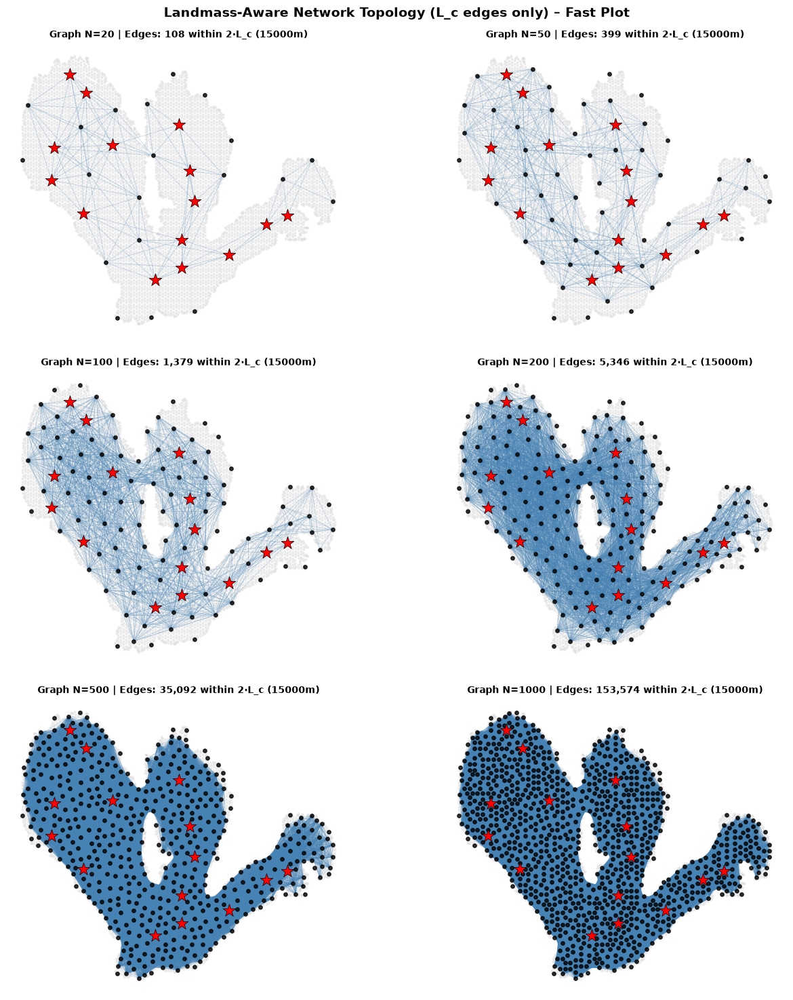

✅ Cell 4 complete.


In [6]:
#@title CELL 4: GENERATE SPARSE QUBO + MIQP DATA (Resumable, Config‑Aware, Fast Plotting)
"""
================================================================================
REVISION: Resumable – loads per‑tier instance_data_N{N}_{config_hash}.pkl if available.
- Uses FORCE_RECOMPUTE_QUBO flag from Cell 1.
- Dual storage: local and Drive.
- Config hash in filename invalidates on QUBO parameter changes.
- Backward‑compatible: falls back to unhashed filenames if hashed missing.
- Stores both valid_edges (D_max) and valid_edges_lc (2*L_c) for plotting.
- Connectivity plots use LineCollection for speed and plot only L_c edges.
================================================================================
"""
import os
import pickle
import time
import numpy as np
from pathlib import Path
from scipy.spatial import cKDTree
import shapely
from shapely.geometry import LineString, Point
import matplotlib.pyplot as plt
import matplotlib.collections as mcoll
import jijmodeling as jm
from tqdm.notebook import tqdm
import shutil
import warnings
import hashlib
import json

warnings.filterwarnings('ignore')

# -----------------------------------------------------------------------------
# LOAD CONFIG AND HASH (from Cell 2)
# -----------------------------------------------------------------------------
try:
    # These are already defined in Cell 2
    MASTER_QUBO_CONFIG
    config_hash
except NameError:
    print("⚠️ MASTER_QUBO_CONFIG or config_hash not found; using defaults.")
    MASTER_QUBO_CONFIG = {
        "L_c": 7500.0,
        "L_w": 1000.0,
        "Beta": 1.0,
        "Delta": 1.0,
        "Current_vector": (1.0, 0.0),
        "K": 5,
        "D_max_buffer": 1.15,
    }
    config_str = json.dumps(MASTER_QUBO_CONFIG, sort_keys=True)
    config_hash = hashlib.md5(config_str.encode()).hexdigest()[:8]
    print(f"🔑 Generated config hash: {config_hash}")

# === PATH FALLBACK (hybrid: Colab + local) ===
try:
    CACHE_DIR
except NameError:
    import importlib.util
    try:
        IN_COLAB = importlib.util.find_spec("google.colab") is not None
    except Exception:
        IN_COLAB = False
    if IN_COLAB:
        from google.colab import drive
        if not Path("/content/drive/MyDrive").exists():
            drive.mount("/content/drive")
        CACHE_DIR = Path("/content/wqm_data")
        RESULTS_DIR = Path("/content/drive/MyDrive/wqm_data")
        DATA_DIR = RESULTS_DIR
    else:
        REPO_PATH = Path.cwd().resolve()
        for _ in range(6):
            if (REPO_PATH / "notebooks").exists() or (REPO_PATH / "src").exists() or (REPO_PATH / ".git").exists():
                break
            REPO_PATH = REPO_PATH.parent
        DATA_DIR = REPO_PATH / "data"
        CACHE_DIR = DATA_DIR / "cache"
        RESULTS_DIR = REPO_PATH / "results"
    # Legacy aliases (used by existing cell code)
    LOCAL_CACHE = CACHE_DIR
    GDRIVE_BASE = RESULTS_DIR
    OUTPUT_DIR = RESULTS_DIR
    DRIVE_CACHE = RESULTS_DIR
    GEOJSON_PATH = DATA_DIR / "LDB_centroids_clean.geojson"
    CACHE_DIR.mkdir(parents=True, exist_ok=True)
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)

print(f"📂 CACHE_DIR: {CACHE_DIR}, RESULTS_DIR: {RESULTS_DIR}, GEOJSON_PATH: {GEOJSON_PATH}")

# -----------------------------------------------------------------------------
# LOAD MASTER DATA (hashed version from Cell 2)
# -----------------------------------------------------------------------------
# First try from namespace (if Cell 2 already ran)
try:
    coords_master = coords
    U_master = U
    M_indices_master = M_indices
    water_polygon = water_polygon
    global_D_max = metadata["master_D_max"]
except NameError:
    print("⚠️ Master data not in namespace; loading hashed file...")
    master_path_local = LOCAL_CACHE / f"master_real_{config_hash}.pkl"
    if not master_path_local.exists():
        master_path_local = OUTPUT_DIR / f"master_real_{config_hash}.pkl"
    if not master_path_local.exists():
        # Fallback to unhashed (backward compatibility)
        master_path_local = LOCAL_CACHE / "master_real.pkl"
        if not master_path_local.exists():
            master_path_local = OUTPUT_DIR / "master_real.pkl"
    with open(master_path_local, "rb") as f:
        master_data = pickle.load(f)
    coords_master = master_data["coords"]
    U_master = master_data["U"]
    M_indices_master = master_data["M_indices"]
    water_polygon = master_data["water_polygon"]
    a_master = master_data["a"]
    Q_master_edges = master_data["Q_edges"]
    metadata = master_data["metadata"]
    global_D_max = metadata["master_D_max"]
    coords = coords_master
    U = U_master
    M_indices = M_indices_master

M_set_global = set(M_indices_master)

# -----------------------------------------------------------------------------
# LOAD SCALING RESULTS (unhashed, from Cell 3)
# -----------------------------------------------------------------------------
try:
    if 'scaling_results' not in dir():
        raise NameError
except NameError:
    print("⚠️ Scaling results not in namespace; loading from file...")
    scaling_path_local = LOCAL_CACHE / "scaling_results.pkl"
    if not scaling_path_local.exists():
        scaling_path_local = OUTPUT_DIR / "scaling_results.pkl"
    with open(scaling_path_local, "rb") as f:
        scaling_results = pickle.load(f)

# -----------------------------------------------------------------------------
# PAIRWISE TERM CALCULATION (extended: returns both D_max and L_c edge sets)
# -----------------------------------------------------------------------------
def compute_pairwise_terms_shape_aware(
    coords: np.ndarray,
    U: np.ndarray,
    M_indices: list,
    water_polygon: shapely.geometry.Polygon,
    L_c: float,
    L_w: float,
    current_vector: tuple,
    global_D_max: float,
    beta: float = 1.0,
    delta: float = 1.0,
) -> dict:
    """
    Returns:
      - linear: dict {orig_idx: coeff}
      - quad_edges: list of (orig_i, orig_j, coeff) with orig_i < orig_j
      - neighbors: dict {orig_idx: list_of_neighbor_orig_indices} (free+fixed)
      - valid_edges: set of (orig_i, orig_j) for connectivity constraint (D_max)
      - valid_edges_lc: set of (orig_i, orig_j) within 2*L_c for plotting
    """
    N_total = coords.shape[0]
    free_indices = [i for i in range(N_total) if i not in M_indices]
    free_set = set(free_indices)
    M_set = set(M_indices)

    tree = cKDTree(coords)
    v_norm = np.linalg.norm(current_vector)
    v_unit = np.array(current_vector) / v_norm

    # ---- Build connectivity graph (within D_max) ----
    valid_edges = set()
    pairs_dmax = tree.query_pairs(r=global_D_max)
    for i, j in pairs_dmax:
        p1, p2 = coords[i], coords[j]
        if not (water_polygon.contains(Point(p1)) and water_polygon.contains(Point(p2))):
            continue
        if water_polygon.contains(LineString([p1, p2])):
            valid_edges.add((i, j))

    # ---- Build L_c edge set (within 2*L_c) for plotting ----
    lc_radius = 2.0 * L_c
    valid_edges_lc = set()
    pairs_lc = tree.query_pairs(r=lc_radius)
    for i, j in pairs_lc:
        p1, p2 = coords[i], coords[j]
        if not (water_polygon.contains(Point(p1)) and water_polygon.contains(Point(p2))):
            continue
        if water_polygon.contains(LineString([p1, p2])):
            valid_edges_lc.add((i, j))

    # Build neighbors dict for free vertices only (including fixed neighbors)
    neighbors = {i: [] for i in free_indices}
    for i, j in valid_edges:
        if i in free_set and j in free_set:
            neighbors[i].append(j)
            neighbors[j].append(i)
        elif i in free_set and j in M_set:
            neighbors[i].append(j)
        elif j in free_set and i in M_set:
            neighbors[j].append(i)
    for i in neighbors:
        neighbors[i] = sorted(set(neighbors[i]))

    # ---- Compute quadratic interactions (within 2*L_c) ----
    raw_quad = {}
    for i, j in pairs_lc:
        p1, p2 = coords[i], coords[j]
        if not (water_polygon.contains(Point(p1)) and water_polygon.contains(Point(p2))):
            continue
        line = LineString([p1, p2])
        if not water_polygon.contains(line):
            continue

        dx = p2[0] - p1[0]
        dy = p2[1] - p1[1]
        d = np.sqrt(dx*dx + dy*dy)
        if d == 0:
            continue

        R_ij = max(0.0, 1.0 - d / L_c)
        cos_theta = (dx * v_unit[0] + dy * v_unit[1]) / d
        cos_theta = np.clip(cos_theta, -1.0, 1.0)
        W_ij = (np.exp(-d / L_w) * cos_theta) if cos_theta > 0.7071 else 0.0

        cos_theta_ji = (-dx * v_unit[0] + -dy * v_unit[1]) / d
        cos_theta_ji = np.clip(cos_theta_ji, -1.0, 1.0)
        W_ji = (np.exp(-d / L_w) * cos_theta_ji) if cos_theta_ji > 0.7071 else 0.0

        coeff = beta * R_ij + delta * (W_ij + W_ji)
        if abs(coeff) > 1e-12:
            raw_quad[(i, j)] = coeff
            raw_quad[(j, i)] = coeff

    # ---- Build linear terms (absorb fixed stations) ----
    linear = {}
    for i in free_indices:
        val = -U[i]
        for m in M_indices:
            key = (i, m) if i < m else (m, i)
            if key in raw_quad:
                val += raw_quad[key]
        linear[i] = val

    # ---- Build free‑free quadratic edges (i < j) ----
    quad_edges = []
    for i in free_indices:
        for j in free_indices:
            if i < j:
                key = (i, j)
                if key in raw_quad:
                    val = raw_quad[key]
                    if abs(val) > 1e-12:
                        quad_edges.append((i, j, val))

    return {
        "linear": linear,
        "quad_edges": quad_edges,
        "neighbors": neighbors,
        "valid_edges": valid_edges,
        "valid_edges_lc": valid_edges_lc,
    }

# -----------------------------------------------------------------------------
# MIQP MODEL BUILDER (unchanged)
# -----------------------------------------------------------------------------
def build_miqp_problem_sparse(N: int, max_degree: int, num_edges: int) -> jm.Problem:
    problem = jm.Problem("WQM_MIQP_sparse", sense=jm.ProblemSense.MINIMIZE)
    a = problem.Placeholder("a", shape=(N,), dtype=jm.DataType.FLOAT)
    neighbor_indices = problem.Placeholder("neighbor_indices", shape=(N, max_degree), dtype=jm.DataType.NATURAL)
    neighbor_mask = problem.Placeholder("neighbor_mask", shape=(N, max_degree), dtype=jm.DataType.BINARY)
    fixed_neighbors = problem.Placeholder("fixed_neighbors", shape=(N,), dtype=jm.DataType.FLOAT)
    K_total = problem.Placeholder("K_total", ndim=0, dtype=jm.DataType.INTEGER)
    x = problem.BinaryVar("x", shape=(N,))
    linear = jm.sum(jm.product(N), lambda i: a[i[0]] * x[i[0]])
    problem += linear
    if num_edges > 0:
        edges = problem.Placeholder("edges", shape=(num_edges, 2), dtype=jm.DataType.NATURAL)
        Q_vals = problem.Placeholder("Q_vals", shape=(num_edges,), dtype=jm.DataType.FLOAT)
        quad = jm.sum(jm.product(num_edges), lambda e: Q_vals[e[0]] * x[edges[e[0], 0]] * x[edges[e[0], 1]])
        problem += quad
    problem += problem.Constraint("budget", jm.sum(jm.product(N), lambda i: x[i[0]]) == K_total)
    problem += problem.Constraint(
        "connectivity",
        lambda i: x[i] <= fixed_neighbors[i] + jm.sum(
            jm.product(max_degree),
            lambda k: neighbor_mask[i, k[0]] * x[neighbor_indices[i, k[0]]]
        ),
        domain=N
    )
    return problem

# -----------------------------------------------------------------------------
# MAIN LOOP OVER TIERS (Resumable, Config‑Aware)
# -----------------------------------------------------------------------------
print("\n" + "=" * 100)
print("🔗 GENERATING SPARSE QUBO + MIQP DATA PER RESOLUTION TIER (Resumable, Config‑Aware)")
print("=" * 100)

qubo_results = {}  # for plotting
tiers = sorted(scaling_results.keys())

for N in tqdm(tiers, desc="Tiers"):
    # Hashed filename
    instance_name_hashed = f"instance_data_N{N}_{config_hash}.pkl"
    instance_local = LOCAL_CACHE / instance_name_hashed
    instance_drive = OUTPUT_DIR / instance_name_hashed

    # Also check unhashed (backward compatibility)
    instance_name_unhashed = f"instance_data_N{N}.pkl"
    unhashed_local = LOCAL_CACHE / instance_name_unhashed
    unhashed_drive = OUTPUT_DIR / instance_name_unhashed

    loaded = False
    instance_data = None

    # 1. Check if hashed version exists locally or on Drive
    if not FORCE_RECOMPUTE_QUBO:
        if instance_local.exists():
            with open(instance_local, "rb") as f:
                instance_data = pickle.load(f)
            loaded = True
        elif instance_drive.exists():
            print(f"📂 Loading hashed {instance_name_hashed} from Drive (copying to local)...")
            shutil.copy(instance_drive, instance_local)
            with open(instance_local, "rb") as f:
                instance_data = pickle.load(f)
            loaded = True
        # 2. If not found, try unhashed (migration)
        elif unhashed_local.exists():
            print(f"📂 Loading unhashed {instance_name_unhashed} from local (migrating to hashed)...")
            with open(unhashed_local, "rb") as f:
                instance_data = pickle.load(f)
            loaded = True
            # Save as hashed for future
            with open(instance_local, "wb") as f:
                pickle.dump(instance_data, f)
            with open(instance_drive, "wb") as f:
                pickle.dump(instance_data, f)
            print(f"✅ Migrated instance data to {instance_local}")
        elif unhashed_drive.exists():
            print(f"📂 Loading unhashed {instance_name_unhashed} from Drive (migrating to hashed)...")
            shutil.copy(unhashed_drive, unhashed_local)
            with open(unhashed_local, "rb") as f:
                instance_data = pickle.load(f)
            loaded = True
            # Save as hashed
            with open(instance_local, "wb") as f:
                pickle.dump(instance_data, f)
            with open(instance_drive, "wb") as f:
                pickle.dump(instance_data, f)
            print(f"✅ Migrated instance data to {instance_local}")

    if loaded:
        print(f"✅ Loaded instance data for N={N} (config hash: {config_hash})")
        # Extract data for plotting
        if "original_coords" in instance_data:
            coords_plot = instance_data["original_coords"]
        else:
            free_coords = instance_data["coords"]
            fixed_indices = instance_data["fixed_indices"]
            # attempt to reconstruct if possible
            if "original_coords" not in instance_data and "fixed_indices" in instance_data:
                # We can't reconstruct easily; use free coords only
                print(f"⚠️ Cannot reconstruct full coords for N={N}; using free coords only.")
                coords_plot = free_coords
            else:
                coords_plot = instance_data["coords"]
        M_tier = instance_data["fixed_indices"]
        edges_plot = instance_data.get("valid_edges_lc", instance_data.get("valid_edges", set()))
        qubo_results[N] = {
            "edges": edges_plot,
            "coords": coords_plot,
            "M_indices": M_tier,
        }
        continue

    # 3. Compute from scratch
    print(f"🔄 Computing instance for N={N}...")
    t0 = time.perf_counter()

    res = scaling_results[N]
    coords_tier = res["coords"]
    U_tier = res["U"]
    M_tier = res["M_indices"]
    snapped_indices = res["snapped_indices"]

    pair_data = compute_pairwise_terms_shape_aware(
        coords=coords_tier,
        U=U_tier,
        M_indices=M_tier,
        water_polygon=water_polygon,
        L_c=MASTER_QUBO_CONFIG["L_c"],
        L_w=MASTER_QUBO_CONFIG["L_w"],
        current_vector=MASTER_QUBO_CONFIG["Current_vector"],
        global_D_max=global_D_max,
        beta=MASTER_QUBO_CONFIG["Beta"],
        delta=MASTER_QUBO_CONFIG["Delta"],
    )

    linear = pair_data["linear"]
    quad_edges_raw = pair_data["quad_edges"]
    neighbors_dict = pair_data["neighbors"]
    valid_edges = pair_data["valid_edges"]
    valid_edges_lc = pair_data["valid_edges_lc"]

    # Compress to free variables only
    free_indices_orig = list(neighbors_dict.keys())
    free_set = set(free_indices_orig)
    N_free = len(free_indices_orig)
    orig_to_comp = {orig: idx for idx, orig in enumerate(free_indices_orig)}

    a_new = np.array([linear.get(orig, 0.0) for orig in free_indices_orig], dtype=float)

    Q_edges_new = []
    for i, j, val in quad_edges_raw:
        if i in free_set and j in free_set:
            Q_edges_new.append((orig_to_comp[i], orig_to_comp[j], val))

    neighbors_new = [[] for _ in range(N_free)]
    for orig_i, nbrs in neighbors_dict.items():
        ci = orig_to_comp[orig_i]
        for orig_j in nbrs:
            if orig_j in free_set:
                neighbors_new[ci].append(orig_to_comp[orig_j])
    for i in range(N_free):
        neighbors_new[i] = sorted(set(neighbors_new[i]))

    fixed_neighbors_arr = np.zeros(N_free, dtype=int)
    M_set_tier = set(M_tier)
    for ci, orig_i in enumerate(free_indices_orig):
        if any(nbr in M_set_tier for nbr in neighbors_dict[orig_i]):
            fixed_neighbors_arr[ci] = 1

    qsum = np.sum(np.abs(a_new)) + sum(abs(val) for _, _, val in Q_edges_new)

    K = MASTER_QUBO_CONFIG["K"]
    max_degree = max(1, max((len(nbrs) for nbrs in neighbors_new), default=1))
    num_edges = len(Q_edges_new)

    neighbor_indices = np.zeros((N_free, max_degree), dtype=np.int32)
    neighbor_mask = np.zeros((N_free, max_degree), dtype=np.int8)
    for i in range(N_free):
        for k, j in enumerate(neighbors_new[i][:max_degree]):
            neighbor_indices[i, k] = j
            neighbor_mask[i, k] = 1

    a_effective = a_new.copy()

    data_dict = {
        "K_total": int(K),
        "a": a_effective.tolist(),
        "neighbor_indices": neighbor_indices.tolist(),
        "neighbor_mask": neighbor_mask.astype(int).tolist(),
        "fixed_neighbors": fixed_neighbors_arr.tolist(),
    }
    if num_edges > 0:
        edges_list = [[i, j] for i, j, _ in Q_edges_new]
        qvals_list = [float(v) for _, _, v in Q_edges_new]
        data_dict["edges"] = edges_list
        data_dict["Q_vals"] = qvals_list

    instance_data = {
        "N": N_free,
        "K": K,
        "a": a_new,
        "Q_edges": Q_edges_new,
        "neighbors": neighbors_new,
        "fixed_neighbors": fixed_neighbors_arr,
        "coords": coords_tier[free_indices_orig],
        "U": U_tier[free_indices_orig],
        "original_coords": coords_tier,
        "original_U": U_tier,
        "original_indices": free_indices_orig,
        "fixed_indices": M_tier,
        "snapped_indices": snapped_indices,
        "D_max": global_D_max,
        "L_c": MASTER_QUBO_CONFIG["L_c"],
        "L_w": MASTER_QUBO_CONFIG["L_w"],
        "qsum": qsum,
        "valid_edges": valid_edges,
        "valid_edges_lc": valid_edges_lc,
        "miqp_data": data_dict,
        "miqp_params": {
            "max_degree": max_degree,
            "num_edges": num_edges,
        }
    }

    # Save to local and Drive
    with open(instance_local, "wb") as f:
        pickle.dump(instance_data, f, protocol=pickle.HIGHEST_PROTOCOL)
    with open(instance_drive, "wb") as f:
        pickle.dump(instance_data, f, protocol=pickle.HIGHEST_PROTOCOL)

    qubo_results[N] = {
        "edges": valid_edges_lc,
        "coords": coords_tier,
        "M_indices": M_tier,
    }

    dt = (time.perf_counter() - t0) * 1000
    avg_deg = np.mean([len(nbrs) for nbrs in neighbors_new]) if N_free > 0 else 0
    print(f"✅ N={N:<3d} (Free: {N_free:<3d}) | Avg Deg: {avg_deg:<5.1f} | Q_edges: {len(Q_edges_new):<6d} | qsum: {qsum:.2f} | {dt:.1f} ms")

print("=" * 100)
print("🚀 All QUBO + MIQP data saved successfully.")

# -----------------------------------------------------------------------------
# PLOT CONNECTIVITY GRAPHS (using LineCollection, plotting L_c edges)
# -----------------------------------------------------------------------------
print("\n📊 Plotting landmass-aware graph edges per tier (L_c edges only)...")
tiers = sorted(qubo_results.keys())
n_tiers = len(tiers)
cols = 2
rows = int(np.ceil(n_tiers / cols))

fig, axes = plt.subplots(rows, cols, figsize=(14, 5 * rows))
axes = np.atleast_1d(axes).flatten()

for ax, N in zip(axes, tiers):
    tier_coords = qubo_results[N]["coords"]
    edges = qubo_results[N]["edges"]
    M_tier = qubo_results[N]["M_indices"]

    # Master map backdrop
    ax.scatter(coords_master[:, 0], coords_master[:, 1], c="lightgray", s=4, alpha=0.35, zorder=0)

    # Build line segments for LineCollection
    segments = []
    for i, j in edges:
        segments.append([(tier_coords[i, 0], tier_coords[i, 1]),
                         (tier_coords[j, 0], tier_coords[j, 1])])
    if segments:
        lc = mcoll.LineCollection(segments, colors="steelblue", alpha=0.3, linewidth=0.6, zorder=1)
        ax.add_collection(lc)

    # Nodes
    ax.scatter(tier_coords[:, 0], tier_coords[:, 1], c="black", s=15, alpha=0.8, zorder=2)
    if len(M_tier) > 0:
        ax.scatter(tier_coords[M_tier, 0], tier_coords[M_tier, 1],
                   c="red", marker="*", s=200, edgecolor="black", linewidth=0.5, zorder=3)

    ax.set_title(f"Graph N={N} | Edges: {len(edges):,} within 2·L_c ({2*MASTER_QUBO_CONFIG['L_c']:.0f}m)", fontsize=10, fontweight="bold")
    ax.set_aspect("equal")
    ax.axis("off")

for ax in axes[n_tiers:]:
    ax.axis("off")

plt.suptitle("Landmass-Aware Network Topology (L_c edges only) – Fast Plot", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

print("✅ Cell 4 complete.")

🔑 SCIP config hash: 241358d8
📂 CACHE_DIR: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache, RESULTS_DIR: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results, GEOJSON_PATH: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/LDB_centroids_clean.geojson


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


✅ Loaded hashed master from local.
✅ Loaded Master Data: N=5417, Q_edges=2045178
Found 6 instance data files:
  instance_data_N20_241358d8.pkl
  instance_data_N50_241358d8.pkl
  instance_data_N100_241358d8.pkl
  instance_data_N200_241358d8.pkl
  instance_data_N500_241358d8.pkl
  instance_data_N1000_241358d8.pkl

🔬 Solving tier N=20
📂 Loading existing SCIP result from local cache: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache/scip_result_N20_241358d8.pkl
  Status: solved
  Tier Energy: -3.301293
  Master Energy: -3.301319
  Feasible: True
  Runtime: 0.0243s


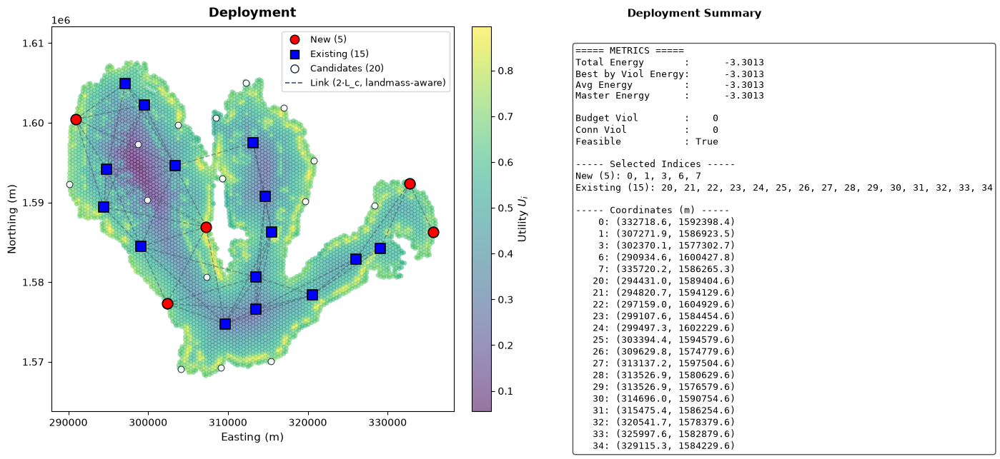

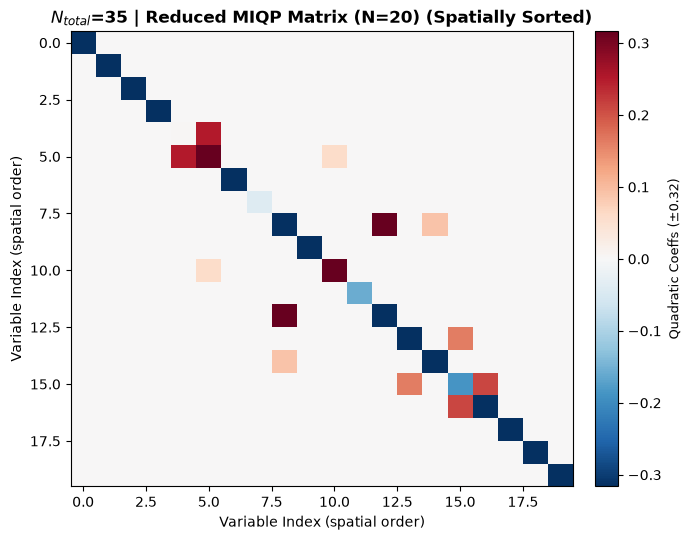

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.



🔬 Solving tier N=50
📂 Loading existing SCIP result from local cache: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache/scip_result_N50_241358d8.pkl
  Status: solved
  Tier Energy: -3.301293
  Master Energy: -3.301319
  Feasible: True
  Runtime: 0.0843s


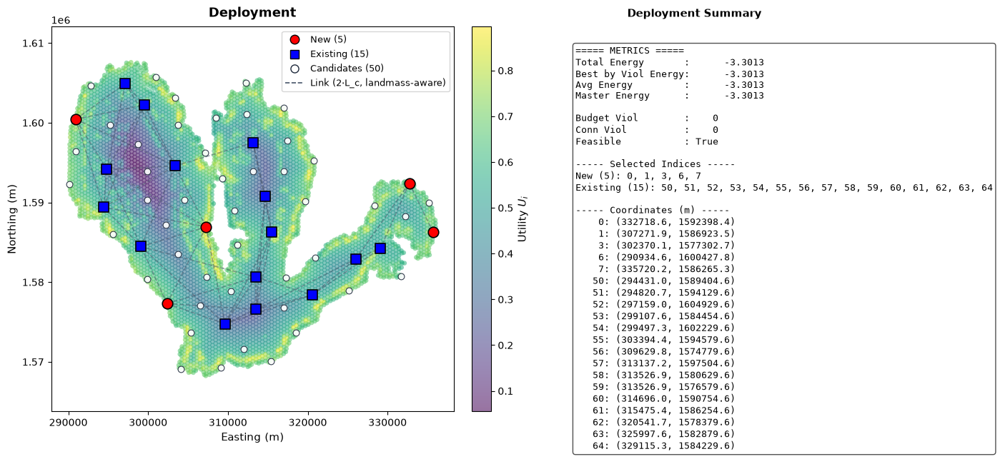

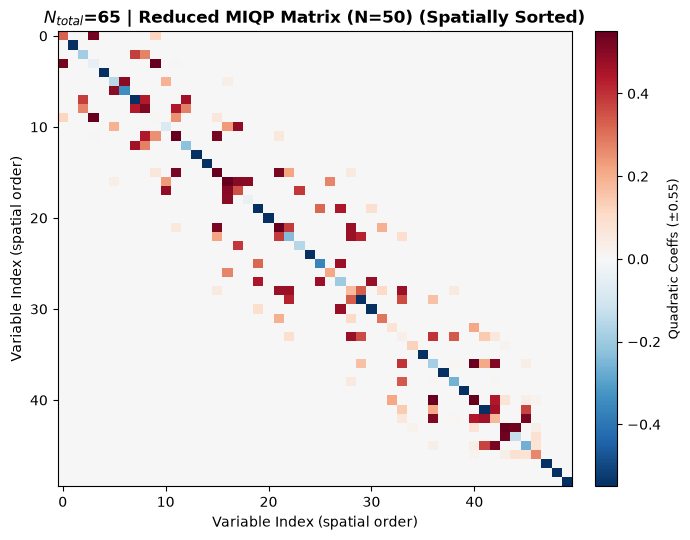

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.



🔬 Solving tier N=100
📂 Loading existing SCIP result from local cache: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache/scip_result_N100_241358d8.pkl
  Status: solved
  Tier Energy: -3.491055
  Master Energy: -3.491078
  Feasible: True
  Runtime: 0.1216s


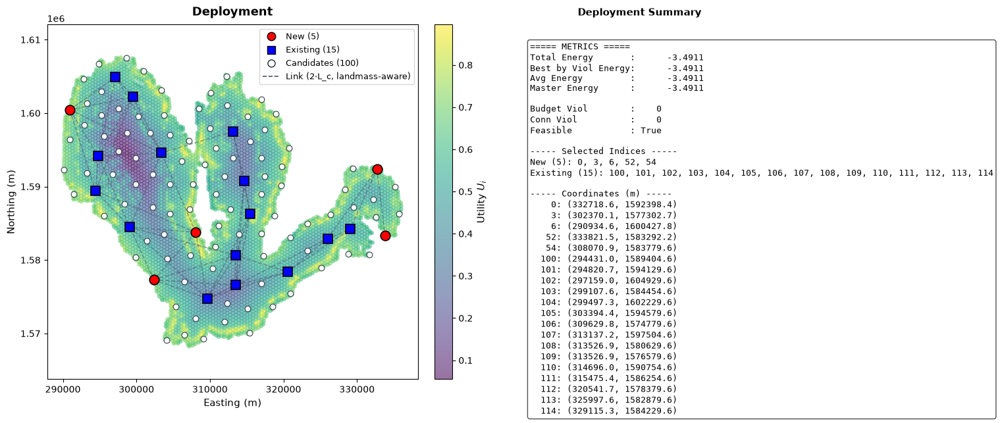

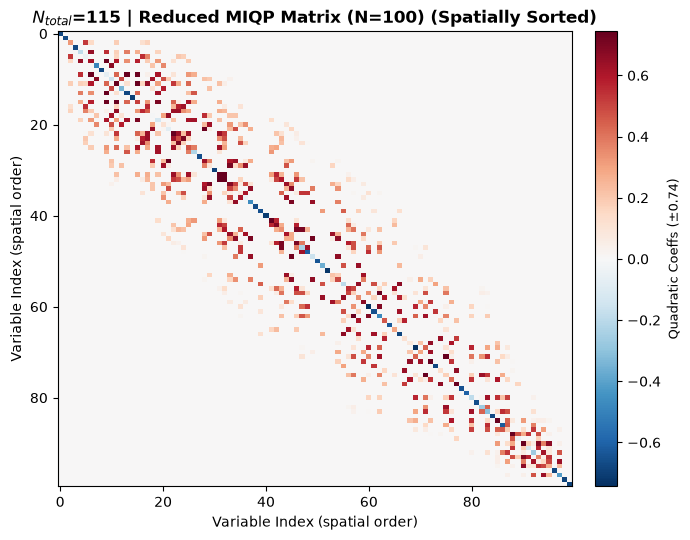

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.



🔬 Solving tier N=200
📂 Loading existing SCIP result from local cache: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache/scip_result_N200_241358d8.pkl
  Status: solved
  Tier Energy: -3.552748
  Master Energy: -3.552772
  Feasible: True
  Runtime: 0.5078s


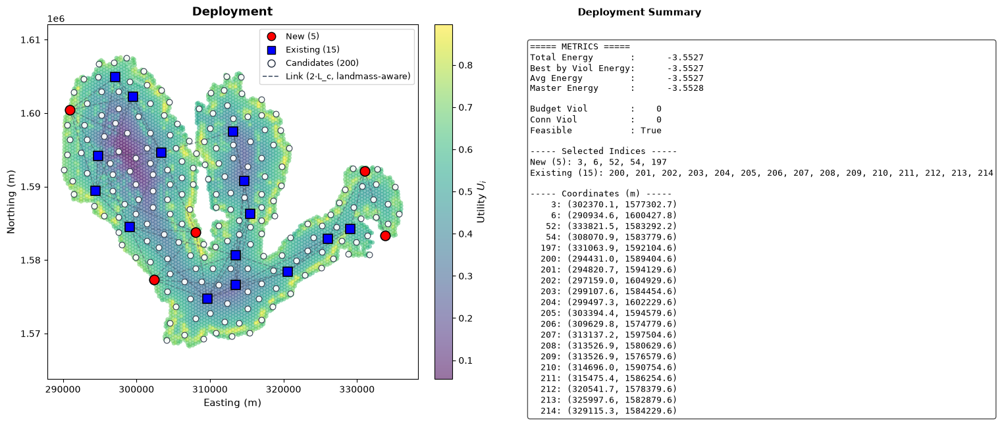

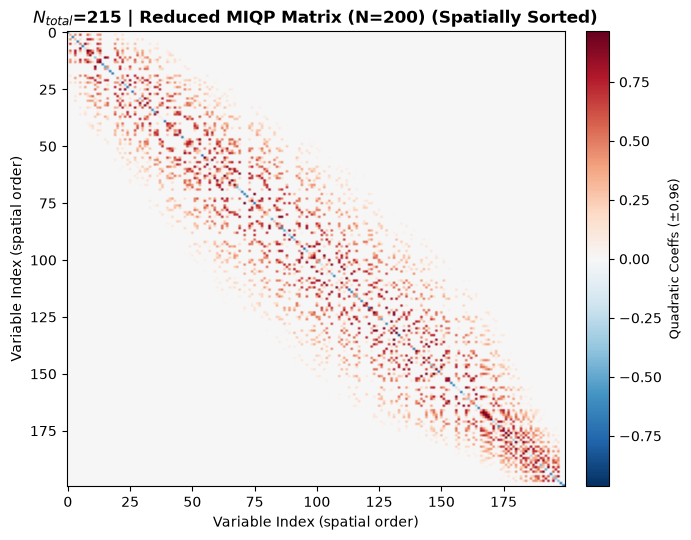

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.



🔬 Solving tier N=500
📂 Loading existing SCIP result from local cache: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache/scip_result_N500_241358d8.pkl
  Status: solved
  Tier Energy: -3.690686
  Master Energy: -3.690690
  Feasible: True
  Runtime: 1.5588s


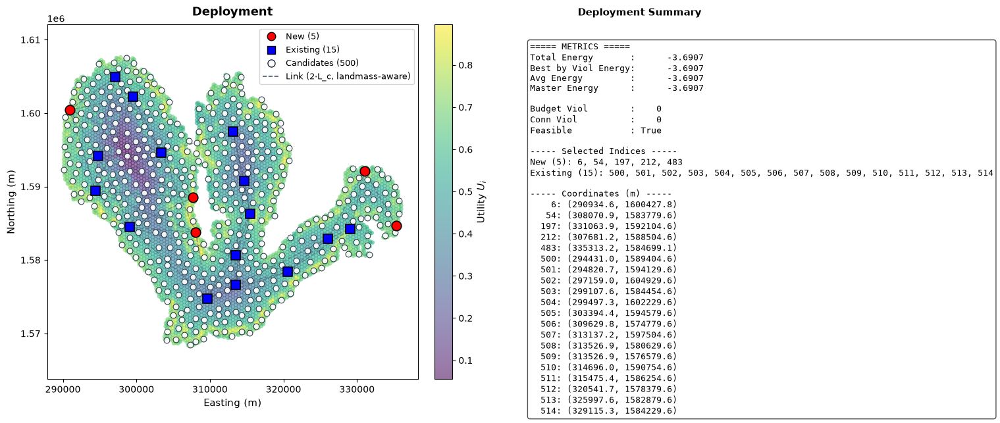

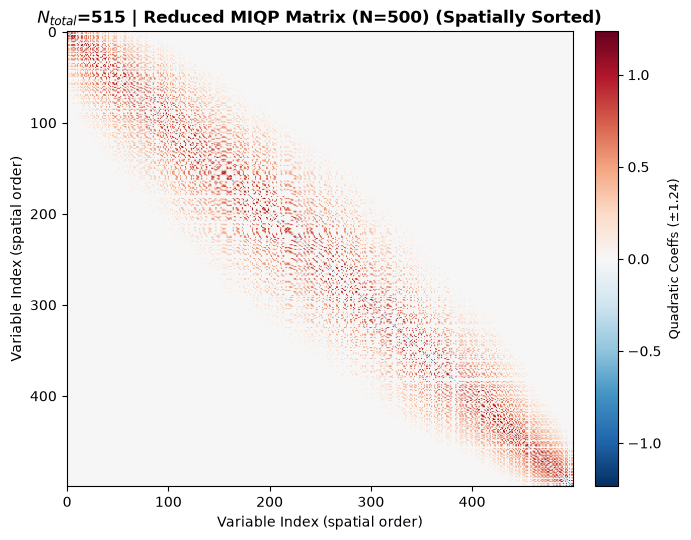

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.



🔬 Solving tier N=1000
📂 Loading existing SCIP result from local cache: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/data/cache/scip_result_N1000_241358d8.pkl
  Status: solved
  Tier Energy: -3.690686
  Master Energy: -3.690690
  Feasible: True
  Runtime: 16.5570s


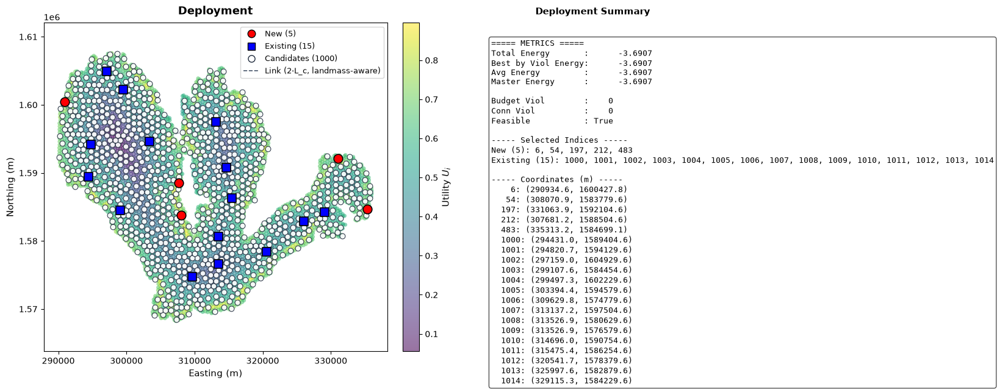

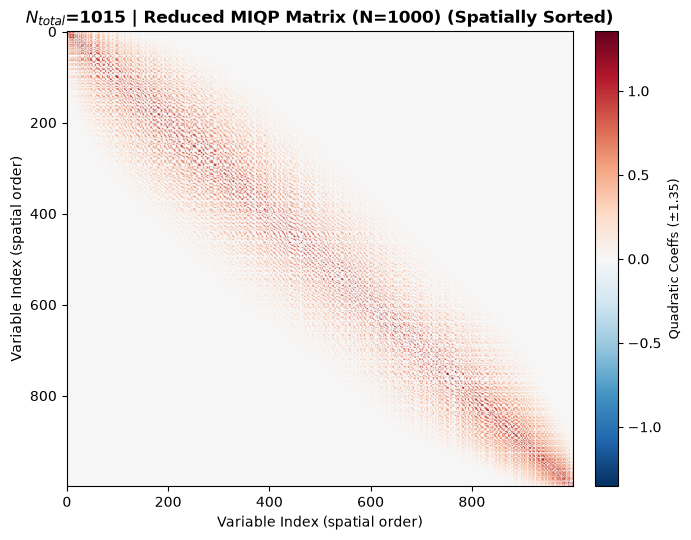


📊 SUMMARY OF ALL SOLVED TIERS (WITH MASTER GRID ENERGY)
N_true   | N_free   | K    | D_max (m)  | Tier Energy   | Master Energy  | Runtime(s)  | Feasible  | Status      
---------------------------------------------------------------------------------------------------------
20       | 20       | 5    | 9873.3     | -3.301293     | -3.301319      | 0.0243      | True      | solved      
50       | 50       | 5    | 9873.3     | -3.301293     | -3.301319      | 0.0843      | True      | solved      
100      | 100      | 5    | 9873.3     | -3.491055     | -3.491078      | 0.1216      | True      | solved      
200      | 200      | 5    | 9873.3     | -3.552748     | -3.552772      | 0.5078      | True      | solved      
500      | 500      | 5    | 9873.3     | -3.690686     | -3.690690      | 1.5588      | True      | solved      
1000     | 1000     | 5    | 9873.3     | -3.690686     | -3.690690      | 16.5570     | True      | solved      

✅ All SCIP solves complete.


In [7]:
#@title 🎯 CELL 5: MIQP SOLVE WITH SCIP (Resumable, Config‑Aware)
"""
================================================================================
MIQP SOLVE WITH SCIP – REAL DATA (MULTI-TIER) – RESUMABLE
================================================================================
- Uses FORCE_RECOMPUTE_SCIP flag from Cell 1.
- Result filenames include config_hash (based on MASTER_QUBO_CONFIG).
- Loads hashed instance files (fallback to unhashed, auto‑migrate).
- Loads hashed master file (fallback to unhashed).
- No greedy fallback – SCIP must find a solution.
- Always generates deployment and matrix plots.
- FIXED: plot_deployment now receives a proper metrics dictionary.
================================================================================
"""

# -----------------------------------------------------------------------------
# CONFIGURATION
# -----------------------------------------------------------------------------
import hashlib
import json

# MASTER_QUBO_CONFIG is already defined in Cell 2.
# If not, we compute it (fallback).
try:
    MASTER_QUBO_CONFIG
except NameError:
    print("⚠️ MASTER_QUBO_CONFIG not found; using defaults.")
    MASTER_QUBO_CONFIG = {
        "L_c": 7500.0,
        "L_w": 1000.0,
        "Beta": 1.0,
        "Delta": 1.0,
        "Current_vector": (1.0, 0.0),
        "K": 5,
        "D_max_buffer": 1.15,
    }
config_str = json.dumps(MASTER_QUBO_CONFIG, sort_keys=True)
config_hash = hashlib.md5(config_str.encode()).hexdigest()[:8]
print(f"🔑 SCIP config hash: {config_hash}")

# Force recompute flag (defined in Cell 1)
try:
    FORCE_RECOMPUTE_SCIP
except NameError:
    FORCE_RECOMPUTE_SCIP = False
    print("⚠️ FORCE_RECOMPUTE_SCIP not defined; defaulting to False.")

# -----------------------------------------------------------------------------
# IMPORTS
# -----------------------------------------------------------------------------
import os
import sys
import time
import pickle
import re
import warnings
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from scipy.interpolate import griddata
import jijmodeling as jm
import shutil

# OMMX SCIP adapter
try:
    from ommx_pyscipopt_adapter import OMMXPySCIPOptAdapter
    SCIP_AVAILABLE = True
except ImportError:
    SCIP_AVAILABLE = False
    print("⚠️ SCIP not available. Cell 5 will fail.")

warnings.filterwarnings('ignore')

# === PATH FALLBACK (hybrid: Colab + local) ===
try:
    CACHE_DIR
except NameError:
    import importlib.util
    try:
        IN_COLAB = importlib.util.find_spec("google.colab") is not None
    except Exception:
        IN_COLAB = False

    if IN_COLAB:
        from google.colab import drive
        if not Path("/content/drive/MyDrive").exists():
            drive.mount("/content/drive")
        CACHE_DIR = Path("/content/wqm_data")
        RESULTS_DIR = Path("/content/drive/MyDrive/wqm_data")
        DATA_DIR = RESULTS_DIR
    else:
        REPO_PATH = Path.cwd().resolve()
        for _ in range(6):
            if (REPO_PATH / "notebooks").exists() or (REPO_PATH / "src").exists() or (REPO_PATH / ".git").exists():
                break
            REPO_PATH = REPO_PATH.parent
        DATA_DIR = REPO_PATH / "data"
        CACHE_DIR = DATA_DIR / "cache"
        RESULTS_DIR = REPO_PATH / "results"

    # Legacy aliases (used by existing cell code)
    LOCAL_CACHE = CACHE_DIR
    GDRIVE_BASE = RESULTS_DIR
    OUTPUT_DIR = RESULTS_DIR
    DRIVE_CACHE = RESULTS_DIR
    GEOJSON_PATH = DATA_DIR / "LDB_centroids_clean.geojson"

    CACHE_DIR.mkdir(parents=True, exist_ok=True)
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)

print(f"📂 CACHE_DIR: {CACHE_DIR}, RESULTS_DIR: {RESULTS_DIR}, GEOJSON_PATH: {GEOJSON_PATH}")

# -----------------------------------------------------------------------------
# LOAD MASTER DATA (hashed first, fallback to unhashed)
# -----------------------------------------------------------------------------
master_path_hashed_local = LOCAL_CACHE / f"master_real_{config_hash}.pkl"
master_path_hashed_drive = GDRIVE_BASE / f"master_real_{config_hash}.pkl"
master_path_unhashed_local = LOCAL_CACHE / "master_real.pkl"
master_path_unhashed_drive = GDRIVE_BASE / "master_real.pkl"

master_data = None

# 1. Try hashed local
if master_path_hashed_local.exists():
    with open(master_path_hashed_local, "rb") as f:
        master_data = pickle.load(f)
    print("✅ Loaded hashed master from local.")
elif master_path_hashed_drive.exists():
    print("📂 Loading hashed master from Drive (copying to local)...")
    shutil.copy(master_path_hashed_drive, master_path_hashed_local)
    with open(master_path_hashed_local, "rb") as f:
        master_data = pickle.load(f)
    print("✅ Loaded hashed master from Drive.")
# 2. If not found, try unhashed (backward compatibility)
elif master_path_unhashed_local.exists():
    print("📂 Loading unhashed master from local (migrating to hashed)...")
    with open(master_path_unhashed_local, "rb") as f:
        master_data = pickle.load(f)
    # Save as hashed
    with open(master_path_hashed_local, "wb") as f:
        pickle.dump(master_data, f)
    with open(master_path_hashed_drive, "wb") as f:
        pickle.dump(master_data, f)
    print("✅ Migrated master to hashed version.")
elif master_path_unhashed_drive.exists():
    print("📂 Loading unhashed master from Drive (migrating to hashed)...")
    shutil.copy(master_path_unhashed_drive, master_path_unhashed_local)
    with open(master_path_unhashed_local, "rb") as f:
        master_data = pickle.load(f)
    with open(master_path_hashed_local, "wb") as f:
        pickle.dump(master_data, f)
    with open(master_path_hashed_drive, "wb") as f:
        pickle.dump(master_data, f)
    print("✅ Migrated master to hashed version.")

if master_data is None:
    raise FileNotFoundError("Master data not found. Run Cell 2 first.")

a_master = master_data["a"]
Q_master_edges = master_data["Q_edges"]
U_master = master_data["U"]
coords_master = master_data["coords"]
M_indices_master = master_data["M_indices"]

print(f"✅ Loaded Master Data: N={len(a_master)}, Q_edges={len(Q_master_edges)}")

# -----------------------------------------------------------------------------
# HELPER FUNCTIONS (sparse energy, feasibility)
# -----------------------------------------------------------------------------
def compute_energy_sparse(x: np.ndarray, a: np.ndarray, Q_edges: list) -> float:
    x = np.asarray(x, dtype=bool)
    energy = np.dot(a, x.astype(float))
    for i, j, val in Q_edges:
        if x[i] and x[j]:
            energy += val
    return float(energy)

def check_feasibility_sparse(x, neighbors, K, fixed_neighbors=None):
    x = np.asarray(x, dtype=bool)
    selected = np.where(x)[0]
    num_selected = len(selected)
    budget_ok = (num_selected == K)
    connectivity_ok = True
    isolated_indices = []
    for i in selected:
        has_free = any(x[j] for j in neighbors[i])
        has_fixed = False
        if not has_free and fixed_neighbors is not None:
            if isinstance(fixed_neighbors, (list, np.ndarray)):
                has_fixed = bool(fixed_neighbors[i])
            elif isinstance(fixed_neighbors, dict):
                has_fixed = len(fixed_neighbors.get(i, [])) > 0
            else:
                has_fixed = False
        if not (has_free or has_fixed):
            connectivity_ok = False
            isolated_indices.append(i)
    feasible = budget_ok and connectivity_ok
    return {
        "feasible": feasible,
        "budget_ok": budget_ok,
        "connectivity_ok": connectivity_ok,
        "num_selected": num_selected,
        "isolated_indices": isolated_indices,
    }

# -----------------------------------------------------------------------------
# MIQP PROBLEM BUILDER (same as Cell 4)
# -----------------------------------------------------------------------------
def build_miqp_problem_sparse(N: int, max_degree: int, num_edges: int) -> jm.Problem:
    problem = jm.Problem("WQM_MIQP_sparse", sense=jm.ProblemSense.MINIMIZE)
    a = problem.Placeholder("a", shape=(N,), dtype=jm.DataType.FLOAT)
    neighbor_indices = problem.Placeholder("neighbor_indices", shape=(N, max_degree), dtype=jm.DataType.NATURAL)
    neighbor_mask = problem.Placeholder("neighbor_mask", shape=(N, max_degree), dtype=jm.DataType.BINARY)
    fixed_neighbors = problem.Placeholder("fixed_neighbors", shape=(N,), dtype=jm.DataType.FLOAT)
    K_total = problem.Placeholder("K_total", ndim=0, dtype=jm.DataType.INTEGER)
    x = problem.BinaryVar("x", shape=(N,))

    linear = jm.sum(jm.product(N), lambda i: a[i[0]] * x[i[0]])
    problem += linear

    if num_edges > 0:
        edges = problem.Placeholder("edges", shape=(num_edges, 2), dtype=jm.DataType.NATURAL)
        Q_vals = problem.Placeholder("Q_vals", shape=(num_edges,), dtype=jm.DataType.FLOAT)
        quad = jm.sum(jm.product(num_edges), lambda e: Q_vals[e[0]] * x[edges[e[0], 0]] * x[edges[e[0], 1]])
        problem += quad

    problem += problem.Constraint("budget", jm.sum(jm.product(N), lambda i: x[i[0]]) == K_total)
    problem += problem.Constraint(
        "connectivity",
        lambda i: x[i] <= fixed_neighbors[i] + jm.sum(
            jm.product(max_degree),
            lambda k: neighbor_mask[i, k[0]] * x[neighbor_indices[i, k[0]]]
        ),
        domain=N
    )
    return problem

# -----------------------------------------------------------------------------
# SCIP SOLVER WRAPPER (no fallback)
# -----------------------------------------------------------------------------
def solve_scip_sparse(instance_data, verbose=False):
    if not SCIP_AVAILABLE:
        raise RuntimeError("SCIP not available.")

    N = instance_data["N"]
    K = instance_data["K"]
    a = np.asarray(instance_data["a"])
    Q_edges = instance_data["Q_edges"]
    neighbors = instance_data["neighbors"]
    fixed_neighbors = instance_data.get("fixed_neighbors", None)
    miqp_data = instance_data["miqp_data"]
    miqp_params = instance_data["miqp_params"]
    max_degree = miqp_params["max_degree"]
    num_edges = miqp_params["num_edges"]

    problem = build_miqp_problem_sparse(N, max_degree, num_edges)
    miqp_instance = problem.eval(miqp_data)

    start = time.perf_counter()
    try:
        adapter = OMMXPySCIPOptAdapter(miqp_instance)
        model = adapter.solver_input
        model.setParam('limits/gap', 0.0)
        model.setParam('limits/absgap', 0.0)
        model.setParam('display/verblevel', 4 if verbose else 0)
        try:
            import pyscipopt
            model.setEmphasis(pyscipopt.SCIP_PARAMEMPHASIS.OPTIMALITY, quiet=True)
        except Exception:
            pass
        model.optimize()
        scip_status = model.getStatus()
        solution = adapter.decode(model)
    except AttributeError:
        solution = OMMXPySCIPOptAdapter.solve(miqp_instance)
        scip_status = "solved"
    except Exception as e:
        raise RuntimeError(f"SCIP solver error: {e}")
    runtime = time.perf_counter() - start

    if solution is None:
        raise RuntimeError("SCIP returned no solution.")

    # Round solution
    x_sol = np.zeros(N, dtype=int)
    if hasattr(solution, "decision_variables_df"):
        df = solution.decision_variables_df
        x_df = df[df["name"] == "x"]
        for _, row in x_df.iterrows():
            if row["value"] > 0.5:
                subs = row["subscripts"]
                idx = subs[0] if isinstance(subs, (tuple, list)) and len(subs) > 0 else int(subs)
                if 0 <= idx < N:
                    x_sol[idx] = 1
    else:
        if hasattr(solution, "state") and hasattr(solution.state, "entries"):
            for var_id, value in solution.state.entries.items():
                if isinstance(var_id, tuple) and var_id[0] == "x":
                    idx = var_id[1]
                    if 0 <= idx < N:
                        x_sol[idx] = int(round(value))

    tier_energy = compute_energy_sparse(x_sol, a, Q_edges)
    feas_detail = check_feasibility_sparse(x_sol, neighbors, K, fixed_neighbors)
    feasible = feas_detail["feasible"]
    violation_rate = 0.0 if feasible else 1.0

    return {
        "solution": x_sol,
        "energy": tier_energy,
        "runtime": runtime,
        "status": scip_status,
        "feasible": feasible,
        "violation_rate": violation_rate,
        "budget_ok": feas_detail["budget_ok"],
        "connectivity_ok": feas_detail["connectivity_ok"],
        "num_selected": feas_detail["num_selected"],
        "isolated_indices": feas_detail["isolated_indices"],
    }

# -----------------------------------------------------------------------------
# PLOTTING FUNCTIONS (assumed to be in global namespace from Cell 0.5)
# -----------------------------------------------------------------------------
# [plot_deployment and plot_miqp_matrix_reduced are defined in Cell 0.5]

# DISCOVER INSTANCE DATA FILES (hashed first, fallback to unhashed)
# -----------------------------------------------------------------------------
pattern_hashed = re.compile(r"instance_data_N(\d+)_([a-f0-9]{8})\.pkl")
pattern_unhashed = re.compile(r"instance_data_N(\d+)\.pkl")
instance_files = []

# 1. Hashed files
for p in GDRIVE_BASE.glob("instance_data_N*_*.pkl"):
    m = pattern_hashed.match(p.name)
    if m and m.group(2) == config_hash:
        instance_files.append(p)

# Also check local cache
if not instance_files:
    for p in LOCAL_CACHE.glob("instance_data_N*_*.pkl"):
        m = pattern_hashed.match(p.name)
        if m and m.group(2) == config_hash:
            instance_files.append(p)

if not instance_files:
    raise FileNotFoundError("No instance_data_N*.pkl files found in cache or results.")

# Optionally filter by TARGET_N
try:
    TARGET_N = CONFIG_SA.get("TARGET_N", None)
except NameError:
    TARGET_N = None

if TARGET_N is not None:
    def extract_N(p):
        m = pattern_hashed.match(p.name) or pattern_unhashed.match(p.name)
        if m:
            return int(m.group(1))
        return None
    instance_files = [p for p in instance_files if extract_N(p) == TARGET_N]

# Sort by N
def extract_N_from_path(p):
    m = pattern_hashed.match(p.name) or pattern_unhashed.match(p.name)
    return int(m.group(1)) if m else 0

instance_files.sort(key=extract_N_from_path)

print(f"Found {len(instance_files)} instance data files:")
for p in instance_files:
    print(f"  {p.name}")

# -----------------------------------------------------------------------------
# SOLVE EACH TIER
# -----------------------------------------------------------------------------
all_results = []

for instance_path in instance_files:
    # Extract N from filename
    m = pattern_hashed.match(instance_path.name) or pattern_unhashed.match(instance_path.name)
    if not m:
        print(f"⚠️ Skipping unrecognized file: {instance_path.name}")
        continue
    N_true = int(m.group(1))

    print("\n" + "=" * 70)
    print(f"🔬 Solving tier N={N_true}")
    print("=" * 70)

    # Load instance data
    with open(instance_path, "rb") as f:
        instance_data = pickle.load(f)

    # If unhashed, save as hashed for future
    if pattern_unhashed.match(instance_path.name):
        hashed_name = f"instance_data_N{N_true}_{config_hash}.pkl"
        hashed_local = LOCAL_CACHE / hashed_name
        hashed_drive = GDRIVE_BASE / hashed_name
        with open(hashed_local, "wb") as f:
            pickle.dump(instance_data, f)
        with open(hashed_drive, "wb") as f:
            pickle.dump(instance_data, f)
        print(f"✅ Migrated instance data to hashed: {hashed_local}")
        instance_path = hashed_local

    N_free = instance_data["N"]
    K = instance_data["K"]
    dmax = instance_data.get("D_max", 0.0)
    fixed_count = len(instance_data["fixed_indices"])
    snapped_indices = instance_data.get("snapped_indices", None)

    # Result filename with config hash
    scip_filename = f"scip_result_N{N_true}_{config_hash}.pkl"
    scip_local = LOCAL_CACHE / scip_filename
    scip_gdrive = GDRIVE_BASE / scip_filename

    # If force recompute, delete existing files
    if FORCE_RECOMPUTE_SCIP:
        for f in [scip_local, scip_gdrive]:
            if f.exists():
                f.unlink()
                print(f"🗑️  Removed {f}")

    # Load cached result if exists
    scip_result = None
    if scip_local.exists():
        print(f"📂 Loading existing SCIP result from local cache: {scip_local}")
        with open(scip_local, "rb") as f:
            scip_result = pickle.load(f)
    elif scip_gdrive.exists():
        print(f"📂 Copying SCIP result from Drive to local: {scip_gdrive} → {scip_local}")
        shutil.copy(scip_gdrive, scip_local)
        with open(scip_local, "rb") as f:
            scip_result = pickle.load(f)

    if scip_result is None:
        print("🔍 Solving with SCIP from scratch...")
        try:
            scip_result = solve_scip_sparse(instance_data, verbose=True)
            scip_result["status"] = "solved"
        except Exception as e:
            print(f"❌ SCIP solver failed: {e}")
            raise  # No fallback

        # Compute master energy (before saving)
        master_energy_val = np.nan
        if scip_result.get("solution") is not None and snapped_indices is not None:
            x_sol = np.asarray(scip_result["solution"], dtype=int)
            free_indices = instance_data["original_indices"]
            fixed_indices = instance_data["fixed_indices"]
            x_master = np.zeros(len(a_master), dtype=int)
            N_free_local = len(free_indices)
            for idx, val in enumerate(x_sol):
                if val == 1:
                    master_idx = snapped_indices[idx]
                    if 0 <= master_idx < len(a_master):
                        x_master[master_idx] = 1
            for k, f_idx in enumerate(fixed_indices):
                master_idx = snapped_indices[N_free_local + k]
                if 0 <= master_idx < len(a_master):
                    x_master[master_idx] = 1
            master_energy_val = compute_energy_sparse(x_master, a_master, Q_master_edges)

        scip_result["master_energy"] = master_energy_val

        # ---- SAVE RESULT (NOW INCLUDES MASTER ENERGY) ----
        with open(scip_local, "wb") as f:
            pickle.dump(scip_result, f)
        with open(scip_gdrive, "wb") as f:
            pickle.dump(scip_result, f)
        print(f"✅ SCIP result saved for N={N_true} (includes master_energy).")
    else:
        # If loaded from cache, ensure master_energy is present
        if "master_energy" not in scip_result or np.isnan(scip_result["master_energy"]):
            print("⚠️  master_energy missing in cached result; computing on‑the‑fly (not saved).")
            if snapped_indices is not None and scip_result.get("solution") is not None:
                x_sol = np.asarray(scip_result["solution"], dtype=int)
                free_indices = instance_data["original_indices"]
                fixed_indices = instance_data["fixed_indices"]
                x_master = np.zeros(len(a_master), dtype=int)
                N_free_local = len(free_indices)
                for idx, val in enumerate(x_sol):
                    if val == 1:
                        master_idx = snapped_indices[idx]
                        if 0 <= master_idx < len(a_master):
                            x_master[master_idx] = 1
                for k, f_idx in enumerate(fixed_indices):
                    master_idx = snapped_indices[N_free_local + k]
                    if 0 <= master_idx < len(a_master):
                        x_master[master_idx] = 1
                master_energy_val = compute_energy_sparse(x_master, a_master, Q_master_edges)
                scip_result["master_energy"] = master_energy_val
            else:
                scip_result["master_energy"] = np.nan

    energy = scip_result["energy"]
    feasible = scip_result["feasible"]
    runtime = scip_result["runtime"]
    status = scip_result.get("status", "unknown")
    master_energy_val = scip_result.get("master_energy", np.nan)

    # -------------------------------------------------------------------------
    # ---- BUILD METRICS DICTIONARY FOR PLOTTING ----
    # -------------------------------------------------------------------------
    x_sol_plot = scip_result.get("solution")
    if x_sol_plot is not None:
        # Compute budget and connectivity violations using the same function
        neighbors = instance_data.get("neighbors", [])
        K_inst = instance_data.get("K", 0)
        fixed_neighbors = instance_data.get("fixed_neighbors", None)
        feas_detail = check_feasibility_sparse(x_sol_plot, neighbors, K_inst, fixed_neighbors)
        budget_viol = abs(feas_detail["num_selected"] - K_inst)
        conn_viol = len(feas_detail["isolated_indices"])
    else:
        budget_viol = 0
        conn_viol = 0

    metrics = {
        'energy': energy,
        'master_energy': master_energy_val,
        'feasible': feasible,
        'budget_viol': budget_viol,
        'conn_viol': conn_viol,
        'best_by_viol_energy': energy,   # same as SCIP energy
        'avg_energy': energy,            # same as SCIP energy
    }

    print(f"  Status: {status}")
    print(f"  Tier Energy: {energy:.6f}")
    print(f"  Master Energy: {master_energy_val:.6f}")
    print(f"  Feasible: {feasible}")
    print(f"  Runtime: {runtime:.4f}s")

    # ---- PLOTTING (with the correct metrics) ----
    deploy_save_path = LOCAL_CACHE / f"deployment_N{N_true}_{config_hash}.png"
    plot_deployment(instance_data, scip_result, save_path=deploy_save_path, show=True, dpi=150, metrics=metrics)

    matrix_save_path = LOCAL_CACHE / f"miqp_matrix_N{N_true}_{config_hash}.png"
    plot_miqp_matrix_reduced(instance_data, save_path=matrix_save_path, show=True, dpi=150,
                              title_prefix=f"$N_{{total}}$={len(instance_data['original_coords'])} | ")

    all_results.append({
        "N_true": N_true,
        "N_free": N_free,
        "K": K,
        "fixed_count": fixed_count,
        "D_max": dmax,
        "energy": energy,
        "master_energy": master_energy_val,
        "runtime": runtime,
        "feasible": feasible,
        "status": status,
        "instance_data": instance_data,
        "scip_result": scip_result,
    })

# -----------------------------------------------------------------------------
# SUMMARY TABLE
# -----------------------------------------------------------------------------
print("\n" + "=" * 105)
print("📊 SUMMARY OF ALL SOLVED TIERS (WITH MASTER GRID ENERGY)")
print("=" * 105)
print(f"{'N_true':<8} | {'N_free':<8} | {'K':<4} | {'D_max (m)':<10} | {'Tier Energy':<13} | {'Master Energy':<14} | {'Runtime(s)':<11} | {'Feasible':<9} | {'Status':<12}")
print("-" * 105)
for res in all_results:
    m_energy_str = f"{res['master_energy']:.6f}" if not np.isnan(res['master_energy']) else "N/A"
    print(f"{res['N_true']:<8} | {res['N_free']:<8} | {res['K']:<4} | {res['D_max']:<10.1f} | {res['energy']:<13.6f} | {m_energy_str:<14} | {res['runtime']:<11.4f} | {str(res['feasible']):<9} | {res['status']:<12}")
print("=" * 105)

print("\n✅ All SCIP solves complete.")

Found 6 SCIP results: ['scip_result_N20_241358d8.pkl', 'scip_result_N50_241358d8.pkl', 'scip_result_N100_241358d8.pkl', 'scip_result_N200_241358d8.pkl', 'scip_result_N500_241358d8.pkl', 'scip_result_N1000_241358d8.pkl']
📂 Loaded instance data for N=20
📂 Loaded instance data for N=50
📂 Loaded instance data for N=100
📂 Loaded instance data for N=200
📂 Loaded instance data for N=500
📂 Loaded instance data for N=1000


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


✅ Deployment grid saved to /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results/scip_deployment_grid_241358d8.png and PDF.


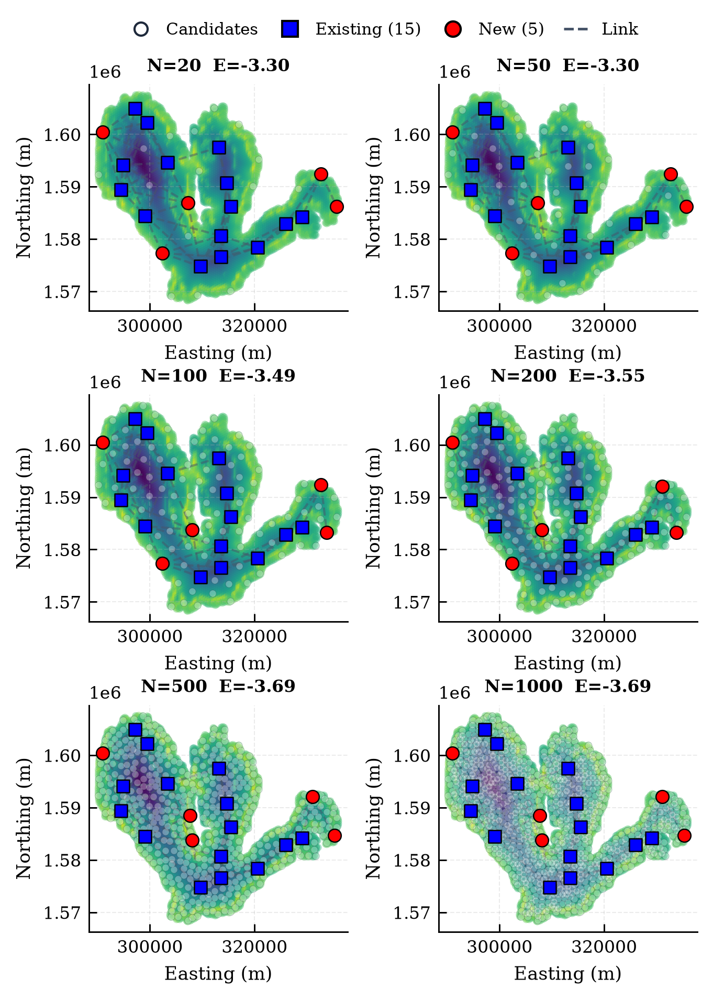


✅ SCIP deployment grid complete.


In [31]:
#@title CELL 5b: SCIP DEPLOYMENT GRID (2x3, IEEE Style, No Metrics)
"""
================================================================================
SCIP DEPLOYMENT GRID – IEEE STYLE (No metrics side panel)
- Creates a 2x3 grid of deployment maps for all SCIP-solved tiers.
- Styling matches Cell 9 (ICCE conference, IEEE standard).
- No metrics textbox; only the map with clear legend and titles.
- Legend is horizontal bar under main title.
- Candidate sites are smaller circles.
================================================================================
"""

# -----------------------------------------------------------------------------
# IMPORTS & STYLING
# -----------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pickle
from pathlib import Path
import re
from matplotlib.collections import LineCollection
from matplotlib.lines import Line2D

# IEEE / Academic Professional Styling (identical to Cell 9)
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 8,
    'axes.titlesize': 9,
    'axes.labelsize': 8.5,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7.5,
    'lines.linewidth': 1.2,
    'lines.markersize': 4,
    'axes.grid': True,
    'grid.alpha': 0.25,
    'grid.linestyle': '--',
    'grid.linewidth': 0.5,
    'axes.linewidth': 0.7,
    'xtick.major.width': 0.7,
    'ytick.major.width': 0.7,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
})

# Colorblind-friendly palette (from Cell 9)
C_BLUE   = '#0072B2'
C_ORANGE = '#E69F00'
C_GREEN  = '#009E73'
C_RED    = '#D55E00'
C_PURPLE = '#CC79A7'
C_GREY   = '#777777'

# -----------------------------------------------------------------------------
# PATHS & CONFIG
# -----------------------------------------------------------------------------
# Ensure config_hash is defined (from Cell 1/2)
try:
    config_hash
except NameError:
    print("⚠️ config_hash not defined; please run Cell 1 & 2 first.")
    raise

# Ensure GDRIVE_BASE / LOCAL_CACHE exist
try:
    GDRIVE_BASE
except NameError:
    print("⚠️ GDRIVE_BASE not defined; using RESULTS_DIR from earlier.")
    try:
        GDRIVE_BASE = RESULTS_DIR
    except NameError:
        raise RuntimeError("Please run the path setup from Cell 1 or define GDRIVE_BASE.")

# Load master data to get background utility and coordinates
master_path = GDRIVE_BASE / f"master_real_{config_hash}.pkl"
if not master_path.exists():
    master_path = LOCAL_CACHE / f"master_real_{config_hash}.pkl"
with open(master_path, "rb") as f:
    master_data = pickle.load(f)
coords_master = master_data["coords"]
U_master = master_data["U"]

# -----------------------------------------------------------------------------
# DISCOVER SCIP RESULT FILES (deduplicated)
# -----------------------------------------------------------------------------
pattern = re.compile(r"scip_result_N(\d+)_([a-f0-9]{8})\.pkl")
scip_files = []
seen_paths = set()

# Check GDRIVE_BASE
for p in GDRIVE_BASE.glob("scip_result_N*_*.pkl"):
    if p not in seen_paths:
        m = pattern.match(p.name)
        if m and m.group(2) == config_hash:
            scip_files.append(p)
            seen_paths.add(p)

# Check LOCAL_CACHE (add if not already seen)
for p in LOCAL_CACHE.glob("scip_result_N*_*.pkl"):
    if p not in seen_paths:
        m = pattern.match(p.name)
        if m and m.group(2) == config_hash:
            scip_files.append(p)
            seen_paths.add(p)

if not scip_files:
    raise FileNotFoundError("No SCIP result files found. Run Cell 5 first.")

# Sort by N
def extract_N_from_path(p):
    m = pattern.match(p.name)
    return int(m.group(1)) if m else 0
scip_files.sort(key=extract_N_from_path)

print(f"Found {len(scip_files)} SCIP results: {[p.name for p in scip_files]}")

# -----------------------------------------------------------------------------
# SINGLE DEPLOYMENT PLOT ON AXIS (No metrics, no legend)
# -----------------------------------------------------------------------------
def plot_deployment_on_ax(ax, instance_data, scip_result, coords_master, U_master,
                          title=None):
    """
    Plot a single deployment map on a given matplotlib axis.
    - No metrics textbox.
    - No legend (will be added separately).
    - Background utility, candidates, selected existing/new, edges.
    - Candidate sites are smaller circles (s=12 instead of s=20).
    """
    # Extract data
    coords_full = np.asarray(instance_data["original_coords"])
    D_MAX = instance_data["D_max"]
    L_c = instance_data.get("L_c", None)
    fixed_indices = list(instance_data.get("fixed_indices", []))
    free_indices = list(instance_data.get("original_indices", []))

    # Solution
    x_sol = scip_result.get("solution")
    if x_sol is None:
        ax.text(0.5, 0.5, "No solution", transform=ax.transAxes, ha='center', va='center')
        return
    x_sol = np.asarray(x_sol, dtype=int)
    selected_free_orig = [free_indices[i] for i in np.where(x_sol == 1)[0] if i < len(free_indices)]
    selected_new = [i for i in selected_free_orig if i not in fixed_indices]
    selected_m = fixed_indices
    all_selected = selected_new + selected_m

    # Background utility (if available)
    if coords_master is not None and U_master is not None:
        ax.scatter(coords_master[:, 0], coords_master[:, 1], c=U_master, cmap='viridis',
                   s=12, alpha=0.4, edgecolor='none', zorder=0)
    else:
        ax.scatter(coords_full[:, 0], coords_full[:, 1], c="#cbd5e1", s=12, alpha=0.4, edgecolor='none', zorder=0)

    # Edges among selected
    selected_edges = []
    valid_edges_lc = instance_data.get("valid_edges_lc", None)
    if valid_edges_lc is not None:
        for (i, j) in valid_edges_lc:
            if i in all_selected and j in all_selected:
                selected_edges.append((i, j))
    else:
        # Fallback: compute distance-based edges from D_MAX
        try:
            from scipy.spatial import cKDTree
            tree = cKDTree(coords_full)
            pairs = tree.query_pairs(r=D_MAX)
            for (i, j) in pairs:
                if i in all_selected and j in all_selected:
                    selected_edges.append((i, j))
        except:
            pass

    if selected_edges:
        segments = [[(coords_full[i, 0], coords_full[i, 1]),
                     (coords_full[j, 0], coords_full[j, 1])] for i, j in selected_edges]
        lc = LineCollection(segments, colors='#475569', alpha=0.5, linewidth=1.0,
                            linestyle='--', zorder=1)
        ax.add_collection(lc)

    # Plot candidates (background points) - SMALLER circles (s=12 instead of s=20)
    if free_indices:
        candidate_coords = coords_full[free_indices]
        ax.scatter(candidate_coords[:, 0], candidate_coords[:, 1], c='white', s=10,
                   alpha=0.3, edgecolor='#1e293b', linewidth=0.2, zorder=2)

    # Existing fixed sites
    if selected_m:
        ax.scatter(coords_full[selected_m, 0], coords_full[selected_m, 1],
                   c='blue', s=35, marker='s', edgecolor='black', linewidth=0.6,
                   zorder=3)
    # New selected sites
    if selected_new:
        ax.scatter(coords_full[selected_new, 0], coords_full[selected_new, 1],
                   c='red', s=35, marker='o', edgecolor='black', linewidth=0.6,
                   zorder=4)

    # Set limits (with padding)
    if coords_master is not None and len(coords_master) > 0:
        xmin, ymin = coords_master.min(axis=0)
        xmax, ymax = coords_master.max(axis=0)
    else:
        xmin, ymin = coords_full.min(axis=0)
        xmax, ymax = coords_full.max(axis=0)
    pad_x = max(0.05 * (xmax - xmin), 1.0)
    pad_y = max(0.05 * (ymax - ymin), 1.0)
    ax.set_xlim(xmin - pad_x, xmax + pad_x)
    ax.set_ylim(ymin - pad_y, ymax + pad_y)

    ax.set_aspect('equal', adjustable='datalim')
    ax.set_xlabel('Easting (m)')
    ax.set_ylabel('Northing (m)')

    if title:
        ax.set_title(title, fontsize=8, fontweight='bold')

# -----------------------------------------------------------------------------
# CREATE 2x3 GRID WITH HORIZONTAL LEGEND
# -----------------------------------------------------------------------------
# Load all instance data once into a dictionary keyed by N
instance_data_cache = {}
for scip_path in scip_files[:6]:  # Only need first 6 for 2x3 grid
    N_true = extract_N_from_path(scip_path)
    if N_true not in instance_data_cache:
        inst_path = GDRIVE_BASE / f"instance_data_N{N_true}_{config_hash}.pkl"
        if not inst_path.exists():
            inst_path = LOCAL_CACHE / f"instance_data_N{N_true}_{config_hash}.pkl"
        if inst_path.exists():
            with open(inst_path, "rb") as f:
                instance_data_cache[N_true] = pickle.load(f)
            print(f"📂 Loaded instance data for N={N_true}")
        else:
            print(f"⚠️ Instance data not found for N={N_true}")

# Now create the grid
n_files = len(scip_files)
n_rows = 3
n_cols = 2
n_plots = min(n_rows * n_cols, n_files)

if n_plots == 0:
    raise RuntimeError("No SCIP results to plot.")

# Create figure with extra space at top for legend and title
fig = plt.figure(figsize=(5.0, 7.0))  # Slightly taller for legend
gs = gridspec.GridSpec(n_rows, n_cols, figure=fig, hspace=0.37, wspace=0.35, top=0.88)

# Track what's in the legend
has_new = False
has_existing = False
has_candidates = False
has_edges = False
sample_counts = {'new': 0, 'existing': 0, 'candidates': 0}

for idx in range(n_plots):
    row = idx // n_cols
    col = idx % n_cols
    ax = fig.add_subplot(gs[row, col])

    scip_path = scip_files[idx]
    N_true = extract_N_from_path(scip_path)

    # Get instance data from cache
    instance_data = instance_data_cache.get(N_true)
    if instance_data is None:
        ax.text(0.5, 0.5, f"N={N_true}\nInstance data missing", 
                transform=ax.transAxes, ha='center', va='center')
        continue

    # Load SCIP result
    with open(scip_path, "rb") as f:
        scip_result = pickle.load(f)
    
    # Track what's in this plot for legend
    fixed_indices = list(instance_data.get("fixed_indices", []))
    free_indices = list(instance_data.get("original_indices", []))
    x_sol = scip_result.get("solution")
    if x_sol is not None:
        x_sol = np.asarray(x_sol, dtype=int)
        selected_free_orig = [free_indices[i] for i in np.where(x_sol == 1)[0] if i < len(free_indices)]
        selected_new = [i for i in selected_free_orig if i not in fixed_indices]
        selected_m = fixed_indices
        if selected_new:
            has_new = True
            sample_counts['new'] = len(selected_new)
        if selected_m:
            has_existing = True
            sample_counts['existing'] = len(selected_m)
        if free_indices:
            has_candidates = True
            sample_counts['candidates'] = len(free_indices)
        # Check for edges
        selected_edges = []
        valid_edges_lc = instance_data.get("valid_edges_lc", None)
        if valid_edges_lc is not None:
            all_selected = selected_new + selected_m
            for (i, j) in valid_edges_lc:
                if i in all_selected and j in all_selected:
                    selected_edges.append((i, j))
        else:
            try:
                from scipy.spatial import cKDTree
                tree = cKDTree(np.asarray(instance_data["original_coords"]))
                pairs = tree.query_pairs(r=instance_data["D_max"])
                all_selected = selected_new + selected_m
                for (i, j) in pairs:
                    if i in all_selected and j in all_selected:
                        selected_edges.append((i, j))
            except:
                pass
        if selected_edges:
            has_edges = True

    # Title: N and energy
    energy = scip_result.get("master_energy", np.nan)
    feasible = scip_result.get("feasible", False)
    if not np.isnan(energy):
        title = f"N={N_true}  E={energy:.2f}"
        if not feasible:
            title += " (inf.)"
    else:
        title = f"N={N_true} (no feasible)"
    
    # Plot (no legend on subplots)
    plot_deployment_on_ax(ax, instance_data, scip_result, coords_master, U_master,
                          title=title)

# Hide unused subplots (if any)
for idx in range(n_plots, n_rows * n_cols):
    row = idx // n_cols
    col = idx % n_cols
    fig.add_subplot(gs[row, col]).axis('off')

# -----------------------------------------------------------------------------
# ADD HORIZONTAL LEGEND UNDER MAIN TITLE
# -----------------------------------------------------------------------------
# Build legend handles based on what's actually in the plots
legend_elements = []

if has_candidates:
    legend_elements.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='white',
                                  markersize=6, markeredgecolor='#1e293b', linewidth=0.5,
                                  label=f'Candidates'))

if has_existing:
    legend_elements.append(Line2D([0], [0], marker='s', color='w', markerfacecolor='blue',
                                  markersize=7, markeredgecolor='black', linewidth=0.6,
                                  label=f'Existing ({sample_counts["existing"]})'))

if has_new:
    legend_elements.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='red',
                                  markersize=7, markeredgecolor='black', linewidth=0.6,
                                  label=f'New ({sample_counts["new"]})'))

if has_edges:
    legend_elements.append(Line2D([0], [0], color='#475569', linewidth=1.2, linestyle='--',
                                  label='Link'))

# Add legend above the subplots (horizontal)
if legend_elements:
    fig.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.95),
               ncol=len(legend_elements), frameon=True, framealpha=0.85, edgecolor='none',
               fontsize=7.5, handlelength=1.5, columnspacing=1.2)


# Save and show
save_path = GDRIVE_BASE / f"scip_deployment_grid_{config_hash}.png"
fig.savefig(save_path, dpi=600, bbox_inches='tight')
fig.savefig(save_path.with_suffix('.pdf'), dpi=600, bbox_inches='tight')
print(f"✅ Deployment grid saved to {save_path} and PDF.")

plt.show()
plt.close(fig)

print("\n✅ SCIP deployment grid complete.")

Found 6 unique instance data files (by N value): ['instance_data_N20_241358d8.pkl', 'instance_data_N50_241358d8.pkl', 'instance_data_N100_241358d8.pkl', 'instance_data_N200_241358d8.pkl', 'instance_data_N500_241358d8.pkl', 'instance_data_N1000_241358d8.pkl']
N values: [20, 50, 100, 200, 500, 1000]
📂 Loaded instance data for N=20
📂 Loaded instance data for N=50
📂 Loaded instance data for N=100
📂 Loaded instance data for N=200
📂 Loaded instance data for N=500
📂 Loaded instance data for N=1000
Global colormap limits: ±1.3547
✅ MIQP matrix grid saved to /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results/miqp_matrix_grid_241358d8.png and PDF.


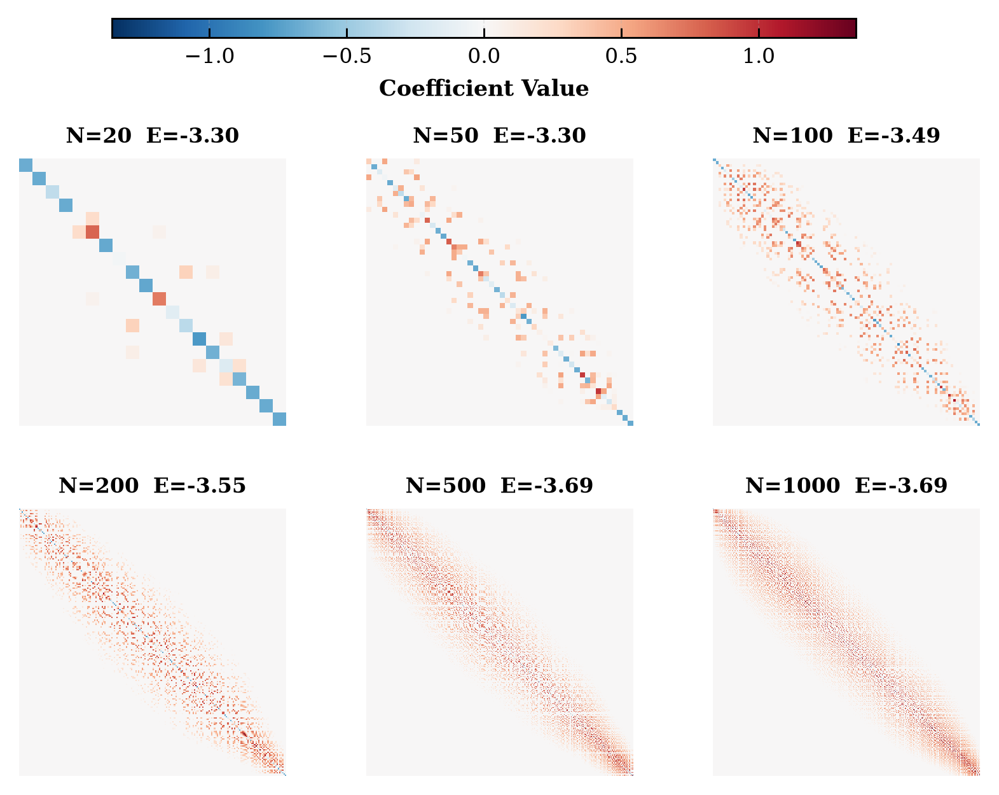


✅ MIQP matrix grid complete.


In [49]:
#@title CELL 5c: MIQP MATRIX GRID (2x3, IEEE Style, Seaborn Heatmaps)
"""
================================================================================
MIQP MATRIX GRID – IEEE STYLE (Seaborn heatmaps)
- Creates a 2x3 grid of MIQP matrix heatmaps for all SCIP-solved tiers.
- Styling matches Cell 9 (ICCE conference, IEEE standard).
- Uses seaborn.heatmap for publication-quality matrices.
================================================================================
"""

# -----------------------------------------------------------------------------
# IMPORTS & STYLING
# -----------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pickle
from pathlib import Path
import re
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# IEEE / Academic Professional Styling (identical to Cell 9)
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 8,
    'axes.titlesize': 9,
    'axes.labelsize': 8.5,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7.5,
    'lines.linewidth': 1.2,
    'lines.markersize': 4,
    'axes.grid': True,
    'grid.alpha': 0.25,
    'grid.linestyle': '--',
    'grid.linewidth': 0.5,
    'axes.linewidth': 0.7,
    'xtick.major.width': 0.7,
    'ytick.major.width': 0.7,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
})

# Colorblind-friendly palette
C_BLUE   = '#0072B2'
C_ORANGE = '#E69F00'
C_GREEN  = '#009E73'
C_RED    = '#D55E00'
C_PURPLE = '#CC79A7'
C_GREY   = '#777777'

# Custom colormap for matrices (RdBu_r similar)
matrix_cmap = LinearSegmentedColormap.from_list('matrix_cmap', ['#67001f', '#b2182b', '#d6604d', '#f4a582', '#fddbc7', '#f7f7f7', '#d1e5f0', '#92c5de', '#4393c3', '#2166ac', '#053061'])

# -----------------------------------------------------------------------------
# PATHS & CONFIG
# -----------------------------------------------------------------------------
# Ensure config_hash is defined (from Cell 1/2)
try:
    config_hash
except NameError:
    print("⚠️ config_hash not defined; please run Cell 1 & 2 first.")
    raise

# Ensure GDRIVE_BASE / LOCAL_CACHE exist
try:
    GDRIVE_BASE
except NameError:
    print("⚠️ GDRIVE_BASE not defined; using RESULTS_DIR from earlier.")
    try:
        GDRIVE_BASE = RESULTS_DIR
    except NameError:
        raise RuntimeError("Please run the path setup from Cell 1 or define GDRIVE_BASE.")

# -----------------------------------------------------------------------------
# DISCOVER INSTANCE DATA FILES (DEDUPLICATED BY N VALUE)
# -----------------------------------------------------------------------------
pattern = re.compile(r"instance_data_N(\d+)_([a-f0-9]{8})\.pkl")
instance_files = []
seen_N_values = set()  # Track N values to avoid duplicates

# Check GDRIVE_BASE
for p in GDRIVE_BASE.glob("instance_data_N*_*.pkl"):
    m = pattern.match(p.name)
    if m and m.group(2) == config_hash:
        N_val = int(m.group(1))
        if N_val not in seen_N_values:
            instance_files.append(p)
            seen_N_values.add(N_val)

# Check LOCAL_CACHE (add only if N not already seen)
for p in LOCAL_CACHE.glob("instance_data_N*_*.pkl"):
    m = pattern.match(p.name)
    if m and m.group(2) == config_hash:
        N_val = int(m.group(1))
        if N_val not in seen_N_values:
            instance_files.append(p)
            seen_N_values.add(N_val)

if not instance_files:
    raise FileNotFoundError("No instance data files found. Run Cell 2 first.")

# Sort by N
instance_files.sort(key=lambda p: int(pattern.match(p.name).group(1)) if pattern.match(p.name) else 0)

print(f"Found {len(instance_files)} unique instance data files (by N value): {[p.name for p in instance_files]}")
print(f"N values: {sorted(seen_N_values)}")

# -----------------------------------------------------------------------------
# BUILD MIQP MATRIX FROM INSTANCE DATA
# -----------------------------------------------------------------------------
def build_miqp_matrix(instance_data, sort_by="coords"):
    """
    Build the MIQP matrix from instance data.
    Returns: mat (N x N matrix with a on diagonal, Q on off-diagonal)
    """
    N = instance_data["N"]
    a = np.asarray(instance_data["a"], dtype=float)
    Q_edges = instance_data.get("Q_edges", [])
    
    mat = np.zeros((N, N), dtype=float)
    np.fill_diagonal(mat, a)
    for i, j, val in Q_edges:
        mat[i, j] = val
        mat[j, i] = val
    
    # Spatial sorting if requested and coords available
    if sort_by == "coords" and "coords" in instance_data:
        coords_free = np.asarray(instance_data["coords"])
        order = np.lexsort((coords_free[:, 0], -coords_free[:, 1]))
        mat = mat[np.ix_(order, order)]
    
    return mat

# -----------------------------------------------------------------------------
# SINGLE MATRIX HEATMAP ON AXIS
# -----------------------------------------------------------------------------
# ... [all imports and styling remain the same] ...

# -----------------------------------------------------------------------------
# SINGLE MATRIX HEATMAP ON AXIS (modified - no colorbar)
# -----------------------------------------------------------------------------
def plot_matrix_on_ax(ax, mat, title=None, vmin=None, vmax=None):
    """
    Plot a single MIQP matrix heatmap on a given matplotlib axis using seaborn.
    No colorbar - will be added separately for the whole grid.
    """
    # Determine colormap limits
    off_diag_mask = ~np.eye(mat.shape[0], dtype=bool)
    off_diag_vals = mat[off_diag_mask]
    
    if vmin is None or vmax is None:
        if len(off_diag_vals) > 0 and np.max(np.abs(off_diag_vals)) > 0:
            max_val = np.max(np.abs(off_diag_vals))
            vmin, vmax = -max_val, max_val
        else:
            max_val = np.max(np.abs(mat)) if np.max(np.abs(mat)) > 0 else 1.0
            vmin, vmax = -max_val, max_val
    
    # Plot heatmap WITHOUT colorbar
    sns.heatmap(mat, ax=ax, cmap='RdBu_r', 
                vmin=vmin, vmax=vmax,
                cbar=False,  # No individual colorbar
                square=True,
                xticklabels=False,
                yticklabels=False,
                rasterized=True)
    
    if title:
        ax.set_title(title, fontsize=8, fontweight='bold')
    
    # Remove axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    return vmin, vmax

# -----------------------------------------------------------------------------
# CREATE 2x3 GRID WITH SHARED COLORBAR
# -----------------------------------------------------------------------------
# Load instance data once
instance_data_cache = {}
for inst_path in instance_files[:6]:  # Only need first 6 for 2x3 grid
    N_true = extract_N_from_path(inst_path)
    if N_true not in instance_data_cache:
        with open(inst_path, "rb") as f:
            instance_data_cache[N_true] = pickle.load(f)
            print(f"📂 Loaded instance data for N={N_true}")

n_files = len(instance_files)
n_rows = 2
n_cols = 3
n_plots = min(n_rows * n_cols, n_files)

if n_plots == 0:
    raise RuntimeError("No instance data to plot.")

# Create figure with extra space at bottom for colorbar
fig = plt.figure(figsize=(6.5, 5.0))  # Slightly taller for colorbar
gs = gridspec.GridSpec(n_rows, n_cols, figure=fig, 
                       hspace=0.1, wspace=0.3, 
                       top=0.85, bottom=0.15)  # Make space at bottom

# First pass: collect all matrices to determine global colormap limits
all_mats = []
for idx in range(n_plots):
    inst_path = instance_files[idx]
    N_true = extract_N_from_path(inst_path)
    instance_data = instance_data_cache.get(N_true)
    if instance_data is not None:
        mat = build_miqp_matrix(instance_data, sort_by="coords")
        all_mats.append(mat)

# Determine global vmin/vmax from all matrices
global_vmin = 0
global_vmax = 0
for mat in all_mats:
    off_diag_mask = ~np.eye(mat.shape[0], dtype=bool)
    off_diag_vals = mat[off_diag_mask]
    if len(off_diag_vals) > 0:
        max_val = np.max(np.abs(off_diag_vals))
        if max_val > global_vmax:
            global_vmax = max_val

if global_vmax == 0:
    global_vmax = 1.0
global_vmin = -global_vmax

print(f"Global colormap limits: ±{global_vmax:.4f}")

# Second pass: plot all matrices
for idx in range(n_plots):
    row = idx // n_cols
    col = idx % n_cols
    ax = fig.add_subplot(gs[row, col])

    inst_path = instance_files[idx]
    N_true = extract_N_from_path(inst_path)
    instance_data = instance_data_cache.get(N_true)
    
    if instance_data is None:
        ax.text(0.5, 0.5, f"N={N_true}\nData missing", 
                transform=ax.transAxes, ha='center', va='center')
        continue
    
    # Build matrix
    mat = build_miqp_matrix(instance_data, sort_by="coords")
    N = instance_data["N"]
    
    # Get energy info from SCIP result if available
    scip_path = GDRIVE_BASE / f"scip_result_N{N_true}_{config_hash}.pkl"
    if not scip_path.exists():
        scip_path = LOCAL_CACHE / f"scip_result_N{N_true}_{config_hash}.pkl"
    
    energy_str = ""
    if scip_path.exists():
        with open(scip_path, "rb") as f:
            scip_result = pickle.load(f)
        energy = scip_result.get("master_energy", np.nan)
        if not np.isnan(energy):
            energy_str = f"  E={energy:.2f}"
    
    title = f"N={N_true}{energy_str}"
    
    # Plot WITHOUT colorbar
    plot_matrix_on_ax(ax, mat, title=title, 
                      vmin=global_vmin, vmax=global_vmax)

# Hide unused subplots (if any)
for idx in range(n_plots, n_rows * n_cols):
    row = idx // n_cols
    col = idx % n_cols
    fig.add_subplot(gs[row, col]).axis('off')

# --- ADD SHARED COLORBAR AT THE BOTTOM ---
# Create a colorbar using a dummy ScalarMappable
import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=global_vmin, vmax=global_vmax)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='RdBu_r')
sm.set_array([])

# Add colorbar below the grid
cbar_ax = fig.add_axes([0.2, 0.95, 0.6, 0.02])  # [left, bottom, width, height]
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Coefficient Value', fontsize=8.5, fontweight='bold')
cbar.ax.tick_params(labelsize=8)

# Save and show
save_path = GDRIVE_BASE / f"miqp_matrix_grid_{config_hash}.png"
fig.savefig(save_path, dpi=600, bbox_inches='tight')
fig.savefig(save_path.with_suffix('.pdf'), dpi=600, bbox_inches='tight')
print(f"✅ MIQP matrix grid saved to {save_path} and PDF.")

plt.show()
plt.close(fig)

print("\n✅ MIQP matrix grid complete.")

In [8]:
#@title CELL 6: GRID SEARCH SETUP (Golden Rule Bound + Helpers)
"""
================================================================================
CELL 6: GRID SEARCH SETUP
- Theoretical lower bound ("Golden Rule") on penalty weights via row-sum bound:
  P_min = max_i ( |a_i| + sum_j |Q_ij| )
  This is the largest possible objective change from flipping ANY single
  variable -- a penalty above this guarantees a constraint violation always
  increases energy for at least the single-flip neighborhood.
- QUBO builder + dense adapter (same conventions as prior SA tuning cells).
- Grid configuration: diagonal 4-point sweep by default, optional full 2D grid.
================================================================================
"""
import json, pickle, hashlib, time, re, warnings
from pathlib import Path
from itertools import product
import numpy as np
import jijmodeling as jm

warnings.filterwarnings('ignore')

# -----------------------------------------------------------------------------
# CONFIG
# -----------------------------------------------------------------------------
GRID_CONFIG = {
    "TARGET_N": None,
    "MULTIPLIERS": [0.1, 0.5, 1, 2, 3, 5, 7, 10, 15, 20],
    "ENABLE_2D_GRID": True,  # Keep this for N>=200
    "NUM_READS": 1024,
    "REPEATS": 5,  # Increase from 3 to 5 for better stats
    "FEAS_THRESHOLD": 0.95,
}

FORCE_RETUNE_GRID = True

# -----------------------------------------------------------------------------
# QUBO MODEL (same as prior SA cells)
# -----------------------------------------------------------------------------
def build_augmented_model() -> jm.Problem:
    problem = jm.Problem("WQM_Augmented", sense=jm.ProblemSense.MINIMIZE)
    N_ph = problem.Length("N")
    K_ph = problem.Length("K")
    a_ph = problem.Float("a", shape=(N_ph,))
    Q_ph = problem.Float("Q", shape=(N_ph, N_ph))
    neigh_ph = problem.Binary("neigh", shape=(N_ph, N_ph))
    fixed_neighbors_ph = problem.Float("fixed_neighbors", shape=(N_ph,))
    x = problem.BinaryVar("x", shape=(N_ph,))
    obj_linear = jm.sum(N_ph, lambda i: a_ph[i] * x[i])
    obj_quad = jm.sum(
        jm.product(N_ph, N_ph).filter(lambda i, j: i < j),
        lambda i, j: Q_ph[i, j] * x[i] * x[j]
    )
    problem += obj_linear + obj_quad
    problem += problem.Constraint("budget", jm.sum(N_ph, lambda i: x[i]) == K_ph)
    problem += problem.Constraint(
        "connectivity",
        lambda i: x[i] <= fixed_neighbors_ph[i] + jm.sum(N_ph, lambda j: neigh_ph[i, j] * x[j]),
        domain=N_ph
    )
    return problem

def compile_instance(problem: jm.Problem, instance_data: dict):
    placeholder_names = {p.name for p in problem.placeholders.values()}
    filtered = {k: v for k, v in instance_data.items() if k in placeholder_names}
    return problem.eval(filtered)

def get_penalty_weights(instance, lambda_budget: float, lambda_conn: float) -> dict:
    penalty_weights = {}
    for c in instance.constraints:
        if c.name == "budget":
            penalty_weights[c.id] = lambda_budget
        elif c.name == "connectivity":
            penalty_weights[c.id] = lambda_conn
    return penalty_weights

def adapt_sparse_to_dense(instance_data: dict) -> dict:
    N = instance_data["N"]
    Q = np.zeros((N, N), dtype=float)
    for i, j, val in instance_data.get("Q_edges", []):
        Q[i, j] = val
        Q[j, i] = val
    neigh = np.zeros((N, N), dtype=int)
    for i, nbrs in enumerate(instance_data.get("neighbors", [])):
        for j in nbrs:
            if j < N:
                neigh[i, j] = 1
    fn_raw = instance_data.get("fixed_neighbors", None)
    if fn_raw is not None:
        fixed_neighbors = np.asarray(fn_raw, dtype=float)
    else:
        fixed_neighbors = np.zeros(N, dtype=float)
    instance_data["Q"] = Q
    instance_data["neigh"] = neigh
    instance_data["fixed_neighbors"] = fixed_neighbors
    return instance_data

# -----------------------------------------------------------------------------
# ENERGY / FEASIBILITY (vectorized over a batch of reads)
# -----------------------------------------------------------------------------
def compute_energy_batch(X: np.ndarray, a: np.ndarray, Q: np.ndarray) -> np.ndarray:
    """X: (num_reads, N) binary matrix. Returns (num_reads,) energies."""
    X = np.atleast_2d(X).astype(float)
    linear = X @ a
    XQ = X @ Q
    quad = 0.5 * np.sum(XQ * X, axis=1)
    return linear + quad

def check_feasibility_batch(X: np.ndarray, neigh: np.ndarray, K: int, fixed_neighbors: np.ndarray):
    """Returns budget_viol, conn_viol, is_feasible -- each shape (num_reads,)."""
    X = np.atleast_2d(X).astype(float)
    num_selected = np.sum(X, axis=1)
    budget_viol = np.abs(num_selected - K)
    neighbor_counts = X @ neigh
    fn = fixed_neighbors.reshape(1, -1)
    has_connection = (neighbor_counts > 0) | (fn > 0)
    isolated = (X > 0) & (~has_connection)
    conn_viol = np.sum(isolated, axis=1)
    is_feasible = (budget_viol == 0) & (conn_viol == 0)
    return budget_viol, conn_viol, is_feasible

def decode_response(response, N):
    """OpenJij response -> dense (num_reads, N) binary matrix."""
    num_reads = response.record.shape[0]
    X = np.zeros((num_reads, N), dtype=np.float64)
    for col_idx, var_idx in enumerate(response.indices):
        if var_idx < N:
            X[:, var_idx] = np.round(response.record['sample'][:, col_idx])
    return X

# -----------------------------------------------------------------------------
# GOLDEN RULE BOUND
# -----------------------------------------------------------------------------
def compute_golden_rule_bound(a: np.ndarray, Q: np.ndarray) -> dict:
    """
    P_min (row-sum bound) = max_i ( |a_i| + sum_j |Q_ij| )
    This is a SUFFICIENT bound: any single-variable flip cannot change the
    unpenalized objective by more than this, for any i. A penalty at or above
    this guarantees a constraint violation always increases energy, at least
    with respect to single-flip neighborhoods.

    Also reports the looser Cmax (largest single coefficient) for comparison
    -- Cmax is NOT guaranteed sufficient on its own for dense graphs, but is
    useful as a lower reference point.
    """
    row_sum_bound = float(np.max(np.abs(a) + np.sum(np.abs(Q), axis=1)))
    Cmax = float(max(np.max(np.abs(a)), np.max(np.abs(Q)) if np.any(Q) else 0.0, 1e-8))
    return {"P_min": row_sum_bound, "Cmax": Cmax}

print("✅ CELL 6 loaded: Golden Rule bound + QUBO helpers ready.")
print(f"   Grid config: {GRID_CONFIG}")

✅ CELL 6 loaded: Golden Rule bound + QUBO helpers ready.
   Grid config: {'TARGET_N': None, 'MULTIPLIERS': [0.1, 0.5, 1, 2, 3, 5, 7, 10, 15, 20], 'ENABLE_2D_GRID': True, 'NUM_READS': 1024, 'REPEATS': 5, 'FEAS_THRESHOLD': 0.95}


In [9]:
#@title CELL 7: GRID SEARCH EXECUTION (with tqdm + Parallel + Per‑Point Logging)
"""
================================================================================
CELL 7: GRID SEARCH EXECUTION
- Embarrassingly parallel: penalty points are evaluated independently.
- Uses ProcessPoolExecutor to leverage multiple CPU cores.
- Falls back to sequential if parallel fails.
- Prints a one‑line summary for each completed penalty point.
================================================================================
"""
import openjij as oj
import concurrent.futures
import os
import pickle
import json
import time
import re
from itertools import product
from tqdm.notebook import tqdm

# -----------------------------------------------------------------------------
# WORKER FUNCTION (must be at top level for pickling)
# -----------------------------------------------------------------------------
def evaluate_penalty_point(
    lambda_budget: float,
    lambda_conn: float,
    instance_path: Path,
    config_hash: str,
    GRID_CONFIG: dict,
) -> dict:
    """
    Run REPEATS SA runs for a single (lb, lc) penalty point.
    Loads instance data from disk, so we don't pass huge objects.
    """
    with open(instance_path, "rb") as f:
        instance_data = pickle.load(f)
    
    # Adapt to dense
    N = instance_data["N"]
    Q = np.zeros((N, N), dtype=float)
    for i, j, val in instance_data.get("Q_edges", []):
        Q[i, j] = val
        Q[j, i] = val
    neigh = np.zeros((N, N), dtype=int)
    for i, nbrs in enumerate(instance_data.get("neighbors", [])):
        for j in nbrs:
            if j < N:
                neigh[i, j] = 1
    fn_raw = instance_data.get("fixed_neighbors", None)
    fixed_neighbors = np.asarray(fn_raw, dtype=float) if fn_raw is not None else np.zeros(N, dtype=float)
    
    a = np.asarray(instance_data["a"], dtype=np.float64)
    K = instance_data["K"]
    # Build QUBO model
    model = build_augmented_model()
    filtered_data = {"N": N, "K": K, "a": a, "Q": Q, "neigh": neigh, "fixed_neighbors": fixed_neighbors}
    instance = model.eval(filtered_data)
    penalty_weights = get_penalty_weights(instance, lambda_budget, lambda_conn)
    qubo_dict, offset = instance.to_qubo(penalty_weights=penalty_weights)
    
    # ---- FIX: compute sweeps directly ----
    num_sweeps = max(1000, 10 * N)   # scale with N
    
    feas_rates, best_feas_energies, best_raw_energies = [], [], []
    avg_budget_viols, avg_conn_viols = [], []
    
    for _ in range(GRID_CONFIG["REPEATS"]):
        sampler = oj.SASampler()
        response = sampler.sample_qubo(
            qubo_dict,
            num_reads=GRID_CONFIG["NUM_READS"],
            num_sweeps=num_sweeps,      # now computed locally
            sparse=True,
        )
        X = decode_response(response, N)
        energies = compute_energy_batch(X, a, Q)
        budget_viol, conn_viol, is_feasible = check_feasibility_batch(X, neigh, K, fixed_neighbors)
        
        feas_rates.append(float(np.mean(is_feasible)))
        avg_budget_viols.append(float(np.mean(budget_viol)))
        avg_conn_viols.append(float(np.mean(conn_viol)))
        best_raw_energies.append(float(np.min(energies)))
        if np.any(is_feasible):
            best_feas_energies.append(float(np.min(energies[is_feasible])))
    
    return {
        "lambda_budget": lambda_budget,
        "lambda_conn": lambda_conn,
        "penalty_sum": lambda_budget + lambda_conn,
        "feas_rate_mean": float(np.mean(feas_rates)),
        "feas_rate_std": float(np.std(feas_rates)),
        "best_feasible_obj_mean": float(np.mean(best_feas_energies)) if best_feas_energies else None,
        "best_feasible_obj_std": float(np.std(best_feas_energies)) if best_feas_energies else None,
        "n_repeats_with_feasible": len(best_feas_energies),
        "best_raw_obj_mean": float(np.mean(best_raw_energies)),
        "best_raw_obj_std": float(np.std(best_raw_energies)),
        "avg_budget_viol_mean": float(np.mean(avg_budget_viols)),
        "avg_conn_viol_mean": float(np.mean(avg_conn_viols)),
    }

# -----------------------------------------------------------------------------
# MAIN EXECUTION (parallel per tier)
# -----------------------------------------------------------------------------
grid_results = {}
pattern = re.compile(r"instance_data_N(\d+)(?:_[a-f0-9]{8})?\.pkl")
instance_files = []
for directory in [GDRIVE_BASE, LOCAL_CACHE]:
    for f in directory.glob("instance_data_N*.pkl"):
        if pattern.match(f.name):
            instance_files.append(f)
instance_files = list(dict.fromkeys(instance_files))

def extract_N(p):
    m = pattern.match(p.name)
    return int(m.group(1)) if m else None

if GRID_CONFIG["TARGET_N"] is not None:
    instance_files = [p for p in instance_files if extract_N(p) in GRID_CONFIG["TARGET_N"]]

seen, deduped = set(), []
for p in sorted(instance_files, key=extract_N):
    N = extract_N(p)
    if N not in seen:
        seen.add(N)
        deduped.append(p)
instance_files = deduped

if not instance_files:
    raise FileNotFoundError("No instance_data_N*.pkl files found.")

print(f"📋 Tiers to grid-search: {[extract_N(p) for p in instance_files]}")

# Outer loop: Tiers
for inst_path in tqdm(instance_files, desc="🔬 Processing Tiers", position=0):
    N_true = extract_N(inst_path)
    
    results_path = GDRIVE_BASE / f"grid_search_N{N_true}_{config_hash}.json"
    if results_path.exists() and not FORCE_RETUNE_GRID:
        with open(results_path, "r") as f:
            grid_results[N_true] = json.load(f)
        continue

    # Load metadata (only needed for P_min and grid points)
    with open(inst_path, "rb") as f:
        instance_data = pickle.load(f)
    N = instance_data["N"]
    K = instance_data["K"]
    a = np.asarray(instance_data["a"], dtype=np.float64)
    Q = np.zeros((N, N), dtype=float)
    for i, j, val in instance_data.get("Q_edges", []):
        Q[i, j] = val
        Q[j, i] = val
    bound = compute_golden_rule_bound(a, Q)
    P_min = bound["P_min"]

    # Build grid points
    P_values = [m * P_min for m in GRID_CONFIG["MULTIPLIERS"]]
    if GRID_CONFIG["ENABLE_2D_GRID"]:
        grid_points = list(product(P_values, P_values))
    else:
        grid_points = [(p, p) for p in P_values]

    print(f"\n🔬 Tier N={N_true}: {len(grid_points)} penalty points, each with {GRID_CONFIG['REPEATS']} repeats.")

    tier_results = []
    t_tier_start = time.perf_counter()

    # ---- PARALLEL DISPATCH ----
    use_parallel = True
    max_workers = min(16, os.cpu_count())
    try:
        with concurrent.futures.ProcessPoolExecutor(max_workers=max_workers) as executor:
            # Submit all tasks
            futures = {
                executor.submit(
                    evaluate_penalty_point,
                    lb,
                    lc,
                    inst_path,
                    config_hash,
                    GRID_CONFIG
                ): (lb, lc)
                for lb, lc in grid_points
            }
            
            # Collect with progress bar
            pbar = tqdm(total=len(grid_points), desc=f"N={N_true} (P_min={P_min:.2f})", position=1, leave=False)
            for future in concurrent.futures.as_completed(futures):
                result = future.result()
                tier_results.append(result)
                # ---- Print per‑point summary ----
                print(f"  ✅ N={N_true} | λb={result['lambda_budget']:6.2f} λc={result['lambda_conn']:6.2f} | "
                      f"feas={result['feas_rate_mean']*100:5.1f}% | bestE={result['best_raw_obj_mean']:8.4f} | "
                      f"violB={result['avg_budget_viol_mean']:4.2f} violC={result['avg_conn_viol_mean']:4.2f}")
                pbar.update(1)
                pbar.set_postfix(feas=f"{result['feas_rate_mean']*100:.1f}%")
            pbar.close()
    except (RuntimeError, pickle.PicklingError, AttributeError) as e:
        print(f"⚠️ Parallel execution failed: {e}. Falling back to sequential.")
        use_parallel = False

    # ---- FALLBACK: SEQUENTIAL ----
    if not use_parallel:
        pbar = tqdm(grid_points, desc=f"N={N_true} (sequential)", position=1, leave=False)
        for lb, lc in pbar:
            result = evaluate_penalty_point(lb, lc, inst_path, config_hash, GRID_CONFIG)
            tier_results.append(result)
            # ---- Print per‑point summary (same format) ----
            print(f"  ✅ N={N_true} | λb={result['lambda_budget']:6.2f} λc={result['lambda_conn']:6.2f} | "
                  f"feas={result['feas_rate_mean']*100:5.1f}% | bestE={result['best_raw_obj_mean']:8.4f} | "
                  f"violB={result['avg_budget_viol_mean']:4.2f} violC={result['avg_conn_viol_mean']:4.2f}")
            pbar.set_postfix(feas=f"{result['feas_rate_mean']*100:.1f}%")
        pbar.close()

    tier_time = time.perf_counter() - t_tier_start
    
    grid_results[N_true] = {
        "N": N_true,
        "P_min": P_min,
        "Cmax": bound["Cmax"],
        "grid_points": tier_results,
        "config": GRID_CONFIG,
        "tier_time_seconds": tier_time,
    }

    # Save results
    with open(results_path, "w") as f:
        json.dump(grid_results[N_true], f, indent=2)

print("\n✅ CELL 7 complete: grid search finished for all tiers.")

📋 Tiers to grid-search: [20, 50, 100, 200, 500, 1000]


🔬 Processing Tiers:   0%|          | 0/6 [00:00<?, ?it/s]


🔬 Tier N=20: 100 penalty points, each with 5 repeats.


N=20 (P_min=1.10):   0%|          | 0/100 [00:00<?, ?it/s]

  ✅ N=20 | λb=  0.11 λc=  7.68 | feas= 15.7% | bestE= -3.7942 | violB=1.08 violC=0.00
  ✅ N=20 | λb=  0.55 λc=  0.55 | feas= 79.2% | bestE= -3.5948 | violB=0.09 violC=0.27
  ✅ N=20 | λb=  0.11 λc=  0.55 | feas=  1.2% | bestE= -5.0813 | violB=1.49 violC=0.92
  ✅ N=20 | λb=  0.55 λc=  5.49 | feas= 75.5% | bestE= -3.4666 | violB=0.25 violC=0.00
  ✅ N=20 | λb=  0.11 λc= 16.47 | feas= 14.4% | bestE= -3.7859 | violB=1.09 violC=0.00
  ✅ N=20 | λb=  0.11 λc=  0.11 | feas=  0.0% | bestE= -6.2163 | violB=2.69 violC=3.77
  ✅ N=20 | λb=  0.11 λc=  1.10 | feas=  2.3% | bestE= -3.9733 | violB=1.26 violC=0.12
  ✅ N=20 | λb=  0.55 λc=  0.11 | feas=  0.4% | bestE= -4.7159 | violB=1.13 violC=2.21
  ✅ N=20 | λb=  0.55 λc=  1.10 | feas= 85.2% | bestE= -3.5628 | violB=0.12 violC=0.05
  ✅ N=20 | λb=  0.55 λc=  3.29 | feas= 83.4% | bestE= -3.4666 | violB=0.17 violC=0.00
  ✅ N=20 | λb=  0.11 λc= 10.98 | feas= 16.0% | bestE= -3.7765 | violB=1.06 violC=0.00
  ✅ N=20 | λb=  0.11 λc=  5.49 | feas= 14.6% | bestE= 

N=50 (P_min=2.33):   0%|          | 0/100 [00:00<?, ?it/s]

  ✅ N=50 | λb=  1.17 λc=  1.17 | feas= 98.7% | bestE= -3.4351 | violB=0.00 violC=0.01
  ✅ N=50 | λb=  0.23 λc=  0.23 | feas=  0.1% | bestE= -4.6363 | violB=1.05 violC=1.60
  ✅ N=50 | λb=  1.17 λc=  4.67 | feas= 99.3% | bestE= -3.3587 | violB=0.01 violC=0.00
  ✅ N=50 | λb=  1.17 λc=  7.00 | feas= 98.8% | bestE= -3.3320 | violB=0.01 violC=0.00
  ✅ N=50 | λb=  1.17 λc=  0.23 | feas=  5.1% | bestE= -3.6633 | violB=0.06 violC=1.84
  ✅ N=50 | λb=  1.17 λc=  2.33 | feas= 98.5% | bestE= -3.4384 | violB=0.01 violC=0.00
  ✅ N=50 | λb=  1.17 λc= 11.67 | feas= 97.3% | bestE= -3.3300 | violB=0.03 violC=0.00
  ✅ N=50 | λb=  0.23 λc=  2.33 | feas= 12.1% | bestE= -3.8534 | violB=1.42 violC=0.06
  ✅ N=50 | λb=  0.23 λc= 11.67 | feas=  6.0% | bestE= -3.3903 | violB=1.96 violC=0.00
  ✅ N=50 | λb=  0.23 λc= 35.01 | feas=  5.8% | bestE= -3.3816 | violB=1.83 violC=0.00
  ✅ N=50 | λb=  0.23 λc=  1.17 | feas=  9.7% | bestE= -4.2597 | violB=1.23 violC=0.33
  ✅ N=50 | λb=  0.23 λc=  4.67 | feas= 10.8% | bestE= 

N=100 (P_min=6.08):   0%|          | 0/100 [00:00<?, ?it/s]

  ✅ N=100 | λb=  3.04 λc=  0.61 | feas= 47.1% | bestE= -2.8942 | violB=0.00 violC=0.64
  ✅ N=100 | λb=  3.04 λc=  3.04 | feas= 99.9% | bestE= -3.2743 | violB=0.00 violC=0.00
  ✅ N=100 | λb=  3.04 λc= 12.16 | feas= 98.0% | bestE= -2.9323 | violB=0.02 violC=0.00
  ✅ N=100 | λb=  3.04 λc=  6.08 | feas= 99.9% | bestE= -3.1294 | violB=0.00 violC=0.00
  ✅ N=100 | λb=  0.61 λc=  0.61 | feas= 53.8% | bestE= -4.1625 | violB=0.39 violC=0.34
  ✅ N=100 | λb=  3.04 λc= 30.40 | feas= 49.0% | bestE= -2.8461 | violB=0.60 violC=0.00
  ✅ N=100 | λb=  0.61 λc=  3.04 | feas= 33.7% | bestE= -3.8419 | violB=0.87 violC=0.05
  ✅ N=100 | λb=  0.61 λc= 42.56 | feas=  3.0% | bestE= -3.3412 | violB=2.60 violC=0.00
  ✅ N=100 | λb=  0.61 λc=  6.08 | feas= 15.8% | bestE= -3.6488 | violB=1.38 violC=0.02
  ✅ N=100 | λb=  3.04 λc= 18.24 | feas= 77.6% | bestE= -3.0377 | violB=0.23 violC=0.00
  ✅ N=100 | λb=  0.61 λc= 12.16 | feas=  8.9% | bestE= -3.4851 | violB=2.03 violC=0.00
  ✅ N=100 | λb=  0.61 λc= 30.40 | feas=  3.

N=200 (P_min=11.87):   0%|          | 0/100 [00:00<?, ?it/s]

  ✅ N=200 | λb=  5.94 λc= 11.87 | feas= 38.3% | bestE= -2.1198 | violB=0.73 violC=0.00
  ✅ N=200 | λb=  5.94 λc= 23.74 | feas= 25.5% | bestE= -2.4185 | violB=1.13 violC=0.00
  ✅ N=200 | λb=  1.19 λc= 23.74 | feas= 17.9% | bestE= -3.0805 | violB=2.69 violC=0.00
  ✅ N=200 | λb=  5.94 λc=  1.19 | feas= 91.2% | bestE= -1.8972 | violB=0.00 violC=0.10
  ✅ N=200 | λb=  1.19 λc=  1.19 | feas= 56.7% | bestE= -3.0237 | violB=0.39 violC=0.05
  ✅ N=200 | λb=  1.19 λc=  5.94 | feas= 23.8% | bestE= -3.3947 | violB=1.22 violC=0.00
  ✅ N=200 | λb=  5.94 λc= 59.35 | feas= 15.5% | bestE= -2.4443 | violB=2.07 violC=0.00
  ✅ N=200 | λb=  5.94 λc=  5.94 | feas= 61.5% | bestE= -1.9687 | violB=0.38 violC=0.00
  ✅ N=200 | λb=  1.19 λc= 35.61 | feas= 19.1% | bestE= -2.7971 | violB=2.99 violC=0.00
  ✅ N=200 | λb=  1.19 λc= 11.87 | feas= 18.6% | bestE= -3.1369 | violB=2.01 violC=0.00
  ✅ N=200 | λb=  5.94 λc= 35.61 | feas= 21.3% | bestE= -2.1779 | violB=1.54 violC=0.00
  ✅ N=200 | λb=  1.19 λc= 83.09 | feas= 16.

N=500 (P_min=31.71):   0%|          | 0/100 [00:00<?, ?it/s]

  ✅ N=500 | λb= 15.85 λc= 15.85 | feas= 24.0% | bestE= -1.8670 | violB=4.07 violC=0.00
  ✅ N=500 | λb= 15.85 λc= 63.41 | feas=  0.2% | bestE= -0.5872 | violB=9.85 violC=0.00
  ✅ N=500 | λb= 15.85 λc=158.54 | feas=  0.0% | bestE=  0.9993 | violB=11.39 violC=0.00
  ✅ N=500 | λb= 15.85 λc= 95.12 | feas=  0.1% | bestE=  1.1169 | violB=10.63 violC=0.00
  ✅ N=500 | λb=  3.17 λc=  3.17 | feas= 31.9% | bestE= -2.6632 | violB=3.48 violC=0.03
  ✅ N=500 | λb= 15.85 λc=  3.17 | feas= 36.7% | bestE= -2.3284 | violB=0.00 violC=1.47
  ✅ N=500 | λb=  3.17 λc= 15.85 | feas=  0.2% | bestE= -0.7698 | violB=10.16 violC=0.00
  ✅ N=500 | λb= 15.85 λc= 31.71 | feas=  2.0% | bestE= -1.5908 | violB=7.97 violC=0.00
  ✅ N=500 | λb=  3.17 λc= 63.41 | feas=  0.1% | bestE=  1.5227 | violB=12.07 violC=0.00
  ✅ N=500 | λb=  3.17 λc= 31.71 | feas=  0.2% | bestE=  0.4290 | violB=11.34 violC=0.00
  ✅ N=500 | λb=  3.17 λc=634.15 | feas=  0.0% | bestE=  2.7846 | violB=13.57 violC=0.00
  ✅ N=500 | λb=  3.17 λc=221.95 | fea

N=1000 (P_min=74.19):   0%|          | 0/100 [00:00<?, ?it/s]

  ✅ N=1000 | λb= 37.10 λc= 74.19 | feas=  0.0% | bestE= 19.5478 | violB=23.05 violC=0.00
  ✅ N=1000 | λb=  7.42 λc=  7.42 | feas=  0.3% | bestE=  0.3700 | violB=18.09 violC=0.00
  ✅ N=1000 | λb= 37.10 λc= 37.10 | feas=  0.2% | bestE=  2.1897 | violB=18.16 violC=0.00
  ✅ N=1000 | λb= 37.10 λc=  7.42 | feas= 77.4% | bestE= -1.2416 | violB=0.00 violC=0.23
  ✅ N=1000 | λb= 37.10 λc=148.39 | feas=  0.0% | bestE= 19.9838 | violB=25.14 violC=0.00
  ✅ N=1000 | λb=  7.42 λc= 37.10 | feas=  0.0% | bestE= 36.0213 | violB=25.53 violC=0.00
  ✅ N=1000 | λb= 37.10 λc=222.58 | feas=  0.0% | bestE= 35.4068 | violB=25.96 violC=0.00
  ✅ N=1000 | λb= 74.19 λc=  7.42 | feas= 58.5% | bestE= -1.0150 | violB=0.00 violC=0.42
  ✅ N=1000 | λb= 74.19 λc= 37.10 | feas= 37.2% | bestE= -0.9548 | violB=2.01 violC=0.00
  ✅ N=1000 | λb= 37.10 λc=519.35 | feas=  0.0% | bestE= 48.2630 | violB=27.07 violC=0.00
  ✅ N=1000 | λb=  7.42 λc= 74.19 | feas=  0.0% | bestE= 26.3652 | violB=26.67 violC=0.00
  ✅ N=1000 | λb= 37.10 λ

In [10]:
#@title CELL 8: PUBLICATION-READY SUMMARY TABLES & LATEX EXPORT
"""
================================================================================
CELL 8: SUMMARY TABLES & LATEX EXPORT
- Converts grid search results into structured Pandas DataFrames.
- Calculates the "Cheating Gap" (Best Raw - Best Feasible) to quantify infeasible escapes.
- Selects winners based on FEAS_THRESHOLD.
- Generates a Cross-Tier Summary with Penalty Scaling Multipliers.
- Exports clean LaTeX tables ready for IEEE conference templates.
================================================================================
"""
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

winners = {}
all_tier_dfs = {}
cross_tier_rows = []

print(f"\n{'='*130}")
print("📊 DETAILED GRID SEARCH ANALYSIS")
print(f"{'='*130}")

for N_true, res in sorted(grid_results.items()):
    points = res["grid_points"]
    P_min = res["P_min"]
    
    # 1. Build Per-Tier DataFrame
    tier_data = []
    for p in points:
        # Calculate "Cheating Gap": How much better is the raw energy vs feasible energy?
        # If this is large, the solver is heavily "cheating" by violating constraints.
        if p["best_feasible_obj_mean"] is not None:
            cheat_gap = p["best_raw_obj_mean"] - p["best_feasible_obj_mean"]
        else:
            cheat_gap = np.nan
            
        tier_data.append({
            "λ_budget": p["lambda_budget"],
            "λ_conn": p["lambda_conn"],
            "Penalty Sum": p["penalty_sum"],
            "Feasibility (%)": p["feas_rate_mean"] * 100,
            "Feas Std Dev (%)": p["feas_rate_std"] * 100,
            "Best Feasible Obj": p["best_feasible_obj_mean"],
            "Best Raw Obj": p["best_raw_obj_mean"],
            "Cheating Gap": cheat_gap,
            "Avg Budget Viol": p["avg_budget_viol_mean"],
            "Avg Conn Viol": p["avg_conn_viol_mean"]
        })
    
    df_tier = pd.DataFrame(tier_data)
    all_tier_dfs[N_true] = df_tier
    
    # 2. Select Winner
    eligible = df_tier[df_tier["Feasibility (%)"] >= GRID_CONFIG["FEAS_THRESHOLD"] * 100]
    if not eligible.empty:
        winner_row = eligible.loc[eligible["Penalty Sum"].idxmin()]
        winner_note = f"(≥{GRID_CONFIG['FEAS_THRESHOLD']*100:.0f}% Feasible)"
    else:
        winner_row = df_tier.loc[df_tier["Feasibility (%)"].idxmax()]
        winner_note = "(Fallback: Highest Feasibility Found)"
        
    winners[N_true] = winner_row.to_dict()
    
    # 3. Calculate Scaling Multiplier for Cross-Tier Analysis
    # We use the sum of the multipliers. If diagonal, it's 2 * multiplier.
    # If off-diagonal, it's (lb/P_min + lc/P_min).
    lb_mult = winner_row["λ_budget"] / P_min
    lc_mult = winner_row["λ_conn"] / P_min
    
    cross_tier_rows.append({
        "N": N_true,
        "P_min": P_min,
        "Winner λ_budget": winner_row["λ_budget"],
        "Winner λ_conn": winner_row["λ_conn"],
        "Winner Penalty Sum": winner_row["Penalty Sum"],
        "Feasibility (%)": winner_row["Feasibility (%)"],
        "Best Feasible Obj": winner_row["Best Feasible Obj"],
        "Cheating Gap": winner_row["Cheating Gap"],
        "λ_b Multiplier": lb_mult,
        "λ_c Multiplier": lc_mult,
        "Status": winner_note
    })

# ==============================================================================
# DISPLAY & EXPORT
# ==============================================================================

# 1. Display Per-Tier Tables (Nice for Notebook)
for N_true, df in all_tier_dfs.items():
    print(f"\n N = {N_true} (P_min = {grid_results[N_true]['P_min']:.4f})")
    # Format for display
    display_cols = ["λ_budget", "λ_conn", "Penalty Sum", "Feasibility (%)", "Best Feasible Obj", "Cheating Gap"]
    display_df = df[display_cols].copy()
    display_df["Best Feasible Obj"] = display_df["Best Feasible Obj"].map(lambda x: f"{x:.4f}" if pd.notnull(x) else "N/A")
    display_df["Cheating Gap"] = display_df["Cheating Gap"].map(lambda x: f"{x:.4f}" if pd.notnull(x) else "N/A")
    print(display_df.to_string(index=False))

# 2. Build Cross-Tier Summary DataFrame
df_cross = pd.DataFrame(cross_tier_rows)

print(f"\n{'='*130}")
print("📊 CROSS-TIER WINNER SUMMARY")
print(f"{'='*130}")
print(df_cross.to_string(index=False))

# 3. Generate LaTeX Code for the Paper
# This is formatted for a standard IEEE two-column or single-column table.
latex_cols = ["N", "P_min", "Winner Penalty Sum", "Feasibility (%)", "Best Feasible Obj", "λ_b Multiplier", "λ_c Multiplier"]
df_latex = df_cross[latex_cols].copy()

# Format floats for LaTeX
df_latex["P_min"] = df_latex["P_min"].map(lambda x: f"{x:.2f}")
df_latex["Winner Penalty Sum"] = df_latex["Winner Penalty Sum"].map(lambda x: f"{x:.2f}")
df_latex["Feasibility (%)"] = df_latex["Feasibility (%)"].map(lambda x: f"{x:.1f}")
df_latex["Best Feasible Obj"] = df_latex["Best Feasible Obj"].map(lambda x: f"{x:.4f}" if pd.notnull(x) else "N/A")
df_latex["λ_b Multiplier"] = df_latex["λ_b Multiplier"].map(lambda x: f"{x:.1f}x")
df_latex["λ_c Multiplier"] = df_latex["λ_c Multiplier"].map(lambda x: f"{x:.1f}x")

latex_table = df_latex.to_latex(
    index=False, 
    caption="Optimal Penalty Weights and Scaling Multipliers across Resolution Tiers",
    label="tab:penalty_scaling",
    column_format="|c|c|c|c|c|c|c|",
    escape=False
)

print(f"\n{'='*130}")
print(" LATEX TABLE CODE (Copy-paste this into your .tex file)")
print(f"{'='*130}")
print(latex_table)

# 4. Save Data
df_cross.to_csv(GDRIVE_BASE / f"cross_tier_summary_{config_hash}.csv", index=False)
with open(GDRIVE_BASE / f"grid_search_winners_{config_hash}.json", "w") as f:
    # Convert numpy types to native python types for JSON serialization
    json_winners = {k: {sk: float(sv) if isinstance(sv, (np.floating, float)) else sv for sk, sv in v.items()} for k, v in winners.items()}
    json.dump(json_winners, f, indent=2)

print(f"\n✅ Cell 8 complete. CSV and JSON saved.")


📊 DETAILED GRID SEARCH ANALYSIS

 N = 20 (P_min = 1.0978)
 λ_budget    λ_conn  Penalty Sum  Feasibility (%) Best Feasible Obj Cheating Gap
 0.109782  7.684738     7.794520        15.683594           -3.0147      -0.7796
 0.548910  0.548910     1.097820        79.179688           -3.3013      -0.2935
 0.109782  0.548910     0.658692         1.210938           -3.3013      -1.7800
 0.548910  5.489098     6.038008        75.546875           -3.3013      -0.1654
 0.109782 16.467295    16.577077        14.375000           -3.0558      -0.7301
 0.109782  0.109782     0.219564         0.000000               N/A          N/A
 0.109782  1.097820     1.207602         2.265625           -2.7639      -1.2094
 0.548910  0.109782     0.658692         0.410156           -2.7125      -2.0034
 0.548910  1.097820     1.646730        85.234375           -3.3013      -0.2615
 0.548910  3.293459     3.842369        83.398438           -3.3013      -0.1654
 0.109782 10.978197    11.087979        15.976562 

🎨 Generating publication-ready plots in: /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results/grid_search_plots_241358d8
✅ Greedy baseline computed.


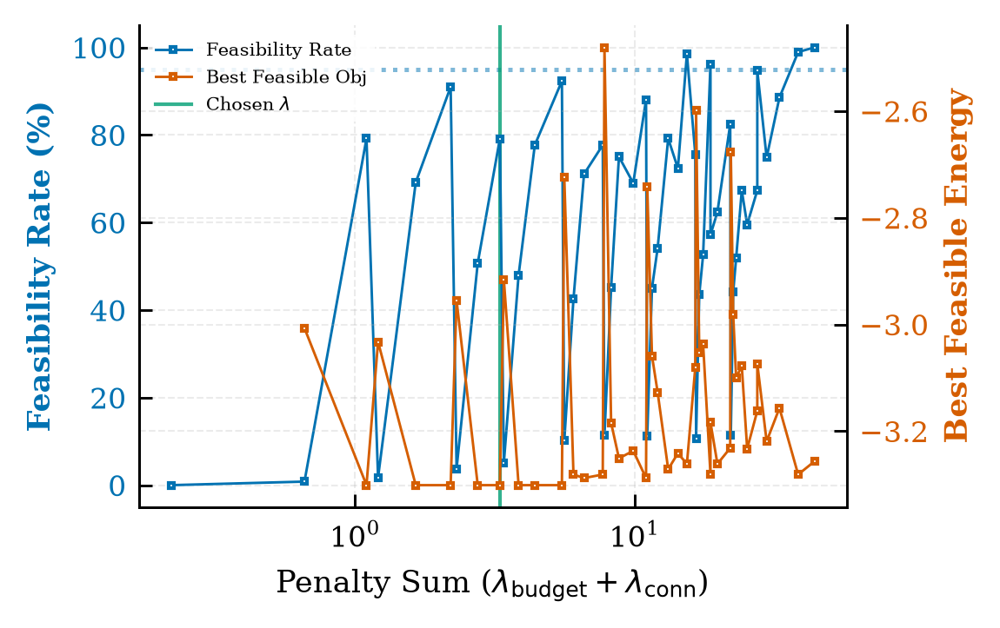

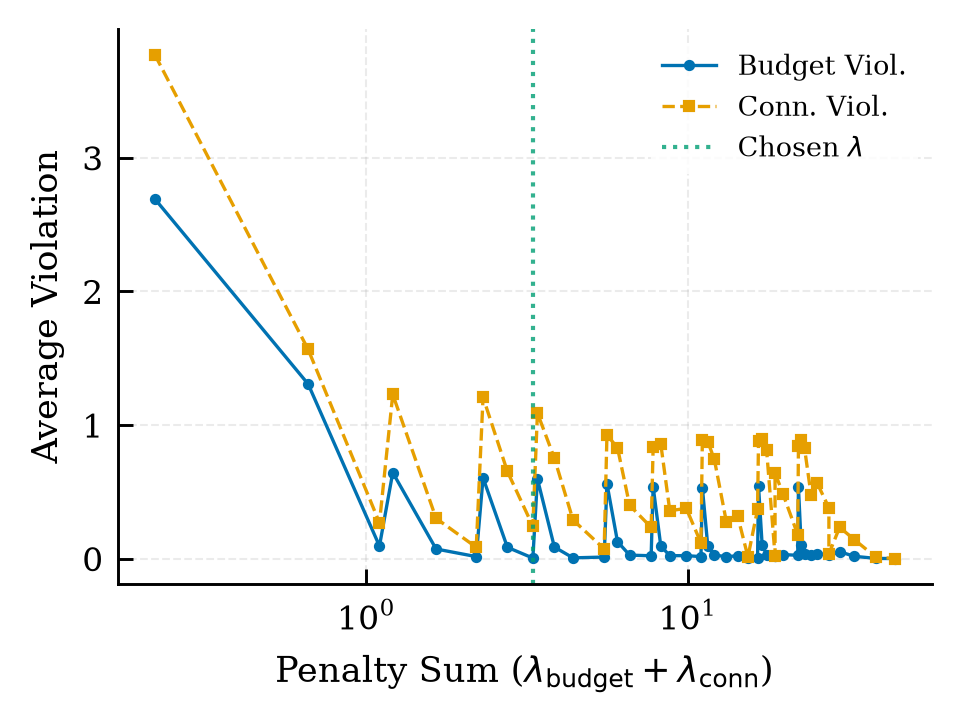

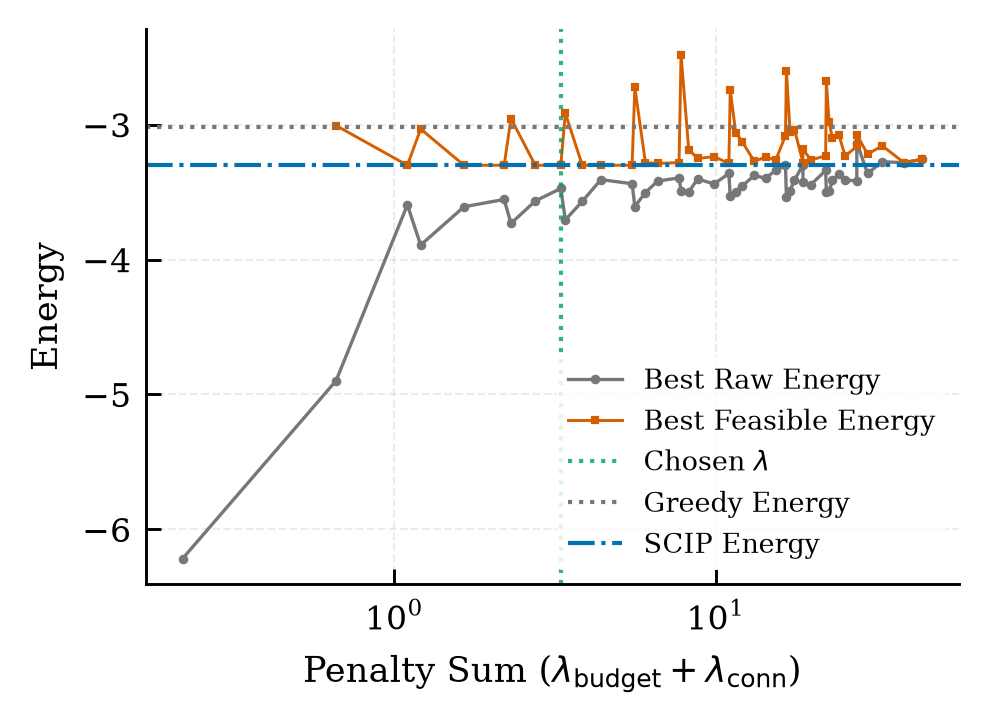

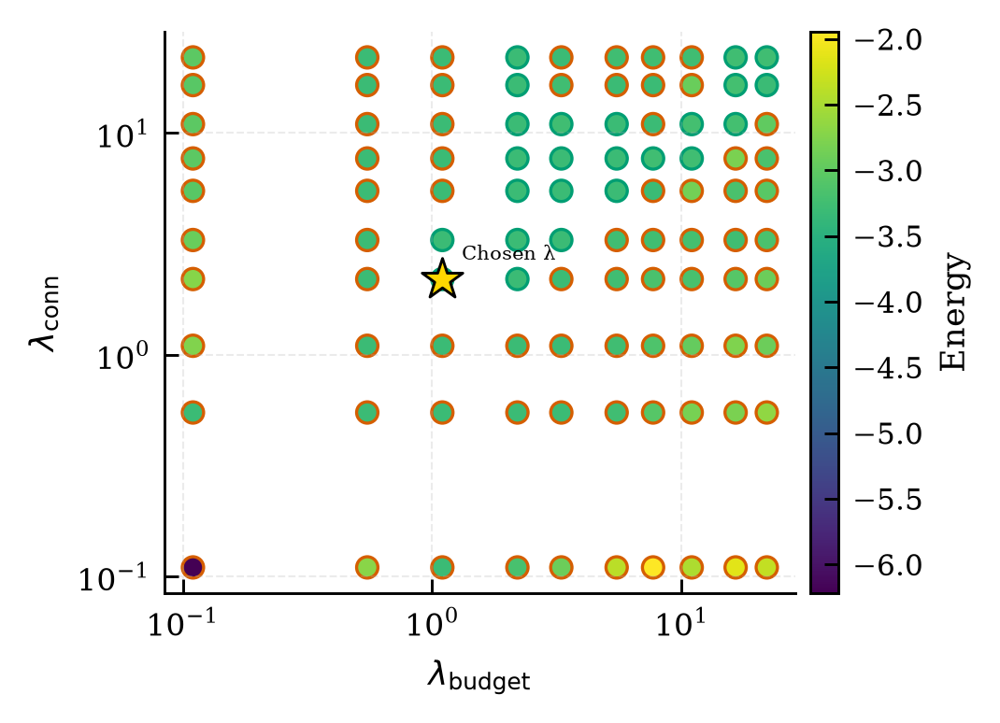

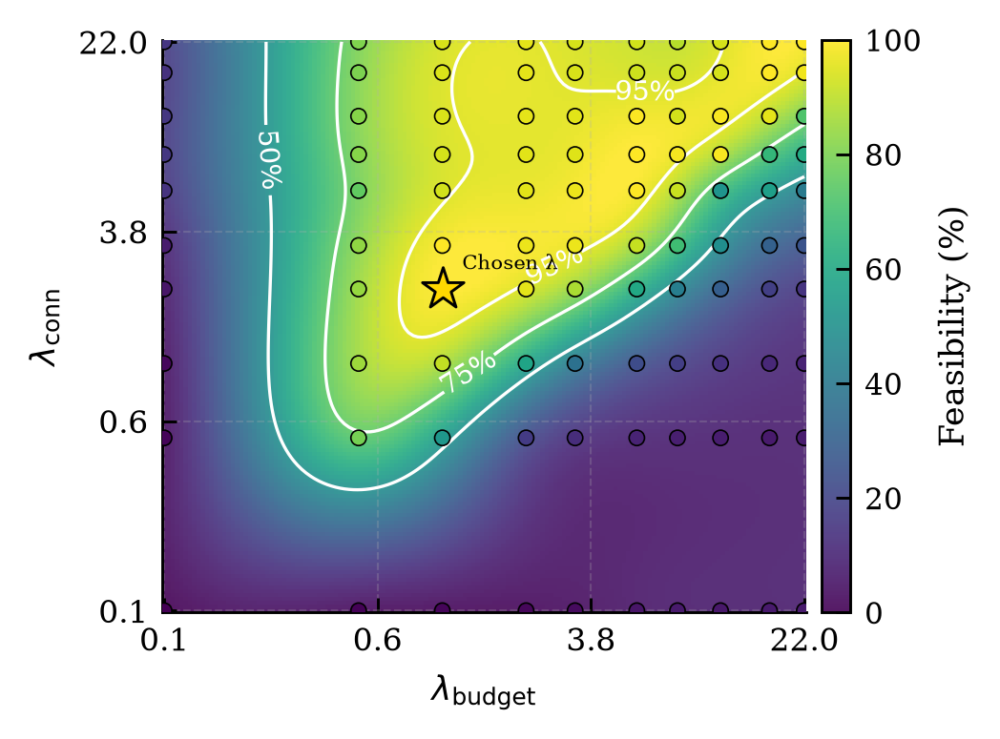

...

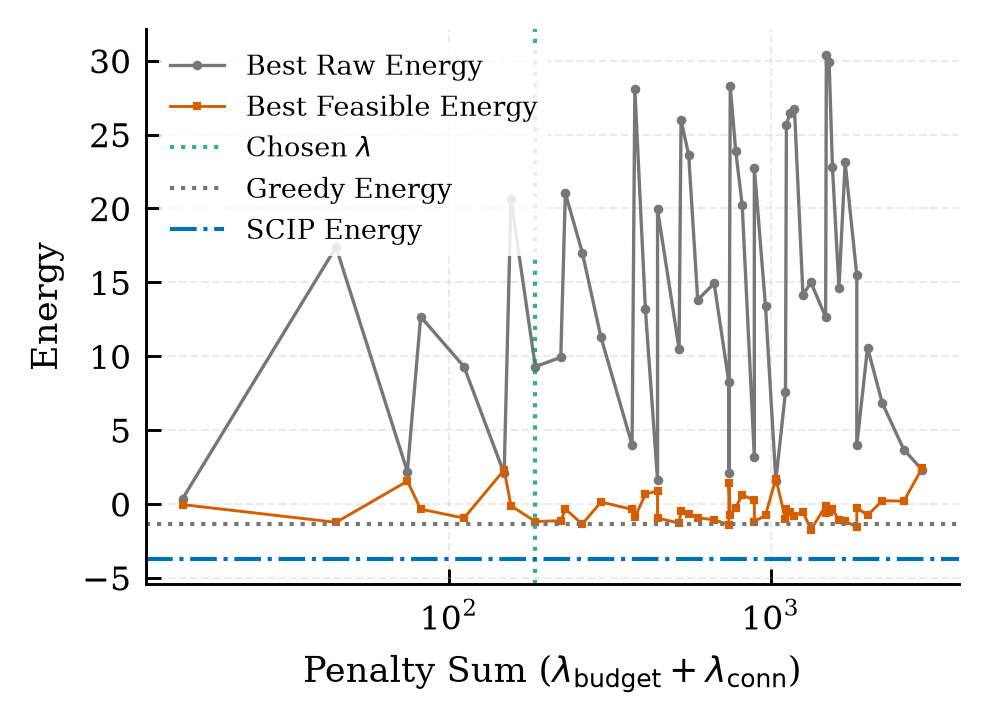

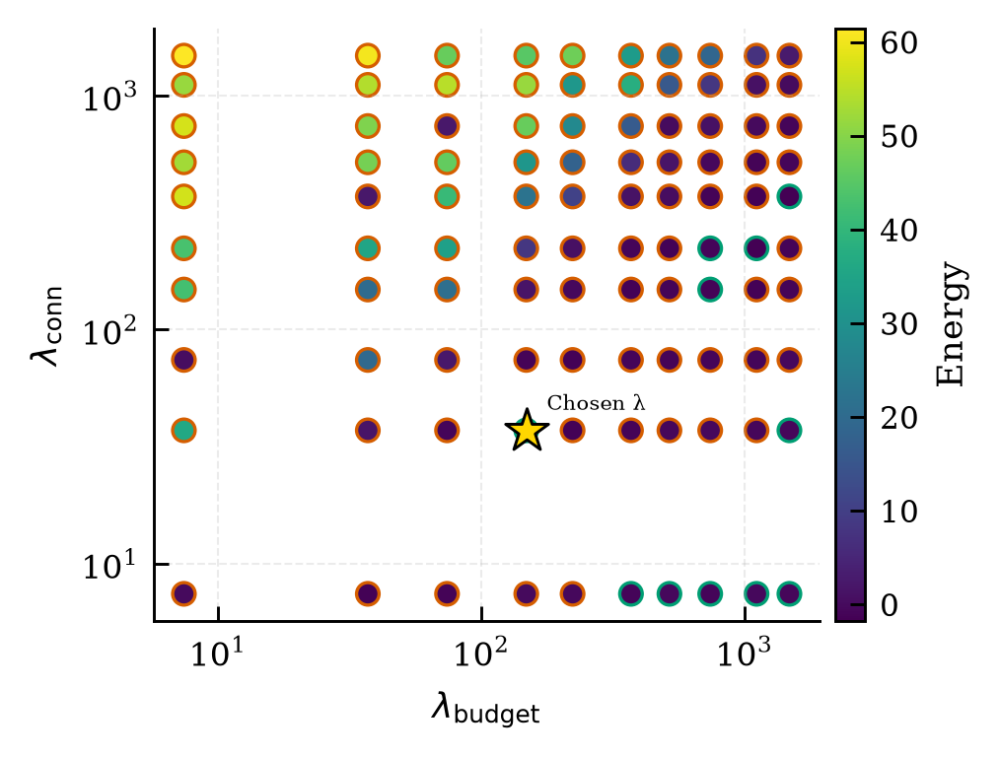

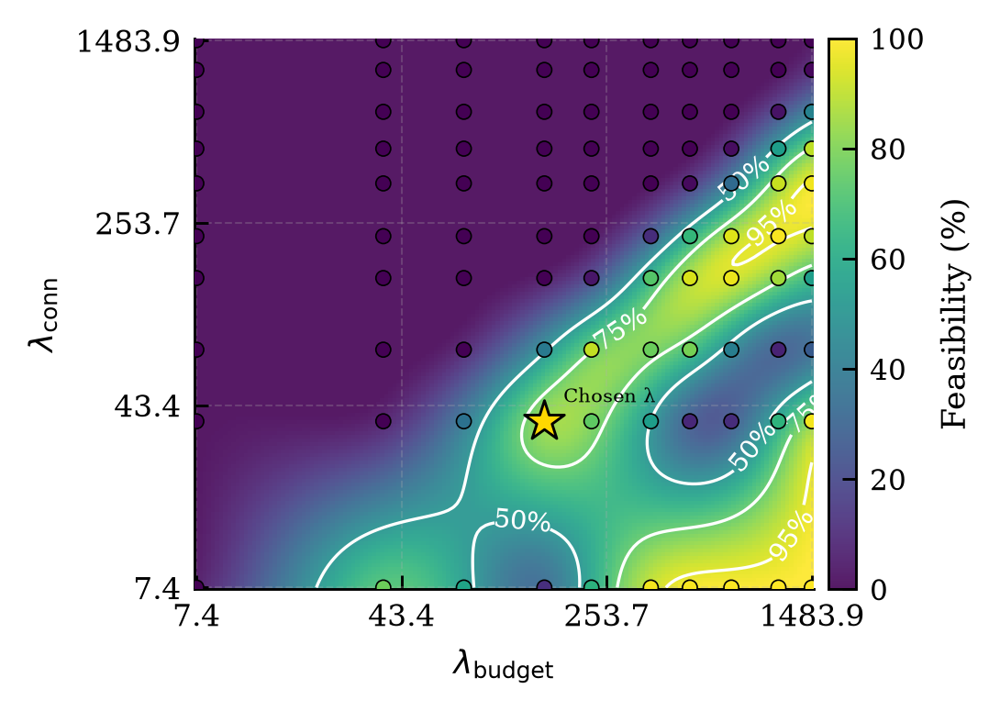

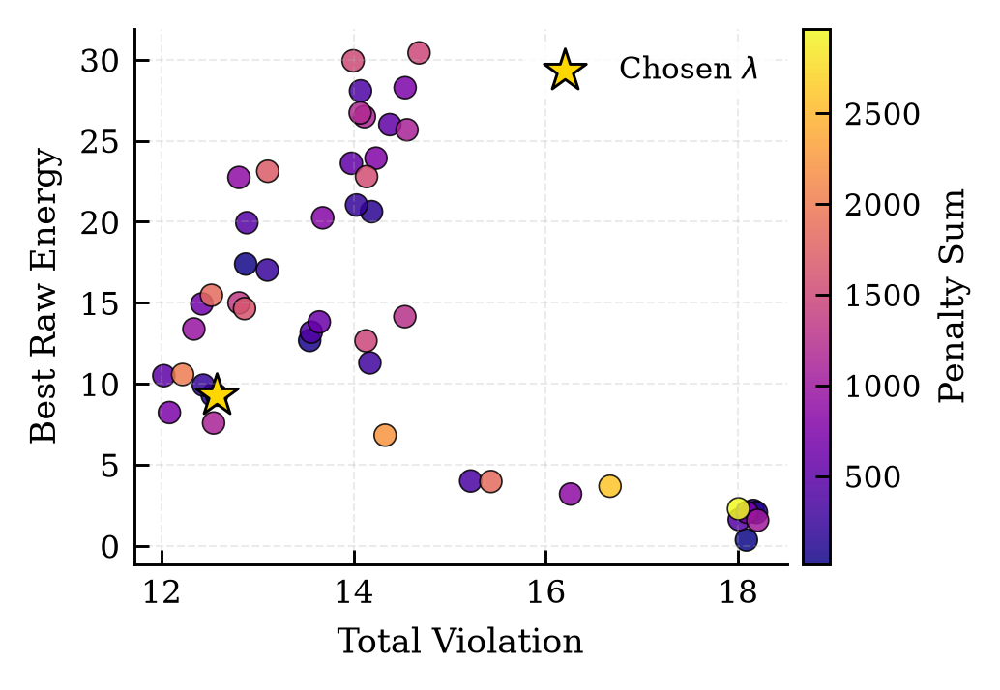

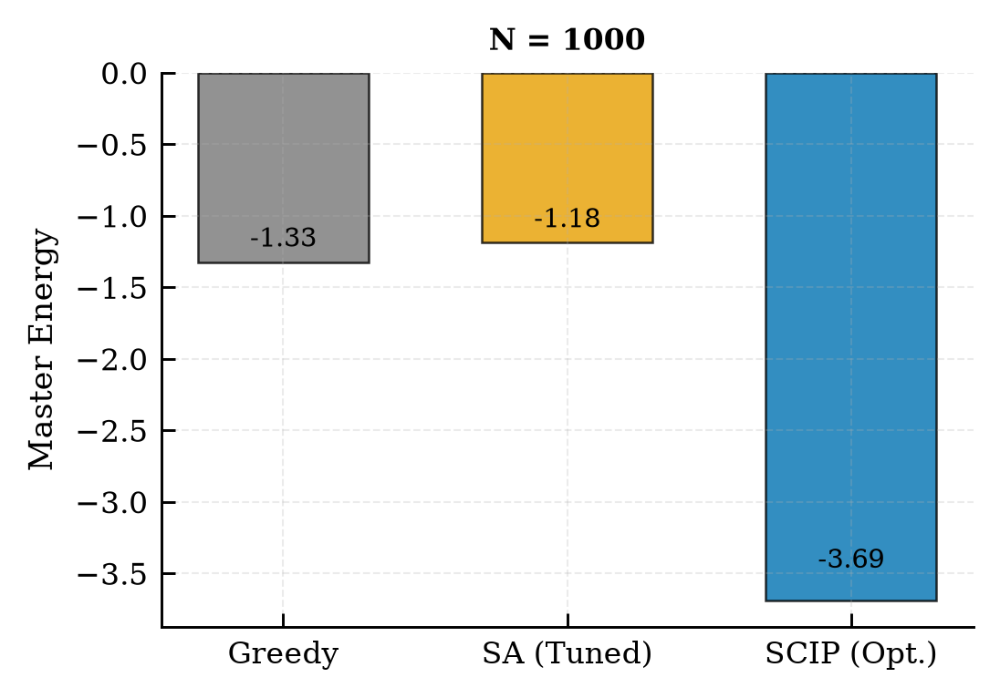


📊 Generating Cross-N Scaling Plots...


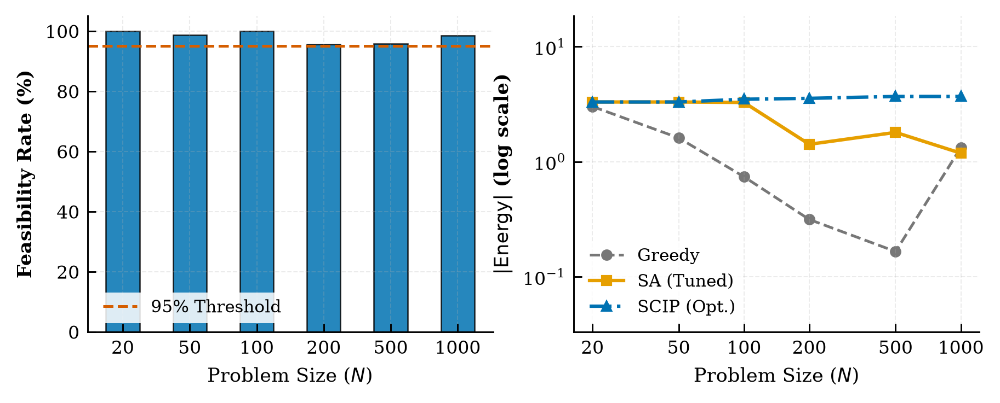

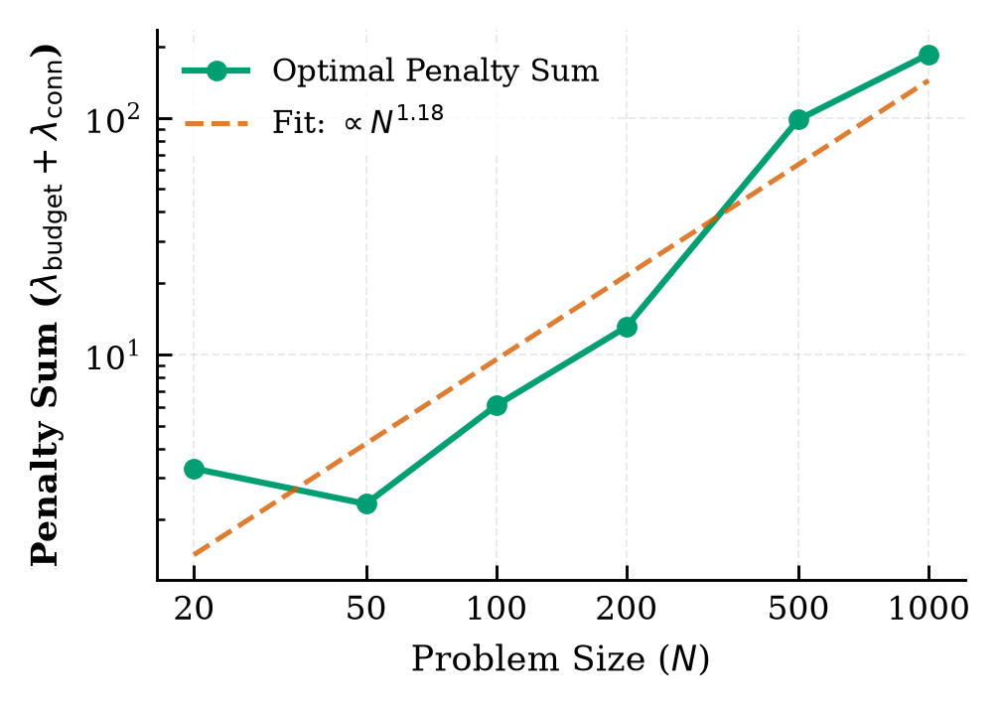

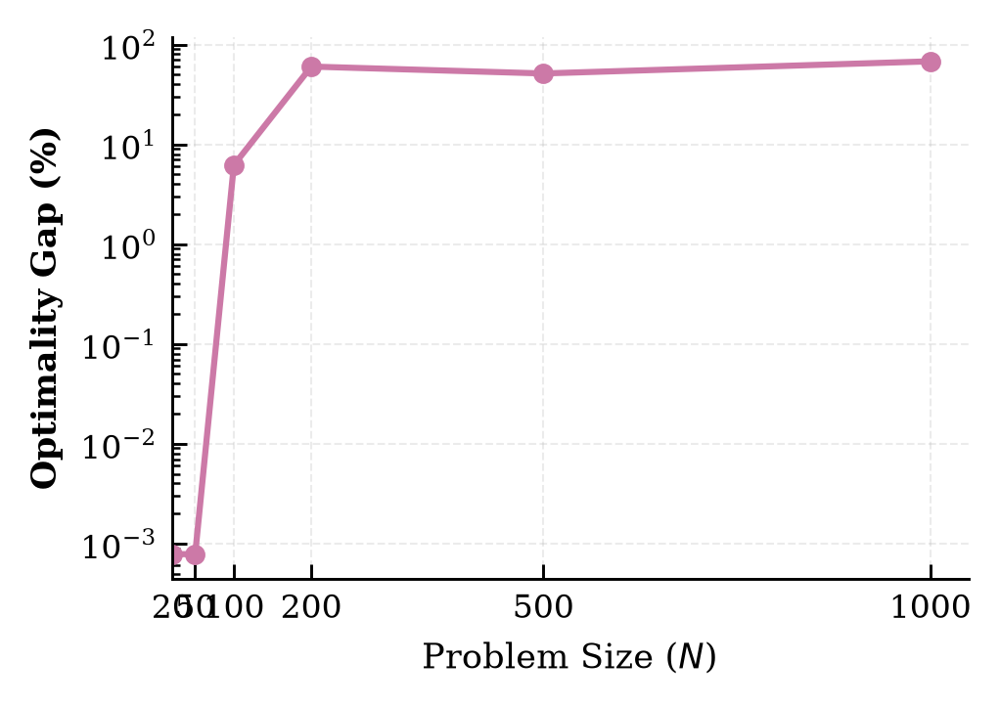

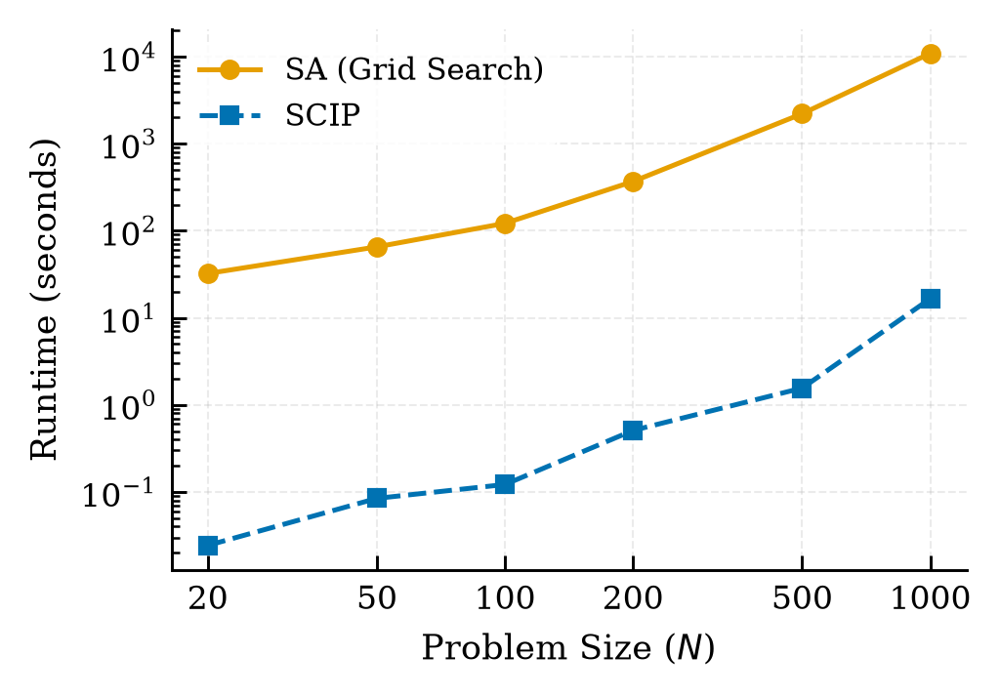


✅ CELL 9 complete: Clean PDF and PNG plots saved to /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results/grid_search_plots_241358d8


In [80]:
# CELL 9: PUBLICATION-READY PLOTS (IEEE Standard - Clean Layout & Spacing)
# ==============================================================================
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import pickle
import matplotlib.ticker as ticker
from scipy.interpolate import Rbf, griddata

# ---- IEEE / Academic Professional Styling ----
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 8,
    'axes.titlesize': 9,
    'axes.labelsize': 8.5,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7.5,
    'lines.linewidth': 1.2,
    'lines.markersize': 4,
    'axes.grid': True,
    'grid.alpha': 0.25,
    'grid.linestyle': '--',
    'grid.linewidth': 0.5,
    'axes.linewidth': 0.7,
    'xtick.major.width': 0.7,
    'ytick.major.width': 0.7,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
})

# Colorblind-friendly palette
C_BLUE   = '#0072B2'
C_ORANGE = '#E69F00'
C_GREEN  = '#009E73'
C_RED    = '#D55E00'
C_PURPLE = '#CC79A7'
C_GREY   = '#777777'

PLOT_DIR = GDRIVE_BASE / f"grid_search_plots_{config_hash}"
PLOT_DIR.mkdir(parents=True, exist_ok=True)
print(f"🎨 Generating publication-ready plots in: {PLOT_DIR}")

def show_and_save(fig, name):
    """Clean save helper using native tight bounding box."""
    fig.savefig(PLOT_DIR / f"{name}.pdf", bbox_inches='tight', pad_inches=0.03)
    fig.savefig(PLOT_DIR / f"{name}.png", bbox_inches='tight', pad_inches=0.03)
    plt.show()
    plt.close(fig)

# ==============================================================================
# 0. LOAD MASTER DATA & REAL FUNCTIONS
# ==============================================================================
try:
    a_master
except NameError:
    with open(GDRIVE_BASE / f"master_real_{config_hash}.pkl", "rb") as f:
        md = pickle.load(f)
    a_master = md["a"]
    Q_master_edges = md["Q_edges"]

# Real implementations (from Cell 6)
def compute_energy_sparse(x, a, Q_edges):
    x = np.asarray(x, dtype=bool)
    energy = np.dot(a, x.astype(float))
    for i, j, val in Q_edges:
        if x[i] and x[j]: energy += val
    return float(energy)

def compute_master_energy(x_sol, snapped_indices, N_free, a_master, Q_master_edges):
    x_master = np.zeros(len(a_master), dtype=int)
    for idx, val in enumerate(x_sol):
        if val == 1:
            mi = snapped_indices[idx]
            if mi < len(a_master): x_master[mi] = 1
    for k in range(N_free, len(snapped_indices)):
        mi = snapped_indices[k]
        if mi < len(a_master): x_master[mi] = 1
    return compute_energy_sparse(x_master, a_master, Q_master_edges)

def compute_energy_batch(X, a, Q):
    X = np.atleast_2d(X).astype(float)
    linear = X @ a
    XQ = X @ Q
    quad = 0.5 * np.sum(XQ * X, axis=1)
    return linear + quad

def check_feasibility_batch(X, neigh, K, fixed_neighbors):
    X = np.atleast_2d(X).astype(float)
    num_selected = np.sum(X, axis=1)
    budget_viol = np.abs(num_selected - K)
    neighbor_counts = X @ neigh
    fn = fixed_neighbors.reshape(1, -1)
    has_connection = (neighbor_counts > 0) | (fn > 0)
    isolated = (X > 0) & (~has_connection)
    conn_viol = np.sum(isolated, axis=1)
    is_feasible = (budget_viol == 0) & (conn_viol == 0)
    return budget_viol, conn_viol, is_feasible

# ---- Real implementations ----
def adapt_sparse_to_dense(instance_data):
    N = instance_data["N"]
    Q = np.zeros((N, N), dtype=float)
    for i, j, val in instance_data.get("Q_edges", []):
        Q[i, j] = val
        Q[j, i] = val
    instance_data["Q"] = Q
    neigh = np.zeros((N, N), dtype=int)
    for i, nbrs in enumerate(instance_data.get("neighbors", [])):
        for j in nbrs:
            if j < N:
                neigh[i, j] = 1
    instance_data["neigh"] = neigh
    fn_raw = instance_data.get("fixed_neighbors", None)
    fixed_neighbors = np.asarray(fn_raw, dtype=float) if fn_raw is not None else np.zeros(N, dtype=float)
    instance_data["fixed_neighbors"] = fixed_neighbors
    return instance_data


# ==============================================================================
# 1. COMPUTE GREEDY BASELINE
# ==============================================================================
greedy_results = {}

for N_true, res in sorted(grid_results.items()):
    inst_path = GDRIVE_BASE / f"instance_data_N{N_true}_{config_hash}.pkl"
    if not inst_path.exists(): inst_path = LOCAL_CACHE / f"instance_data_N{N_true}_{config_hash}.pkl"
    with open(inst_path, "rb") as f: instance_data = pickle.load(f)
    instance_data = adapt_sparse_to_dense(instance_data)

    N, K = instance_data["N"], instance_data["K"]
    a = np.asarray(instance_data["a"], dtype=np.float64)
    Q = instance_data["Q"]
    neigh = instance_data["neigh"]
    fixed_neighbors = instance_data["fixed_neighbors"]
    snapped_indices = instance_data["snapped_indices"]
    
    U = np.asarray(instance_data["U"], dtype=float)
    x_greedy = np.zeros(N, dtype=int)
    x_greedy[np.argsort(-U)[:K]] = 1

    budget_viol, conn_viol, is_feasible = check_feasibility_batch(x_greedy.reshape(1, -1), neigh, K, fixed_neighbors)
    greedy_results[N_true] = {
        "energy": compute_master_energy(x_greedy, snapped_indices, N, a_master, Q_master_edges),
        "tier_energy": float(compute_energy_batch(x_greedy.reshape(1, -1), a, Q)[0]),
        "feasible": bool(is_feasible[0]),
        "x": x_greedy,
    }

print("✅ Greedy baseline computed.")

# ==============================================================================
# 2. PER‑TIER PLOTS
# ==============================================================================
for N_true, res in sorted(grid_results.items()):
    points = sorted(res["grid_points"], key=lambda p: p["penalty_sum"])
    df_agg = pd.DataFrame(points).groupby('penalty_sum').mean().reset_index()
    pen_sums = df_agg['penalty_sum'].values
    feas_pct = df_agg['feas_rate_mean'].values * 100
    feas_std = df_agg['feas_rate_std'].values * 100
    best_feas = df_agg['best_feasible_obj_mean'].values
    best_raw = df_agg['best_raw_obj_mean'].values
    avg_b_viol = df_agg['avg_budget_viol_mean'].values
    avg_c_viol = df_agg['avg_conn_viol_mean'].values
    total_viol = avg_b_viol + avg_c_viol
    valid_obj = ~np.isnan(best_feas)

    winner = winners[N_true]
    winner_pen_sum = winner["Penalty Sum"]

    # ---- (a) Feasibility & Objective (Dual Axis) ----
    fig, ax1 = plt.subplots(figsize=(3.5, 2.4))
    ax1.set_xscale('log')
    ax1.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
    ax1.xaxis.set_minor_locator(ticker.NullLocator())

    l1 = ax1.plot(pen_sums, feas_pct, 's-', color=C_BLUE,
                      markerfacecolor='white',
                      markersize=1.5, linewidth=0.7, label='Feasibility Rate', zorder=3)
    ax1.set_xlabel(r'Penalty Sum ($\lambda_{\mathrm{budget}} + \lambda_{\mathrm{conn}}$)')
    ax1.set_ylabel('Feasibility Rate (%)', color=C_BLUE, fontweight='bold')
    ax1.tick_params(axis='y', labelcolor=C_BLUE)
    ax1.set_ylim(-5, 105)
    ax1.axhline(GRID_CONFIG["FEAS_THRESHOLD"] * 100, color=C_BLUE, linestyle=':', alpha=0.5)

    ax2 = ax1.twinx()
    l2 = []
    if np.sum(valid_obj) >= 2:
        l2 = ax2.plot(pen_sums[valid_obj], best_feas[valid_obj], 's-', color=C_RED,
                      markerfacecolor='white', markersize=1.5, linewidth=0.7, label='Best Feasible Obj', zorder=3)
    ax2.set_ylabel('Best Feasible Energy', color=C_RED, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor=C_RED)
    ax2.spines['right'].set_visible(True)

    l3 = ax1.axvline(winner_pen_sum, color=C_GREEN, linestyle='-', linewidth=1.0, alpha=0.8, label=r'Chosen $\lambda$')

    # Clean legend inside plot frame
    lines = [l1[0]] + l2 + [l3]
    labels = [line.get_label() for line in lines]
    ax1.legend(lines, labels, loc='upper left', frameon=True, framealpha=0.85, edgecolor='none', fontsize=5)
    show_and_save(fig, f"fig_a_feas_obj_N{N_true}")

    # ---- (b) Violations vs Penalty ----
    fig, ax = plt.subplots(figsize=(3.5, 2.4))
    ax.set_xscale('log')
    ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
    ax.xaxis.set_minor_locator(ticker.NullLocator())
    ax.plot(pen_sums, avg_b_viol, 'o-', color=C_BLUE, linewidth=0.8, markersize=1.7, label='Budget Viol.')
    ax.plot(pen_sums, avg_c_viol, 's--', color=C_ORANGE, linewidth=0.8, markersize=1.7, label='Conn. Viol.')
    ax.axvline(winner_pen_sum, color=C_GREEN, linestyle=':', linewidth=1.0, alpha=0.8, label=r'Chosen $\lambda$')
    ax.set_xlabel(r'Penalty Sum ($\lambda_{\mathrm{budget}} + \lambda_{\mathrm{conn}}$)')
    ax.set_ylabel('Average Violation')
    ax.legend(loc='upper right', frameon=True, framealpha=0.85, edgecolor='none', fontsize=6.5)
    show_and_save(fig, f"fig_b_violations_N{N_true}")

    # ---- (c) Raw vs Feasible (with Greedy & SCIP lines) ----
    fig, ax = plt.subplots(figsize=(3.5, 2.4))
    ax.set_xscale('log')
    ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
    ax.xaxis.set_minor_locator(ticker.NullLocator())
    ax.plot(pen_sums, best_raw, 'o-', color=C_GREY, linewidth=0.8, markersize=1.3, label='Best Raw Energy')
    if np.sum(valid_obj) >= 2:
        ax.plot(pen_sums[valid_obj], best_feas[valid_obj], 's-', color=C_RED,
                linewidth=0.7, markersize=1.1, label='Best Feasible Energy')
    ax.axvline(winner_pen_sum, color=C_GREEN, linestyle=':', linewidth=1.0, alpha=0.8, label=r'Chosen $\lambda$')

    # Greedy horizontal line
    g_energy = greedy_results[N_true]["energy"]
    ax.axhline(g_energy, color=C_GREY, linestyle=':', linewidth=1.0, label='Greedy Energy')
    # SCIP horizontal line
    scip_path = GDRIVE_BASE / f"scip_result_N{N_true}_{config_hash}.pkl"
    if not scip_path.exists():
        scip_path = LOCAL_CACHE / f"scip_result_N{N_true}_{config_hash}.pkl"
    scip_energy = np.nan
    if scip_path.exists():
        with open(scip_path, "rb") as f:
            scip_res = pickle.load(f)
        if scip_res.get("feasible", False):
            scip_energy = scip_res.get("master_energy", np.nan)
    if not np.isnan(scip_energy):
        ax.axhline(scip_energy, color=C_BLUE, linestyle='-.', linewidth=1.0, label='SCIP Energy')

    ax.set_xlabel(r'Penalty Sum ($\lambda_{\mathrm{budget}} + \lambda_{\mathrm{conn}}$)')
    ax.set_ylabel('Energy')
    ax.legend(loc='best', frameon=True, framealpha=0.85, edgecolor='none', fontsize=6.5)
    show_and_save(fig, f"fig_c_raw_vs_feasible_N{N_true}")

    # ---- (d) 2D Grid Scatter ----
    if GRID_CONFIG["ENABLE_2D_GRID"]:
        lbs = [p["lambda_budget"] for p in points]
        lcs = [p["lambda_conn"] for p in points]
        colors = [p["best_feasible_obj_mean"] if p["best_feasible_obj_mean"] is not None else p["best_raw_obj_mean"] for p in points]
        is_feas_marker = [p["feas_rate_mean"] >= GRID_CONFIG["FEAS_THRESHOLD"] for p in points]

        fig, ax = plt.subplots(figsize=(3.5, 2.6))
        edge_colors = [C_GREEN if f else C_RED for f in is_feas_marker]
        sc = ax.scatter(lbs, lcs, c=colors, cmap='viridis', s=30, edgecolor=edge_colors, linewidth=0.8)
        ax.set_xscale('log'); ax.set_yscale('log')
        ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
        ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
        ax.xaxis.set_minor_locator(ticker.NullLocator())
        ax.yaxis.set_minor_locator(ticker.NullLocator())
        
        ax.set_xlabel(r'$\lambda_{\mathrm{budget}}$')
        ax.set_ylabel(r'$\lambda_{\mathrm{conn}}$')
        cbar = plt.colorbar(sc, ax=ax, label='Energy', pad=0.02)
        cbar.ax.tick_params(labelsize=7.5)
        
        ax.scatter([winner["λ_budget"]], [winner["λ_conn"]], marker='*', s=120, color='gold', edgecolor='black', linewidth=0.7, label='Chosen', zorder=5)
        ax.annotate(f'Chosen λ', 
                          xy=(winner["λ_budget"], winner["λ_conn"]),
                          xytext=(5, 5),  # Offset in points
                          textcoords='offset points',
                          fontsize=5,
                          color='black')
        show_and_save(fig, f"fig_d_grid2d_N{N_true}")

        # ---- (e) Heatmap (Smooth RBF Interpolation) ----
        lb_log = np.log10(lbs)
        lc_log = np.log10(lcs)
        feas_values = np.array([p["feas_rate_mean"] * 100 for p in points])

        fig, ax = plt.subplots(figsize=(3.5, 2.6))
        
        # Smooth surface generation with Radial Basis Functions
        xi = np.linspace(lb_log.min(), lb_log.max(), 150)
        yi = np.linspace(lc_log.min(), lc_log.max(), 150)
        grid_x, grid_y = np.meshgrid(xi, yi)
        
        try:
            rbf = Rbf(lb_log, lc_log, feas_values, function='multiquadric', smooth=0.2)
            grid_z = np.clip(rbf(grid_x, grid_y), 0, 100)
        except Exception:
            # Fallback to linear if RBF ill-conditioned
            from scipy.interpolate import griddata
            grid_z = griddata((lb_log, lc_log), feas_values, (grid_x, grid_y), method='linear')

        cf = ax.pcolormesh(grid_x, grid_y, grid_z, cmap='viridis', alpha=0.9, shading='auto', vmin=0, vmax=100)
        cs = ax.contour(grid_x, grid_y, grid_z, levels=[50, 75, 95], colors='white', linewidths=0.8)
        ax.clabel(cs, fmt='%d%%', fontsize=7, colors='white')
        ax.scatter(lb_log, lc_log, c=feas_values, cmap='viridis', edgecolor='black', linewidth=0.4, s=15, zorder=5, vmin=0, vmax=100)

        # Standard, clean, un-cluttered logarithmic ticks
        x_ticks = np.linspace(lb_log.min(), lb_log.max(), 4)
        y_ticks = np.linspace(lc_log.min(), lc_log.max(), 4)
        ax.set_xticks(x_ticks)
        ax.set_xticklabels([f"{10**x:.1f}" for x in x_ticks])
        ax.set_yticks(y_ticks)
        ax.set_yticklabels([f"{10**y:.1f}" for y in y_ticks])

        ax.set_xlabel(r'$\lambda_{\mathrm{budget}}$')
        ax.set_ylabel(r'$\lambda_{\mathrm{conn}}$')

        cbar = plt.colorbar(cf, ax=ax, label='Feasibility (%)', pad=0.02)
        cbar.ax.tick_params(labelsize=7.5)
        
        ax.scatter(np.log10(winner["λ_budget"]), np.log10(winner["λ_conn"]), 
           marker='*', s=120, color='gold', edgecolor='black', 
           linewidth=0.7, label='Chosen', zorder=6)

        # Add annotation for the winner point
        ax.annotate(f'Chosen λ', 
                  xy=(np.log10(winner["λ_budget"]), np.log10(winner["λ_conn"])),
                  xytext=(5, 5),  # Offset in points
                  textcoords='offset points',
                  fontsize=5,
                  color='black',zorder=7)
        show_and_save(fig, f"fig_e_heatmap_N{N_true}")

    # ---- (f) Violations vs Raw Energy ----
    fig, ax = plt.subplots(figsize=(3.5, 2.4))
    sc = ax.scatter(total_viol, best_raw, c=pen_sums, cmap='plasma', s=30, alpha=0.85, edgecolor='k', linewidth=0.4)
    chosen_idx = min(range(len(pen_sums)), key=lambda i: abs(pen_sums[i] - winner_pen_sum))
    ax.scatter([total_viol[chosen_idx]], [best_raw[chosen_idx]], marker='*', s=120, color='gold', edgecolor='black', linewidth=0.7, label=r'Chosen $\lambda$')
    ax.set_xlabel('Total Violation')
    ax.set_ylabel('Best Raw Energy')
    cbar = plt.colorbar(sc, ax=ax, label='Penalty Sum', pad=0.02)
    cbar.ax.tick_params(labelsize=7.5)
    ax.legend(frameon=True, framealpha=0.85, loc='best', edgecolor='none')
    show_and_save(fig, f"fig_f_viol_vs_raw_N{N_true}")

    # ---- (g) Bar chart: Greedy vs SA vs SCIP ----
    g_energy = greedy_results[N_true]["energy"]
    sa_energy = winner["Best Feasible Obj"] if winner["Best Feasible Obj"] is not None else np.nan
    # SCIP (re‑load for consistency)
    scip_path = GDRIVE_BASE / f"scip_result_N{N_true}_{config_hash}.pkl"
    if not scip_path.exists(): scip_path = LOCAL_CACHE / f"scip_result_N{N_true}_{config_hash}.pkl"
    scip_energy = np.nan
    if scip_path.exists():
        with open(scip_path, "rb") as f:
            scip_res = pickle.load(f)
        if scip_res.get("feasible", False):
            scip_energy = scip_res.get("master_energy", np.nan)
    
    labels = ['Greedy', 'SA (Tuned)', 'SCIP (Opt.)']
    energies = [g_energy, sa_energy, scip_energy]
    colors = [C_GREY, C_ORANGE, C_BLUE]
    
    fig, ax = plt.subplots(figsize=(3.5, 2.4))
    bars = ax.bar(labels, energies, color=colors, alpha=0.8, edgecolor='black', linewidth=0.6, width=0.6)
    # Add value labels on top
    for bar, val in zip(bars, energies):
        if not np.isnan(val):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05 * abs(bar.get_height()),
                    f'{val:.2f}', ha='center', va='bottom', fontsize=7)
    ax.set_ylabel('Master Energy')
    ax.set_title(f'N = {N_true}', fontsize=8, fontweight='bold')
    ax.grid(axis='y', alpha=0.25, linestyle='--')
    fig.tight_layout(pad=0.2)
    show_and_save(fig, f"fig_g_bar_compare_N{N_true}")

# ==============================================================================
# 3. CROSS‑N SCALING PLOTS
# ==============================================================================
print("\n📊 Generating Cross-N Scaling Plots...")
N_values = sorted(grid_results.keys())
feas_rates = [winners[N]["Feasibility (%)"] for N in N_values]
best_energies = [winners[N]["Best Feasible Obj"] for N in N_values]
penalty_sums = [winners[N]["Penalty Sum"] for N in N_values]
greedy_energies = [greedy_results[N]["energy"] for N in N_values]

scip_energies = []
scip_runtimes = []
for N in N_values:
    scip_path = GDRIVE_BASE / f"scip_result_N{N}_{config_hash}.pkl"
    if not scip_path.exists(): scip_path = LOCAL_CACHE / f"scip_result_N{N}_{config_hash}.pkl"
    if scip_path.exists():
        with open(scip_path, "rb") as f:
            scip_res = pickle.load(f)
        scip_energies.append(scip_res.get('master_energy', np.nan))
        scip_runtimes.append(scip_res.get('runtime', np.nan))
    else:
        scip_energies.append(np.nan)
        scip_runtimes.append(np.nan)

# ---- Figure (h,i): Feasibility & Energy vs N (2-Column Subplot) ----
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7.0, 2.5))

ax1.bar([str(n) for n in N_values], feas_rates, color=C_BLUE, alpha=0.85, edgecolor='black', linewidth=0.6, width=0.5)
ax1.axhline(95, color=C_RED, linestyle='--', linewidth=1.2, label='95% Threshold')
ax1.set_xlabel('Problem Size ($N$)')
ax1.set_ylabel('Feasibility Rate (%)', fontweight='bold')
ax1.set_ylim(0, 105)
ax1.legend(frameon=True, framealpha=0.85, edgecolor='none')

eps = 1e-12
greedy_energies_safe = [abs(e) + eps for e in greedy_energies]
best_energies_safe = [abs(e) + eps if e is not None else None for e in best_energies]
scip_energies_safe = [abs(e) + eps if not np.isnan(e) else np.nan for e in scip_energies]

all_vals = [v for v in greedy_energies_safe + best_energies_safe + scip_energies_safe if v is not None and not np.isnan(v)]
y_bottom = max(1e-12, min(all_vals) / 5.0) if all_vals else 1e-6
y_top = max(all_vals) * 5.0 if all_vals else 1e6

ax2.plot(N_values, greedy_energies_safe, marker='o', ls='--', color=C_GREY, linewidth=1.2, label='Greedy', zorder=1)
valid_sa = [(N, E) for N, E in zip(N_values, best_energies_safe) if E is not None]
if valid_sa:
    ax2.plot([v[0] for v in valid_sa], [v[1] for v in valid_sa], marker='s', ls='-', color=C_ORANGE, linewidth=1.5, label='SA (Tuned)', zorder=2)
valid_scip = [(N, E) for N, E in zip(N_values, scip_energies_safe) if not np.isnan(E)]
if valid_scip:
    ax2.plot([v[0] for v in valid_scip], [v[1] for v in valid_scip], marker='^', ls='-.', color=C_BLUE, linewidth=1.5, label='SCIP (Opt.)', zorder=3)

ax2.set_xlabel('Problem Size ($N$)')
ax2.set_ylabel(r'$|\mathrm{Energy}|$ (log scale)', fontweight='bold')
ax2.set_xscale('log'); ax2.set_yscale('log')
ax2.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
ax2.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
ax2.xaxis.set_minor_locator(ticker.NullLocator())
ax2.yaxis.set_minor_locator(ticker.NullLocator())

ax2.set_ylim(bottom=y_bottom, top=y_top)
ax2.set_xticks(N_values)
ax2.set_xticklabels([str(n) for n in N_values])
ax2.legend(frameon=True, framealpha=0.85, edgecolor='none')

show_and_save(fig, "fig_hi_crossN_feas_energy")

# ---- Figure (j): Penalty Scaling ----
fig, ax = plt.subplots(figsize=(3.5, 2.4))
pen_sums_pos = [p for p in penalty_sums if p > 0]
N_pos = [N for N, p in zip(N_values, penalty_sums) if p > 0]
if pen_sums_pos:
    ax.loglog(N_pos, pen_sums_pos, marker='o', ls='-', color=C_GREEN, linewidth=1.5, label='Optimal Penalty Sum')
    if len(N_pos) >= 2:
        coeffs = np.polyfit(np.log(N_pos), np.log(pen_sums_pos), 1)
        alpha = coeffs[0]
        y_fit = np.exp(coeffs[1]) * np.array(N_pos)**alpha
        ax.loglog(N_pos, y_fit, ls='--', color=C_RED, alpha=0.8, linewidth=1.2, label=f'Fit: $\propto N^{{{alpha:.2f}}}$')
    ax.set_xlabel('Problem Size ($N$)')
    ax.set_ylabel(r'Penalty Sum ($\lambda_{\mathrm{budget}} + \lambda_{\mathrm{conn}}$)', fontweight='bold')
    ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
    ax.xaxis.set_minor_locator(ticker.NullLocator())
    ax.set_xticks(N_values)
    ax.set_xticklabels([str(n) for n in N_values])
    ax.legend(frameon=True, framealpha=0.85, edgecolor='none')
show_and_save(fig, "fig_j_crossN_penalty_scaling")

# ---- Figure (k): Optimality Gap ----
fig, ax = plt.subplots(figsize=(3.5, 2.4))
gaps, gap_Ns = [], []
for N, E_sa in zip(N_values, best_energies):
    if E_sa is None: continue
    scip_path = GDRIVE_BASE / f"scip_result_N{N}_{config_hash}.pkl"
    if not scip_path.exists(): scip_path = LOCAL_CACHE / f"scip_result_N{N}_{config_hash}.pkl"
    if scip_path.exists():
        with open(scip_path, "rb") as f: scip_res = pickle.load(f)
        E_scip = scip_res.get('master_energy', np.nan)
        if not np.isnan(E_scip) and abs(E_scip) > 1e-12:
            gaps.append(abs(E_sa - E_scip) / abs(E_scip) * 100)
            gap_Ns.append(N)

if gaps:
    ax.semilogy(gap_Ns, gaps, marker='o', ls='-', color=C_PURPLE, linewidth=1.5)
    ax.set_xlabel('Problem Size ($N$)')
    ax.set_ylabel('Optimality Gap (%)', fontweight='bold')
    ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
    ax.xaxis.set_minor_locator(ticker.NullLocator())
    ax.set_xticks(N_values)
    ax.set_xticklabels([str(n) for n in N_values])
show_and_save(fig, "fig_k_crossN_optimality_gap")

# ---- Figure (l): Runtime Comparison (SA vs SCIP) ----
fig, ax = plt.subplots(figsize=(3.5, 2.4))
# SA runtimes (total grid search time per tier)
sa_times = [grid_results[N]["tier_time_seconds"] for N in N_values]
# SCIP runtimes (already loaded)
scip_times = scip_runtimes

ax.plot(N_values, sa_times, 'o-', color=C_ORANGE, label='SA (Grid Search)')
scip_valid = [(N, t) for N, t in zip(N_values, scip_times) if not np.isnan(t)]
if scip_valid:
    ax.plot([v[0] for v in scip_valid], [v[1] for v in scip_valid], 's--', color=C_BLUE, label='SCIP')
ax.set_xlabel('Problem Size ($N$)')
ax.set_ylabel('Runtime (seconds)')
ax.set_xscale('log')
ax.set_yscale('log')
ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=4))
ax.xaxis.set_minor_locator(ticker.NullLocator())
ax.set_xticks(N_values)
ax.set_xticklabels([str(n) for n in N_values])
ax.legend(frameon=True, framealpha=0.85, edgecolor='none')
show_and_save(fig, "fig_l_crossN_runtime")

print(f"\n✅ CELL 9 complete: Clean PDF and PNG plots saved to {PLOT_DIR}")

📂 Loaded winners for 6 tiers: ['100', '1000', '20', '200', '50', '500']
Found 6 unique instance data files
📊 Built QUBO matrix for N=20 with λ_b=1.10, λ_c=2.20
📊 Built QUBO matrix for N=50 with λ_b=1.17, λ_c=1.17
📊 Built QUBO matrix for N=100 with λ_b=3.04, λ_c=3.04
📊 Built QUBO matrix for N=200 with λ_b=11.87, λ_c=1.19
📊 Built QUBO matrix for N=500 with λ_b=95.12, λ_c=3.17
📊 Built QUBO matrix for N=1000 with λ_b=148.39, λ_c=37.10
Global colormap limits: ±2.0557
✅ QUBO matrix grid saved to /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results/qubo_matrix_grid_winners_241358d8.png and PDF.


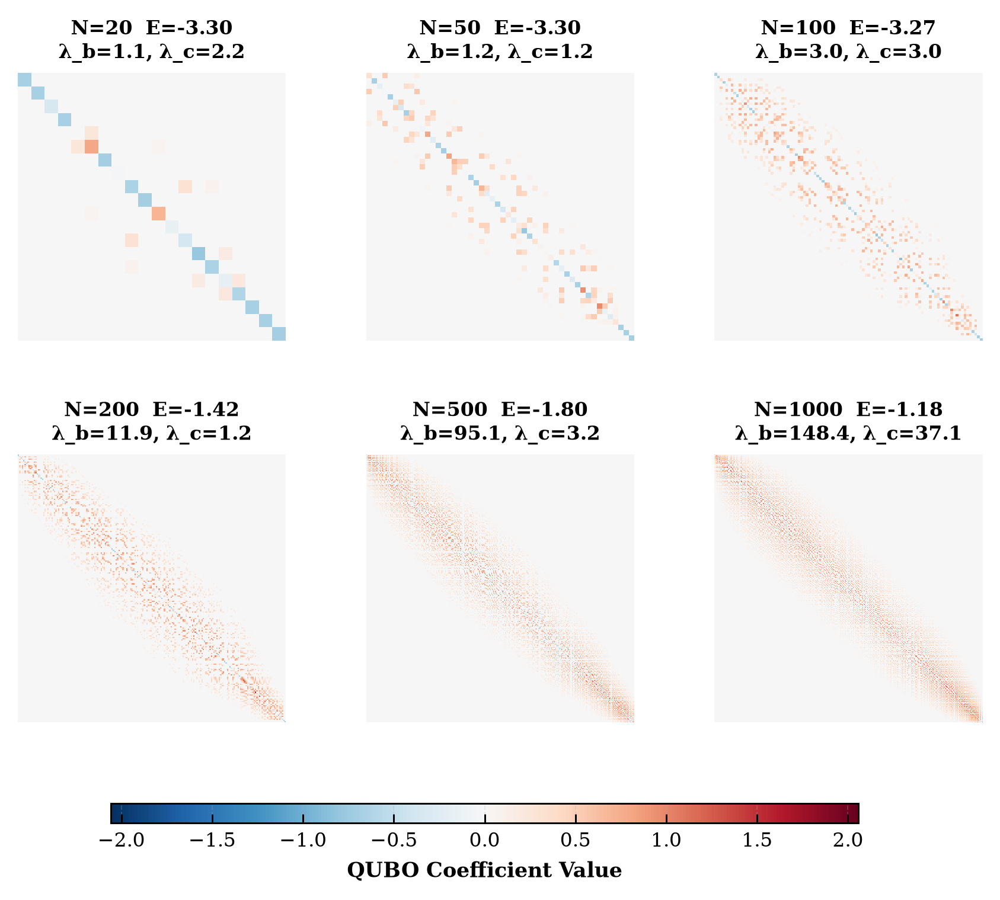


✅ QUBO matrix grid complete.


In [51]:
#@title CELL 8b: QUBO MATRIX GRID FOR WINNING LAMBDAS (2x3, IEEE Style)
"""
================================================================================
CELL 8b: QUBO MATRIX GRID FOR WINNING LAMBDAS
- Creates a 2x3 grid of QUBO matrix heatmaps using the winning lambdas
- Shows the complete QUBO matrix structure for each tier
- Uses IEEE publication-ready styling with shared colorbar
- Matches the style of CELL 5c but for QUBO matrices
================================================================================
"""

# -----------------------------------------------------------------------------
# IMPORTS & STYLING
# -----------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pickle
import json
from pathlib import Path
import re
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import matplotlib as mpl

# IEEE / Academic Professional Styling
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 8,
    'axes.titlesize': 9,
    'axes.labelsize': 8.5,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7.5,
    'lines.linewidth': 1.2,
    'lines.markersize': 4,
    'axes.grid': True,
    'grid.alpha': 0.25,
    'grid.linestyle': '--',
    'grid.linewidth': 0.5,
    'axes.linewidth': 0.7,
    'xtick.major.width': 0.7,
    'ytick.major.width': 0.7,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
})

# -----------------------------------------------------------------------------
# PATHS & CONFIG
# -----------------------------------------------------------------------------
# Ensure config_hash is defined (from Cell 1/2)
try:
    config_hash
except NameError:
    print("⚠️ config_hash not defined; please run Cell 1 & 2 first.")
    raise

# Ensure GDRIVE_BASE / LOCAL_CACHE exist
try:
    GDRIVE_BASE
except NameError:
    print("⚠️ GDRIVE_BASE not defined; using RESULTS_DIR from earlier.")
    try:
        GDRIVE_BASE = RESULTS_DIR
    except NameError:
        raise RuntimeError("Please run the path setup from Cell 1 or define GDRIVE_BASE.")

# -----------------------------------------------------------------------------
# LOAD WINNERS DATA
# -----------------------------------------------------------------------------
# Load winners from the JSON file saved in Cell 8
winners_path = GDRIVE_BASE / f"grid_search_winners_{config_hash}.json"
if not winners_path.exists():
    raise FileNotFoundError(f"Winners file not found: {winners_path}. Please run Cell 8 first.")

with open(winners_path, "r") as f:
    winners = json.load(f)

print(f"📂 Loaded winners for {len(winners)} tiers: {sorted(winners.keys())}")

# -----------------------------------------------------------------------------
# BUILD QUBO MATRIX FUNCTION
# -----------------------------------------------------------------------------
def build_qubo_matrix(instance_data, lambda_budget, lambda_conn):
    """
    Build the complete QUBO matrix from instance data and penalty weights.
    
    The QUBO formulation is:
    Q = a + λ_b * B + λ_c * C
    
    where:
    - a: diagonal terms (objective coefficients)
    - B: budget violation penalty matrix
    - C: connectivity violation penalty matrix
    """
    N = instance_data["N"]
    a = np.asarray(instance_data["a"], dtype=float)
    
    # Get Q_edges (the original MIQP off-diagonal terms)
    Q_edges = instance_data.get("Q_edges", [])
    
    # Build base matrix Q (MIQP)
    Q = np.zeros((N, N), dtype=float)
    np.fill_diagonal(Q, a)
    for i, j, val in Q_edges:
        Q[i, j] = val
        Q[j, i] = val
    
    # Add budget violation penalty
    b_edges = instance_data.get("b_edges", [])
    for i, j, val in b_edges:
        Q[i, j] += lambda_budget * val
        Q[j, i] += lambda_budget * val
    
    # Add connectivity violation penalty  
    c_edges = instance_data.get("c_edges", [])
    for i, j, val in c_edges:
        Q[i, j] += lambda_conn * val
        Q[j, i] += lambda_conn * val
    
    # Spatial sorting if coords available
    if "coords" in instance_data:
        coords_free = np.asarray(instance_data["coords"])
        order = np.lexsort((coords_free[:, 0], -coords_free[:, 1]))
        Q = Q[np.ix_(order, order)]
    
    return Q

# -----------------------------------------------------------------------------
# SINGLE QUBO MATRIX HEATMAP ON AXIS
# -----------------------------------------------------------------------------
def plot_qubo_matrix_on_ax(ax, mat, title=None, vmin=None, vmax=None):
    """
    Plot a single QUBO matrix heatmap on a given matplotlib axis.
    """
    # Determine colormap limits if not provided
    if vmin is None or vmax is None:
        max_abs = np.max(np.abs(mat))
        if max_abs > 0:
            vmin, vmax = -max_abs, max_abs
        else:
            vmin, vmax = -1.0, 1.0
    
    # Plot heatmap WITHOUT colorbar (shared colorbar will be added)
    sns.heatmap(mat, ax=ax, cmap='RdBu_r', 
                vmin=vmin, vmax=vmax,
                cbar=False,
                square=True,
                xticklabels=False,
                yticklabels=False,
                rasterized=True)
    
    if title:
        ax.set_title(title, fontsize=8, fontweight='bold')
    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    return vmin, vmax

# -----------------------------------------------------------------------------
# LOAD INSTANCE DATA AND BUILD QUBO MATRICES
# -----------------------------------------------------------------------------
# Discover instance data files (deduplicated by N)
pattern = re.compile(r"instance_data_N(\d+)_([a-f0-9]{8})\.pkl")
instance_files = []
seen_N_values = set()

# Check GDRIVE_BASE
for p in GDRIVE_BASE.glob("instance_data_N*_*.pkl"):
    m = pattern.match(p.name)
    if m and m.group(2) == config_hash:
        N_val = int(m.group(1))
        if N_val not in seen_N_values:
            instance_files.append(p)
            seen_N_values.add(N_val)

# Check LOCAL_CACHE
for p in LOCAL_CACHE.glob("instance_data_N*_*.pkl"):
    m = pattern.match(p.name)
    if m and m.group(2) == config_hash:
        N_val = int(m.group(1))
        if N_val not in seen_N_values:
            instance_files.append(p)
            seen_N_values.add(N_val)

# Sort by N
instance_files.sort(key=lambda p: int(pattern.match(p.name).group(1)) if pattern.match(p.name) else 0)

print(f"Found {len(instance_files)} unique instance data files")

# Load instance data and winners
qubo_matrices = []
titles = []
instance_data_cache = {}

# Get all N values that have winners
winner_Ns = sorted([int(N) for N in winners.keys()])

# Build QUBO matrix for each winner
for N_val in winner_Ns[:6]:  # Only first 6 for 2x3 grid
    # Find corresponding instance file
    inst_path = None
    for p in instance_files:
        m = pattern.match(p.name)
        if m and int(m.group(1)) == N_val:
            inst_path = p
            break
    
    if inst_path is None:
        print(f"⚠️ No instance file found for N={N_val}")
        continue
    
    # Load instance data
    if N_val not in instance_data_cache:
        with open(inst_path, "rb") as f:
            instance_data_cache[N_val] = pickle.load(f)
    
    instance_data = instance_data_cache[N_val]
    winner = winners[str(N_val)]
    
    # Get winning lambdas
    lambda_budget = winner["λ_budget"]
    lambda_conn = winner["λ_conn"]
    
    # Build QUBO matrix
    Q = build_qubo_matrix(instance_data, lambda_budget, lambda_conn)
    qubo_matrices.append(Q)
    
    # Create title with energy info
    energy = winner.get("Best Feasible Obj", np.nan)
    energy_str = f"E={energy:.2f}" if not np.isnan(energy) else ""
    titles.append(f"N={N_val}  {energy_str}\nλ_b={lambda_budget:.1f}, λ_c={lambda_conn:.1f}")
    
    print(f"📊 Built QUBO matrix for N={N_val} with λ_b={lambda_budget:.2f}, λ_c={lambda_conn:.2f}")

# -----------------------------------------------------------------------------
# CREATE 2x3 GRID WITH SHARED COLORBAR
# -----------------------------------------------------------------------------
n_plots = len(qubo_matrices)
if n_plots == 0:
    raise RuntimeError("No QUBO matrices to plot.")

n_rows = 2
n_cols = 3

# Create figure
fig = plt.figure(figsize=(7.0, 5.5))
gs = gridspec.GridSpec(n_rows, n_cols, figure=fig, 
                       hspace=0.15, wspace=0.3, 
                       top=0.88, bottom=0.15)

# Determine global colormap limits
global_vmin = 0
global_vmax = 0
for mat in qubo_matrices:
    max_abs = np.max(np.abs(mat))
    if max_abs > global_vmax:
        global_vmax = max_abs

if global_vmax == 0:
    global_vmax = 1.0
global_vmin = -global_vmax

print(f"Global colormap limits: ±{global_vmax:.4f}")

# Plot all matrices
for idx in range(min(n_plots, n_rows * n_cols)):
    row = idx // n_cols
    col = idx % n_cols
    ax = fig.add_subplot(gs[row, col])
    
    plot_qubo_matrix_on_ax(ax, qubo_matrices[idx], 
                           title=titles[idx] if idx < len(titles) else None,
                           vmin=global_vmin, vmax=global_vmax)

# Hide unused subplots
for idx in range(n_plots, n_rows * n_cols):
    row = idx // n_cols
    col = idx % n_cols
    fig.add_subplot(gs[row, col]).axis('off')

# --- ADD SHARED COLORBAR AT THE BOTTOM ---
norm = mpl.colors.Normalize(vmin=global_vmin, vmax=global_vmax)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='RdBu_r')
sm.set_array([])

cbar_ax = fig.add_axes([0.2, 0.08, 0.6, 0.02])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('QUBO Coefficient Value', fontsize=8.5, fontweight='bold')
cbar.ax.tick_params(labelsize=8)

# Save
save_path = GDRIVE_BASE / f"qubo_matrix_grid_winners_{config_hash}.png"
fig.savefig(save_path, dpi=600, bbox_inches='tight')
fig.savefig(save_path.with_suffix('.pdf'), dpi=600, bbox_inches='tight')
print(f"✅ QUBO matrix grid saved to {save_path} and PDF.")

plt.show()
plt.close(fig)

print("\n✅ QUBO matrix grid complete.")

Found 12 instance files: ['instance_data_N20_241358d8.pkl', 'instance_data_N20_241358d8.pkl', 'instance_data_N50_241358d8.pkl', 'instance_data_N50_241358d8.pkl', 'instance_data_N100_241358d8.pkl', 'instance_data_N100_241358d8.pkl', 'instance_data_N200_241358d8.pkl', 'instance_data_N200_241358d8.pkl', 'instance_data_N500_241358d8.pkl', 'instance_data_N500_241358d8.pkl', 'instance_data_N1000_241358d8.pkl', 'instance_data_N1000_241358d8.pkl']
✅ Greedy solution for N=20: Energy=-3.02
✅ Greedy solution for N=20: Energy=-3.02
✅ Greedy solution for N=50: Energy=-1.61
✅ Greedy solution for N=50: Energy=-1.61
✅ Greedy solution for N=100: Energy=-0.74
✅ Greedy solution for N=100: Energy=-0.74
✅ Greedy solution for N=200: Energy=-0.31
✅ Greedy solution for N=200: Energy=-0.31
✅ Greedy solution for N=500: Energy=-0.17
✅ Greedy solution for N=500: Energy=-0.17
✅ Greedy solution for N=1000: Energy=-1.33


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


✅ Greedy solution for N=1000: Energy=-1.33
📂 Loaded instance data for N=20
📂 Loaded instance data for N=50
📂 Loaded instance data for N=100
📂 Loaded instance data for N=200
📂 Loaded instance data for N=500
📂 Loaded instance data for N=1000
✅ Greedy deployment grid saved to /home/csiy/Documents/school/taiwan 4th yr intersession/Water Quality Monitoring Buoys/code/water-quality-qubo/results/greedy_deployment_grid_241358d8.png and PDF.


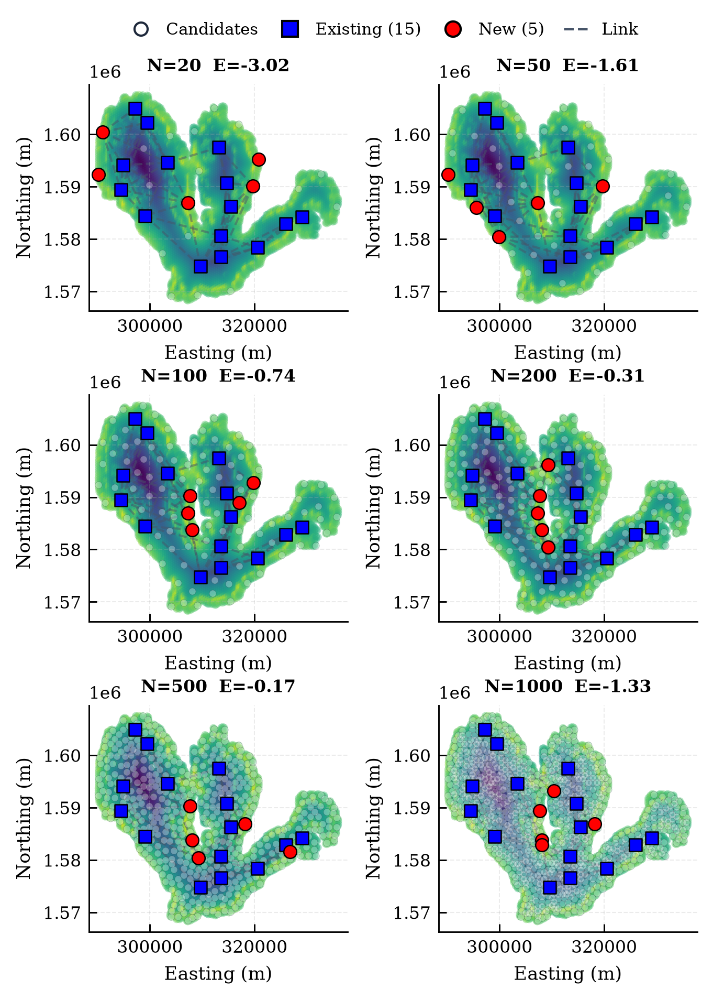


✅ Greedy deployment grid complete.


In [44]:
#@title CELL 5c: GREEDY DEPLOYMENT GRID (2x3, IEEE Style, No Metrics)
"""
================================================================================
GREEDY DEPLOYMENT GRID – IEEE STYLE (No metrics side panel)
- Creates a 2x3 grid of deployment maps for all Greedy-solved tiers.
- Styling matches Cell 9 (ICCE conference, IEEE standard).
- No metrics textbox; only the map with clear legend and titles.
- Legend is horizontal bar under main title.
- Candidate sites are smaller circles.
================================================================================
"""

# -----------------------------------------------------------------------------
# IMPORTS & STYLING
# -----------------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pickle
from pathlib import Path
import re
from matplotlib.collections import LineCollection
from matplotlib.lines import Line2D

# IEEE / Academic Professional Styling (identical to Cell 9)
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 8,
    'axes.titlesize': 9,
    'axes.labelsize': 8.5,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 7.5,
    'lines.linewidth': 1.2,
    'lines.markersize': 4,
    'axes.grid': True,
    'grid.alpha': 0.25,
    'grid.linestyle': '--',
    'grid.linewidth': 0.5,
    'axes.linewidth': 0.7,
    'xtick.major.width': 0.7,
    'ytick.major.width': 0.7,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight',
})

# Colorblind-friendly palette (from Cell 9)
C_BLUE   = '#0072B2'
C_ORANGE = '#E69F00'
C_GREEN  = '#009E73'
C_RED    = '#D55E00'
C_PURPLE = '#CC79A7'
C_GREY   = '#777777'

# -----------------------------------------------------------------------------
# PATHS & CONFIG
# -----------------------------------------------------------------------------
# Ensure config_hash is defined (from Cell 1/2)
try:
    config_hash
except NameError:
    print("⚠️ config_hash not defined; please run Cell 1 & 2 first.")
    raise

# Ensure GDRIVE_BASE / LOCAL_CACHE exist
try:
    GDRIVE_BASE
except NameError:
    print("⚠️ GDRIVE_BASE not defined; using RESULTS_DIR from earlier.")
    try:
        GDRIVE_BASE = RESULTS_DIR
    except NameError:
        raise RuntimeError("Please run the path setup from Cell 1 or define GDRIVE_BASE.")

# Load master data to get background utility and coordinates
master_path = GDRIVE_BASE / f"master_real_{config_hash}.pkl"
if not master_path.exists():
    master_path = LOCAL_CACHE / f"master_real_{config_hash}.pkl"
with open(master_path, "rb") as f:
    master_data = pickle.load(f)
coords_master = master_data["coords"]
U_master = master_data["U"]

# -----------------------------------------------------------------------------
# DISCOVER INSTANCE FILES (deduplicated)
# -----------------------------------------------------------------------------
pattern = re.compile(r"instance_data_N(\d+)_([a-f0-9]{8})\.pkl")
instance_files = []
seen_paths = set()

# Check GDRIVE_BASE
for p in GDRIVE_BASE.glob("instance_data_N*_*.pkl"):
    if p not in seen_paths:
        m = pattern.match(p.name)
        if m and m.group(2) == config_hash:
            instance_files.append(p)
            seen_paths.add(p)

# Check LOCAL_CACHE (add if not already seen)
for p in LOCAL_CACHE.glob("instance_data_N*_*.pkl"):
    if p not in seen_paths:
        m = pattern.match(p.name)
        if m and m.group(2) == config_hash:
            instance_files.append(p)
            seen_paths.add(p)

if not instance_files:
    raise FileNotFoundError("No instance data files found. Run Cell 4 first.")

# Sort by N
def extract_N_from_path(p):
    m = pattern.match(p.name)
    return int(m.group(1)) if m else 0
instance_files.sort(key=extract_N_from_path)

print(f"Found {len(instance_files)} instance files: {[p.name for p in instance_files]}")

# -----------------------------------------------------------------------------
# COMPUTE GREEDY SOLUTION FOR EACH INSTANCE
# -----------------------------------------------------------------------------
def compute_greedy_solution(instance_data):
    """
    Compute greedy solution for a single instance.
    Selects top K sites by utility U.
    """
    N = instance_data["N"]
    K = instance_data["K"]
    U = np.asarray(instance_data["U"], dtype=float)
    
    # Greedy: select top K by utility
    x_greedy = np.zeros(N, dtype=int)
    top_k_indices = np.argsort(-U)[:K]
    x_greedy[top_k_indices] = 1
    
    return x_greedy

def compute_energy_sparse(x, a, Q_edges):
    """Compute energy for sparse representation."""
    x = np.asarray(x, dtype=bool)
    energy = np.dot(a, x.astype(float))
    for i, j, val in Q_edges:
        if x[i] and x[j]:
            energy += val
    return float(energy)

def compute_master_energy(x_sol, snapped_indices, N_free, a_master, Q_master_edges):
    """Compute master energy for a solution."""
    x_master = np.zeros(len(a_master), dtype=int)
    for idx, val in enumerate(x_sol):
        if val == 1:
            mi = snapped_indices[idx]
            if mi < len(a_master):
                x_master[mi] = 1
    for k in range(N_free, len(snapped_indices)):
        mi = snapped_indices[k]
        if mi < len(a_master):
            x_master[mi] = 1
    return compute_energy_sparse(x_master, a_master, Q_master_edges)

# Load master data for energy computation
master_path = GDRIVE_BASE / f"master_real_{config_hash}.pkl"
if not master_path.exists():
    master_path = LOCAL_CACHE / f"master_real_{config_hash}.pkl"
with open(master_path, "rb") as f:
    md = pickle.load(f)
a_master = md["a"]
Q_master_edges = md["Q_edges"]

# Compute greedy solutions for all instances
greedy_solutions = {}
for inst_path in instance_files:
    N_true = extract_N_from_path(inst_path)
    with open(inst_path, "rb") as f:
        instance_data = pickle.load(f)
    
    # Compute greedy solution
    x_greedy = compute_greedy_solution(instance_data)
    
    # Compute master energy
    snapped_indices = instance_data["snapped_indices"]
    N_free = instance_data["N"]
    energy = compute_master_energy(x_greedy, snapped_indices, N_free, a_master, Q_master_edges)
    
    # Store solution
    greedy_solutions[N_true] = {
        "x": x_greedy,
        "energy": energy,
        "instance_data": instance_data,
        "path": inst_path
    }
    
    print(f"✅ Greedy solution for N={N_true}: Energy={energy:.2f}")

# Sort by N for grid
greedy_solutions_sorted = sorted(greedy_solutions.items())

# -----------------------------------------------------------------------------
# SINGLE DEPLOYMENT PLOT ON AXIS (No metrics, no legend)
# -----------------------------------------------------------------------------
def plot_greedy_deployment_on_ax(ax, instance_data, x_greedy, coords_master, U_master,
                                 title=None):
    """
    Plot a single deployment map on a given matplotlib axis.
    - No metrics textbox.
    - No legend (will be added separately).
    - Background utility, candidates, selected existing/new, edges.
    - Candidate sites are smaller circles (s=12 instead of s=20).
    - Existing sites in blue, new selected in red (same as SCIP).
    """
    # Extract data
    coords_full = np.asarray(instance_data["original_coords"])
    D_MAX = instance_data["D_max"]
    L_c = instance_data.get("L_c", None)
    fixed_indices = list(instance_data.get("fixed_indices", []))
    free_indices = list(instance_data.get("original_indices", []))
    snapped_indices = instance_data.get("snapped_indices", [])
    
    # Solution
    if x_greedy is None:
        ax.text(0.5, 0.5, "No solution", transform=ax.transAxes, ha='center', va='center')
        return
    x_greedy = np.asarray(x_greedy, dtype=int)
    
    # Map to original indices (handle snapped indices)
    if len(snapped_indices) > 0 and len(snapped_indices) == len(x_greedy):
        # Map from free indices back to original
        selected_free_orig = [free_indices[i] for i in np.where(x_greedy == 1)[0] if i < len(free_indices)]
    else:
        selected_free_orig = [free_indices[i] for i in np.where(x_greedy == 1)[0] if i < len(free_indices)]
    
    selected_new = [i for i in selected_free_orig if i not in fixed_indices]
    selected_m = fixed_indices
    all_selected = selected_new + selected_m

    # Background utility (if available)
    if coords_master is not None and U_master is not None:
        ax.scatter(coords_master[:, 0], coords_master[:, 1], c=U_master, cmap='viridis',
                   s=12, alpha=0.4, edgecolor='none', zorder=0)
    else:
        ax.scatter(coords_full[:, 0], coords_full[:, 1], c="#cbd5e1", s=12, alpha=0.4, edgecolor='none', zorder=0)

    # Edges among selected
    selected_edges = []
    valid_edges_lc = instance_data.get("valid_edges_lc", None)
    if valid_edges_lc is not None:
        for (i, j) in valid_edges_lc:
            if i in all_selected and j in all_selected:
                selected_edges.append((i, j))
    else:
        # Fallback: compute distance-based edges from D_MAX
        try:
            from scipy.spatial import cKDTree
            tree = cKDTree(coords_full)
            pairs = tree.query_pairs(r=D_MAX)
            for (i, j) in pairs:
                if i in all_selected and j in all_selected:
                    selected_edges.append((i, j))
        except:
            pass

    if selected_edges:
        segments = [[(coords_full[i, 0], coords_full[i, 1]),
                     (coords_full[j, 0], coords_full[j, 1])] for i, j in selected_edges]
        lc = LineCollection(segments, colors='#475569', alpha=0.5, linewidth=1.0,
                            linestyle='--', zorder=1)
        ax.add_collection(lc)

    # Plot candidates (background points) - SMALLER circles (s=12 instead of s=20)
    if free_indices:
        candidate_coords = coords_full[free_indices]
        ax.scatter(candidate_coords[:, 0], candidate_coords[:, 1], c='white', s=10,
                   alpha=0.3, edgecolor='#1e293b', linewidth=0.2, zorder=2)

    # Existing fixed sites
    if selected_m:
        ax.scatter(coords_full[selected_m, 0], coords_full[selected_m, 1],
                   c='blue', s=35, marker='s', edgecolor='black', linewidth=0.6,
                   zorder=3)
    # New selected sites
    if selected_new:
        ax.scatter(coords_full[selected_new, 0], coords_full[selected_new, 1],
                   c='red', s=35, marker='o', edgecolor='black', linewidth=0.6,
                   zorder=4)

    # Set limits (with padding)
    if coords_master is not None and len(coords_master) > 0:
        xmin, ymin = coords_master.min(axis=0)
        xmax, ymax = coords_master.max(axis=0)
    else:
        xmin, ymin = coords_full.min(axis=0)
        xmax, ymax = coords_full.max(axis=0)
    pad_x = max(0.05 * (xmax - xmin), 1.0)
    pad_y = max(0.05 * (ymax - ymin), 1.0)
    ax.set_xlim(xmin - pad_x, xmax + pad_x)
    ax.set_ylim(ymin - pad_y, ymax + pad_y)

    ax.set_aspect('equal', adjustable='datalim')
    ax.set_xlabel('Easting (m)')
    ax.set_ylabel('Northing (m)')

    if title:
        ax.set_title(title, fontsize=8, fontweight='bold')

# -----------------------------------------------------------------------------
# CREATE 2x3 GRID WITH HORIZONTAL LEGEND
# -----------------------------------------------------------------------------
# Load all instance data once into a dictionary keyed by N
instance_data_cache = {}
for N_true, sol_data in greedy_solutions_sorted[:6]:  # Only need first 6 for 2x3 grid
    instance_data_cache[N_true] = sol_data["instance_data"]
    print(f"📂 Loaded instance data for N={N_true}")

# Now create the grid
n_files = len(greedy_solutions_sorted)
n_rows = 3
n_cols = 2
n_plots = min(n_rows * n_cols, n_files)

if n_plots == 0:
    raise RuntimeError("No greedy solutions to plot.")

# Create figure with extra space at top for legend and title
fig = plt.figure(figsize=(5.0, 7.0))  # Slightly taller for legend
gs = gridspec.GridSpec(n_rows, n_cols, figure=fig, hspace=0.37, wspace=0.35, top=0.88)

# Track what's in the legend
has_new = False
has_existing = False
has_candidates = False
has_edges = False
sample_counts = {'new': 0, 'existing': 0, 'candidates': 0}

for idx in range(n_plots):
    row = idx // n_cols
    col = idx % n_cols
    ax = fig.add_subplot(gs[row, col])

    N_true, sol_data = greedy_solutions_sorted[idx]
    instance_data = sol_data["instance_data"]
    x_greedy = sol_data["x"]
    energy = sol_data["energy"]
    
    # Track what's in this plot for legend
    fixed_indices = list(instance_data.get("fixed_indices", []))
    free_indices = list(instance_data.get("original_indices", []))
    snapped_indices = instance_data.get("snapped_indices", [])
    
    if x_greedy is not None:
        x_greedy = np.asarray(x_greedy, dtype=int)
        if len(snapped_indices) > 0 and len(snapped_indices) == len(x_greedy):
            selected_free_orig = [free_indices[i] for i in np.where(x_greedy == 1)[0] if i < len(free_indices)]
        else:
            selected_free_orig = [free_indices[i] for i in np.where(x_greedy == 1)[0] if i < len(free_indices)]
        
        selected_new = [i for i in selected_free_orig if i not in fixed_indices]
        selected_m = fixed_indices
        if selected_new:
            has_new = True
            sample_counts['new'] = len(selected_new)
        if selected_m:
            has_existing = True
            sample_counts['existing'] = len(selected_m)
        if free_indices:
            has_candidates = True
            sample_counts['candidates'] = len(free_indices)
        # Check for edges
        selected_edges = []
        valid_edges_lc = instance_data.get("valid_edges_lc", None)
        if valid_edges_lc is not None:
            all_selected = selected_new + selected_m
            for (i, j) in valid_edges_lc:
                if i in all_selected and j in all_selected:
                    selected_edges.append((i, j))
        else:
            try:
                from scipy.spatial import cKDTree
                tree = cKDTree(np.asarray(instance_data["original_coords"]))
                pairs = tree.query_pairs(r=instance_data["D_max"])
                all_selected = selected_new + selected_m
                for (i, j) in pairs:
                    if i in all_selected and j in all_selected:
                        selected_edges.append((i, j))
            except:
                pass
        if selected_edges:
            has_edges = True

    # Title: N and energy
    if not np.isnan(energy):
        title = f"N={N_true}  E={energy:.2f}"
    else:
        title = f"N={N_true} (no solution)"
    
    # Plot (no legend on subplots)
    plot_greedy_deployment_on_ax(ax, instance_data, x_greedy, coords_master, U_master,
                                 title=title)

# Hide unused subplots (if any)
for idx in range(n_plots, n_rows * n_cols):
    row = idx // n_cols
    col = idx % n_cols
    fig.add_subplot(gs[row, col]).axis('off')

# -----------------------------------------------------------------------------
# ADD HORIZONTAL LEGEND UNDER MAIN TITLE
# -----------------------------------------------------------------------------
# Build legend handles based on what's actually in the plots
legend_elements = []

if has_candidates:
    legend_elements.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='white',
                                  markersize=6, markeredgecolor='#1e293b', linewidth=0.5,
                                  label=f'Candidates'))

if has_existing:
    legend_elements.append(Line2D([0], [0], marker='s', color='w', markerfacecolor='blue',
                                  markersize=7, markeredgecolor='black', linewidth=0.6,
                                  label=f'Existing ({sample_counts["existing"]})'))

if has_new:
    legend_elements.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='red',
                                  markersize=7, markeredgecolor='black', linewidth=0.6,
                                  label=f'New ({sample_counts["new"]})'))

if has_edges:
    legend_elements.append(Line2D([0], [0], color='#475569', linewidth=1.2, linestyle='--',
                                  label='Link'))

# Add legend above the subplots (horizontal)
if legend_elements:
    fig.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.95),
               ncol=len(legend_elements), frameon=True, framealpha=0.85, edgecolor='none',
               fontsize=7.5, handlelength=1.5, columnspacing=1.2)

# Save and show
save_path = GDRIVE_BASE / f"greedy_deployment_grid_{config_hash}.png"
fig.savefig(save_path, dpi=600, bbox_inches='tight')
fig.savefig(save_path.with_suffix('.pdf'), dpi=600, bbox_inches='tight')
print(f"✅ Greedy deployment grid saved to {save_path} and PDF.")

plt.show()
plt.close(fig)

print("\n✅ Greedy deployment grid complete.")

In [ ]:
#@title CELL 10: FINAL COMPARISON TABLE (Greedy, SA, SCIP)
"""
================================================================================
CELL 10: FINAL COMPARISON
- Uses precomputed greedy_results from Cell 9.
- Loads SCIP results and SA winners from Cells 5 & 8.
- Prints a summary table and exports LaTeX.
================================================================================
"""
import pandas as pd
import json

# Ensure master data is available (already loaded)
try:
    a_master
except NameError:
    with open(GDRIVE_BASE / f"master_real_{config_hash}.pkl", "rb") as f:
        md = pickle.load(f)
    a_master = md["a"]
    Q_master_edges = md["Q_edges"]

# Collect data
comparison_rows = []
for N_true in sorted(grid_results.keys()):
    # Greedy (from Cell 9)
    greedy = greedy_results[N_true]
    greedy_energy = greedy["energy"]
    greedy_feasible = greedy["feasible"]

    # SA winner (from Cell 8)
    winner = winners[N_true]
    sa_energy = winner["Best Feasible Obj"]  # already master energy
    sa_feas = winner["Feasibility (%)"]

    # SCIP (from Cell 5)
    scip_path = GDRIVE_BASE / f"scip_result_N{N_true}_{config_hash}.pkl"
    if not scip_path.exists():
        scip_path = LOCAL_CACHE / f"scip_result_N{N_true}_{config_hash}.pkl"
    scip_energy = np.nan
    if scip_path.exists():
        with open(scip_path, "rb") as f:
            scip_res = pickle.load(f)
        if scip_res.get("feasible", False):
            scip_energy = scip_res.get("master_energy", np.nan)

    row = {
        "N": N_true,
        "Greedy Energy": greedy_energy,
        "Greedy Feasible": greedy_feasible,
        "SA Energy": sa_energy,
        "SA Feasibility (%)": sa_feas,
        "SCIP Energy": scip_energy,
    }
    comparison_rows.append(row)

df = pd.DataFrame(comparison_rows)

# Compute gaps and improvements
df["SA Gap vs SCIP"] = df.apply(
    lambda r: r["SA Energy"] - r["SCIP Energy"] if not np.isnan(r["SCIP Energy"]) else np.nan,
    axis=1
)
df["SA Improvement vs Greedy (%)"] = df.apply(
    lambda r: (r["Greedy Energy"] - r["SA Energy"]) / abs(r["Greedy Energy"]) * 100
    if r["Greedy Energy"] != 0 and r["SA Energy"] is not None else np.nan,
    axis=1
)

# Print table with nice formatting
print("\n" + "="*120)
print("📊 FINAL COMPARISON: GREEDY vs SA (TUNED) vs SCIP (OPTIMAL)")
print("="*120)
print(df.to_string(index=False, float_format="%.4f"))

# Export CSV and LaTeX
df.to_csv(GDRIVE_BASE / f"final_comparison_{config_hash}.csv", index=False)
latex_table = df.to_latex(index=False, caption="Comparison of solution quality across methods.",
                          label="tab:final_comparison", column_format="|c|r|r|r|r|r|r|")
print("\n📝 LaTeX Table:\n", latex_table)
with open(GDRIVE_BASE / f"final_comparison_{config_hash}.tex", "w") as f:
    f.write(latex_table)

print(f"\n✅ Cell 10 complete. Data saved to {GDRIVE_BASE}")


📊 FINAL COMPARISON: GREEDY vs SA (TUNED) vs SCIP (OPTIMAL)
 N  Greedy Energy  Greedy Feasible  SA Energy  SA Feasibility (%)  SCIP Energy  SA Gap vs SCIP  SA Improvement vs Greedy (%)
10        -1.1100             True     1.9986             99.7458          NaN             NaN                     -280.0608
20        -1.8860             True     1.6430             93.6174          NaN             NaN                     -187.1199
30        -0.1188             True     0.8106             90.6505          NaN             NaN                     -782.5367

📝 LaTeX Table:
 \begin{table}
\caption{Comparison of solution quality across methods.}
\label{tab:final_comparison}
\begin{tabular}{|c|r|r|r|r|r|r|}
\toprule
N & Greedy Energy & Greedy Feasible & SA Energy & SA Feasibility (%) & SCIP Energy & SA Gap vs SCIP & SA Improvement vs Greedy (%) \\
\midrule
10 & -1.109961 & True & 1.998605 & 99.745782 & NaN & NaN & -280.060797 \\
20 & -1.885958 & True & 1.643045 & 93.617415 & NaN & NaN & -187.

In [ ]:
#@title CELL 10.5: SA DEPLOYMENT VISUALIZATION (Mirror of SCIP)
"""
Generate deployment and matrix plots for SA-tuned solutions
to compare directly with SCIP results.
"""

for N in sorted(winners.keys()):
    # Get winning penalties
    winner = winners[N]
    lb, lc = winner['lambda_budget'], winner['lambda_conn']
    
    # Load instance
    inst_path = GDRIVE_BASE / f"instance_data_N{N}_{config_hash}.pkl"
    with open(inst_path, "rb") as f:
        instance_data = pickle.load(f)
    
    # Run SA one more time with winning penalties to get actual solution
    instance_data = adapt_sparse_to_dense(instance_data)
    model = build_augmented_model()
    compiled_instance = compile_instance(model, instance_data)
    penalty_weights = get_penalty_weights(compiled_instance, lb, lc)
    qubo_dict, offset = compiled_instance.to_qubo(penalty_weights=penalty_weights)
    
    sampler = oj.SASampler()
    response = sampler.sample_qubo(qubo_dict, num_reads=1024, num_sweeps=max(1000, 10*N), sparse=True)
    
    # Get best feasible sample
    X = decode_response(response, instance_data["N"])
    energies = compute_energy_batch(X, instance_data["a"], instance_data["Q"])
    _, _, is_feasible = check_feasibility_batch(
        X, instance_data["neigh"], instance_data["K"], instance_data["fixed_neighbors"]
    )
    
    if np.any(is_feasible):
        best_idx = np.argmin(np.where(is_feasible, energies, np.inf))
        x_sol = X[best_idx].astype(int)
        
        # Create metrics dict
        metrics = {
            'energy': float(energies[best_idx]),
            'feasible': True,
            'budget_viol': 0,
            'conn_viol': 0,
        }
        
        # Create fake SCIP result dict for plotting
        sa_result = {
            'solution': x_sol,
            'energy': metrics['energy'],
            'feasible': True,
        }
        
        # Plot deployment
        plot_deployment(instance_data, sa_result, 
                       save_path=GDRIVE_BASE / f"deployment_SA_N{N}_{config_hash}.png",
                       show=True, metrics=metrics)
        
        # Plot matrix
        plot_miqp_matrix_reduced(instance_data, 
                                save_path=GDRIVE_BASE / f"matrix_SA_N{N}_{config_hash}.png",
                                show=True)

KeyError: 'lambda_budget'